# Vanilla GAN on MNIST 

# Import 

In [4]:
''' basic package '''
import os
# 告訴系統要第幾張卡被看到。 Ex. 硬體總共有8張顯卡，以下設定只讓系統看到第1張顯卡
# 若沒設定，則 Tensorflow 在運行時，預設會把所有卡都佔用
# 要看裝置內顯卡數量及目前狀態的話，請在終端機內輸入 "nvidia-smi"
# 若你的裝置只有一張顯卡可以使用，可以忽略此設定
os.environ["CUDA_VISIBLE_DEVICES"] = '0'
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

''' tensorflow package '''
import tensorflow as tf
from tensorflow.examples.tutorials.mnist import input_data


# Config 

In [5]:
batch_size = 128
Z_dim = 100        # demesion of noise vector z for generator input
max_iter = 1000000
mnist = input_data.read_data_sets('/data/examples/MNIST_data', one_hot=True)

Extracting /data/examples/MNIST_data/train-images-idx3-ubyte.gz
Extracting /data/examples/MNIST_data/train-labels-idx1-ubyte.gz
Extracting /data/examples/MNIST_data/t10k-images-idx3-ubyte.gz
Extracting /data/examples/MNIST_data/t10k-labels-idx1-ubyte.gz


# Train 

### 定義 generator & discriminator 

In [6]:
def xavier_init(size):
    in_dim = size[0]
    xavier_stddev = 1. / tf.sqrt(in_dim / 2.)
    return tf.random_normal(shape=size, stddev=xavier_stddev)

#### Define model ####
def generator(z):
    with tf.variable_scope('generator', reuse=tf.AUTO_REUSE): 
        with tf.variable_scope('hidden_layer'):
            G_W1 = tf.get_variable(name='weight_1', dtype=tf.float32, initializer=xavier_init([100, 128]))
            G_b1 = tf.get_variable(name='bias_1', dtype=tf.float32, initializer=tf.zeros(shape=[128]))
            G_h1 = tf.nn.relu(tf.matmul(z, G_W1) + G_b1)

        with tf.variable_scope('output_layer'):
            G_W2 = tf.get_variable(name='weight_2', dtype=tf.float32, initializer=xavier_init([128, 784]))
            G_b2 = tf.get_variable(name='bias_2', dtype=tf.float32, initializer=tf.zeros(shape=[784]))
            G_prob = tf.nn.sigmoid(tf.matmul(G_h1, G_W2) + G_b2)

    return G_prob

def discriminator(x):
    with tf.variable_scope('discriminator', reuse=tf.AUTO_REUSE):
        with tf.variable_scope('hidden_layer'):
            D_W1 = tf.get_variable(name='weight_1', dtype=tf.float32, initializer=xavier_init([784, 128]))
            D_b1 = tf.get_variable(name='bias_1', dtype=tf.float32, initializer=tf.zeros(shape=[128]))
            D_h1 = tf.nn.relu(tf.matmul(x, D_W1) + D_b1)

        with tf.variable_scope('output_layer'):
            D_W2 = tf.get_variable(name='weight_2', dtype=tf.float32, initializer=xavier_init([128, 1]))
            D_b2 = tf.get_variable(name='bias_2', dtype=tf.float32, initializer=tf.zeros([1]))
            D_logit = tf.matmul(D_h1, D_W2) + D_b2
            D_prob = tf.nn.sigmoid(D_logit)

    return D_prob, D_logit


### Tensorflow- 建立靜態圖 

**靜態圖**就像一張計畫圖一樣，定義我們的計算流程。實際運算必須靠 **<span style="color:red;"> Session </span>** 來執行



In [7]:
main_graph = tf.Graph()
sess = tf.Session(graph=main_graph)

with main_graph.as_default():
    
   #### placeholder ####
    Z = tf.placeholder(name='z', dtype=tf.float32, shape=[None, 100])                # generator input
    input_img = tf.placeholder(name='real_img', dtype=tf.float32, shape=[None, 784]) # discriminator input

    #### GAN model output ####  
    G_sample = generator(Z)
    D_real, D_logit_real = discriminator(input_img)
    D_fake, D_logit_fake = discriminator(G_sample)

    #### loss ####
    D_loss_real = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=D_logit_real, labels=tf.ones_like(D_logit_real)))
    D_loss_fake = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=D_logit_fake, labels=tf.zeros_like(D_logit_fake)))
    D_loss = D_loss_real + D_loss_fake
    G_loss = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=D_logit_fake, labels=tf.ones_like(D_logit_fake)))

    #### variable list ####
    varList = tf.trainable_variables()
    G_varList = [var for var in varList if 'generator' in var.name]
    D_varList = [var for var in varList if 'discriminator' in var.name]
    
    #### update ####
    D_optimizer = tf.train.AdamOptimizer().minimize(D_loss, var_list=D_varList)
    G_optimizer = tf.train.AdamOptimizer().minimize(G_loss, var_list=G_varList)

    init = tf.global_variables_initializer()

### Tensorflow- 初始化模型

In [8]:
#### initialize model ####
sess.run(init)

### Tensorflow- 實際執行模型訓練

In [9]:
def sample_Z(m, n):
        return np.random.uniform(-1., 1., size=[m, n])

def plot(samples):
    fig = plt.figure(figsize=(4, 4))
    gs = gridspec.GridSpec(4, 4)
    gs.update(wspace=0.05, hspace=0.05)

    for i, sample in enumerate(samples):
        ax = plt.subplot(gs[i])
        plt.axis('off')
        ax.set_xticklabels([])
        ax.set_yticklabels([])
        ax.set_aspect('equal')
        plt.imshow(sample.reshape(28, 28), cmap='Greys_r')

    return fig

Iter: 0
D loss: 1.688
G_loss: 1.767


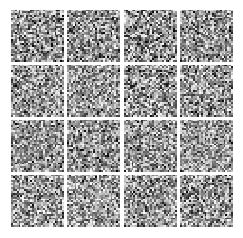

############################
Iter: 1000
D loss: 0.006968
G_loss: 8.57


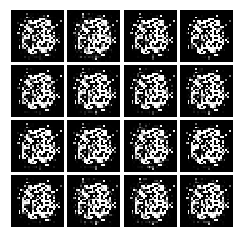

############################
Iter: 2000
D loss: 0.007961
G_loss: 7.233


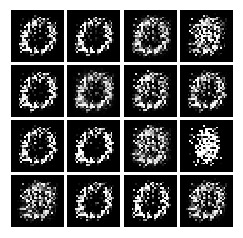

############################
Iter: 3000
D loss: 0.04125
G_loss: 5.355


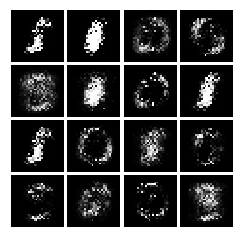

############################
Iter: 4000
D loss: 0.1167
G_loss: 5.5


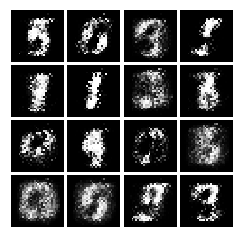

############################
Iter: 5000
D loss: 0.2526
G_loss: 6.019


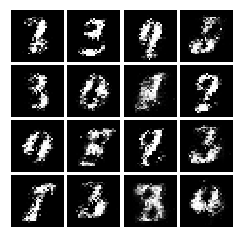

############################
Iter: 6000
D loss: 0.3569
G_loss: 5.17


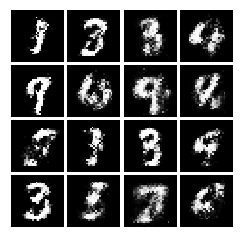

############################
Iter: 7000
D loss: 0.3776
G_loss: 4.35


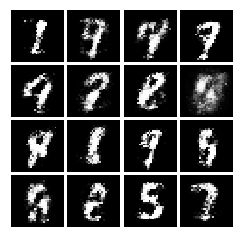

############################
Iter: 8000
D loss: 0.3433
G_loss: 3.154


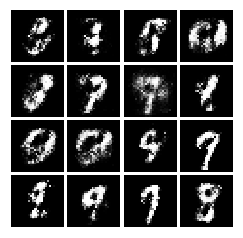

############################
Iter: 9000
D loss: 0.5988
G_loss: 3.58


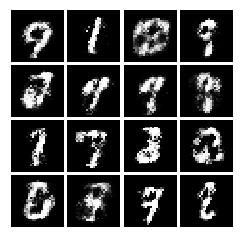

############################
Iter: 10000
D loss: 0.5521
G_loss: 3.543


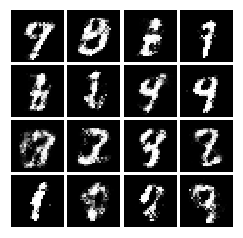

############################
Iter: 11000
D loss: 0.7025
G_loss: 2.458


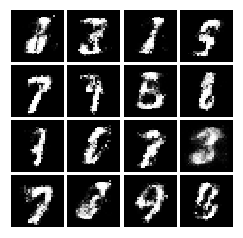

############################
Iter: 12000
D loss: 0.8666
G_loss: 3.019


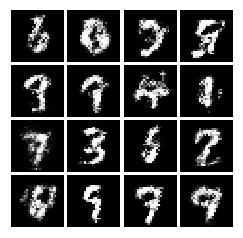

############################
Iter: 13000
D loss: 0.7461
G_loss: 3.029


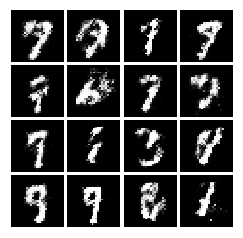

############################
Iter: 14000
D loss: 0.7479
G_loss: 3.046


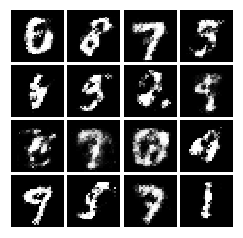

############################
Iter: 15000
D loss: 0.5725
G_loss: 2.553


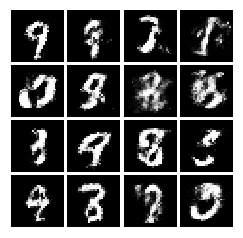

############################
Iter: 16000
D loss: 0.6706
G_loss: 2.184


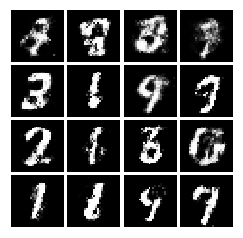

############################
Iter: 17000
D loss: 0.8196
G_loss: 1.873


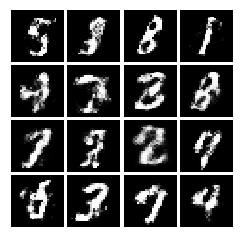

############################
Iter: 18000
D loss: 0.7844
G_loss: 2.163


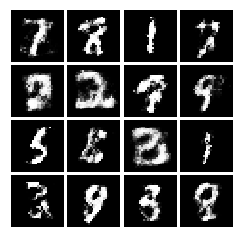

############################
Iter: 19000
D loss: 0.6646
G_loss: 2.512


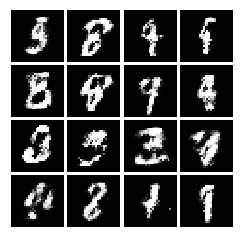

############################
Iter: 20000
D loss: 0.9512
G_loss: 1.814


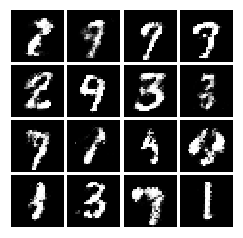

############################
Iter: 21000
D loss: 0.7373
G_loss: 2.027


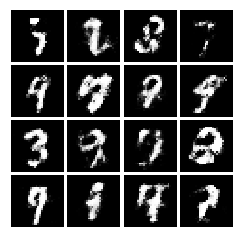

############################
Iter: 22000
D loss: 0.6625
G_loss: 2.221


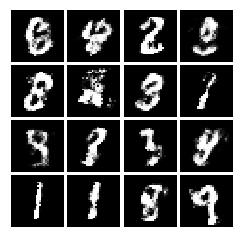

############################
Iter: 23000
D loss: 0.8919
G_loss: 1.982


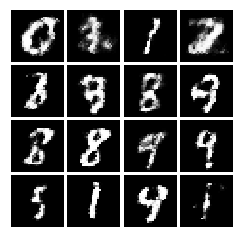

############################
Iter: 24000
D loss: 0.7755
G_loss: 1.879


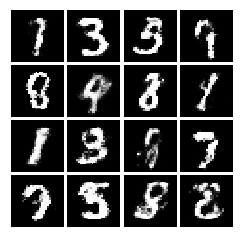

############################
Iter: 25000
D loss: 0.7886
G_loss: 2.071


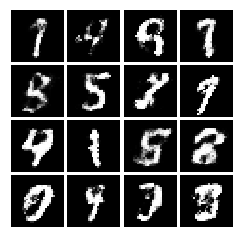

############################
Iter: 26000
D loss: 0.8183
G_loss: 2.234


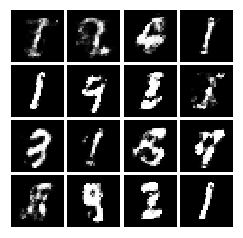

############################
Iter: 27000
D loss: 0.63
G_loss: 2.593


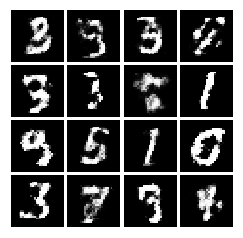

############################
Iter: 28000
D loss: 0.7497
G_loss: 2.019


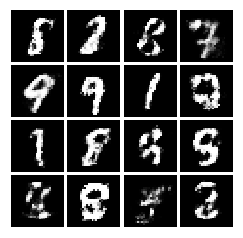

############################
Iter: 29000
D loss: 0.7419
G_loss: 1.923


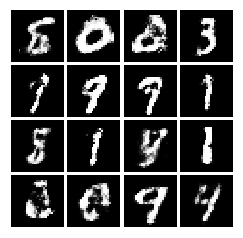

############################
Iter: 30000
D loss: 0.7019
G_loss: 2.304


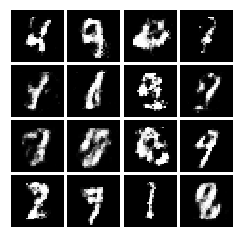

############################
Iter: 31000
D loss: 0.5702
G_loss: 2.024


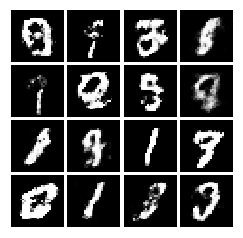

############################
Iter: 32000
D loss: 0.729
G_loss: 1.942


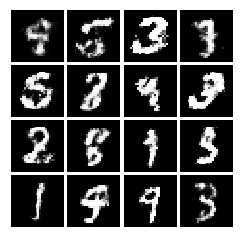

############################
Iter: 33000
D loss: 0.5879
G_loss: 2.339


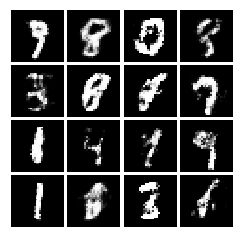

############################
Iter: 34000
D loss: 0.7656
G_loss: 2.194


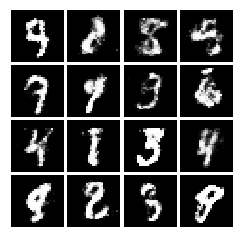

############################
Iter: 35000
D loss: 0.6913
G_loss: 2.307


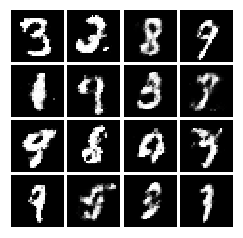

############################
Iter: 36000
D loss: 0.8692
G_loss: 2.397


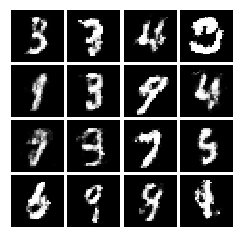

############################
Iter: 37000
D loss: 0.7259
G_loss: 2.331


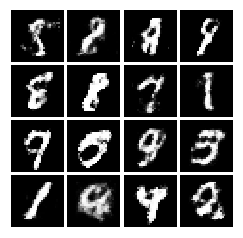

############################
Iter: 38000
D loss: 0.7537
G_loss: 2.234


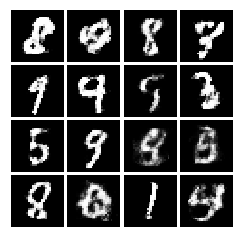

############################
Iter: 39000
D loss: 0.6964
G_loss: 2.47


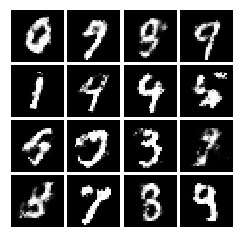

############################
Iter: 40000
D loss: 0.6002
G_loss: 2.205


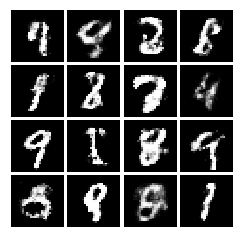

############################
Iter: 41000
D loss: 0.4936
G_loss: 2.422


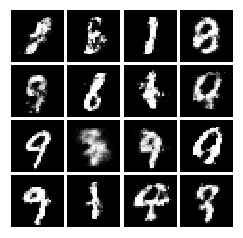

############################
Iter: 42000
D loss: 0.6758
G_loss: 2.449


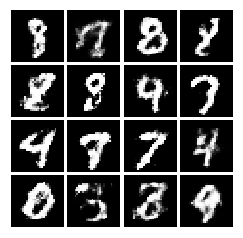

############################
Iter: 43000
D loss: 0.6438
G_loss: 2.184


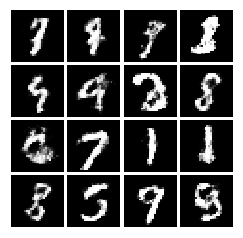

############################
Iter: 44000
D loss: 0.5482
G_loss: 2.433


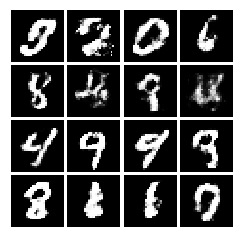

############################
Iter: 45000
D loss: 0.5946
G_loss: 2.328


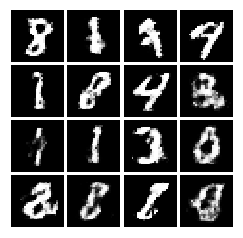

############################
Iter: 46000
D loss: 0.5174
G_loss: 2.353


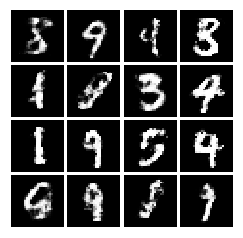

############################
Iter: 47000
D loss: 0.6304
G_loss: 2.483


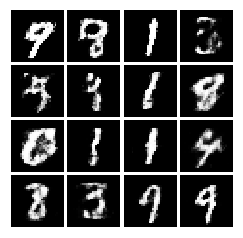

############################
Iter: 48000
D loss: 0.6001
G_loss: 2.128


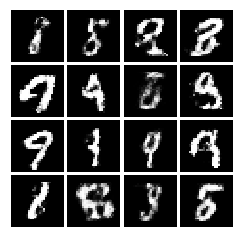

############################
Iter: 49000
D loss: 0.5104
G_loss: 2.469


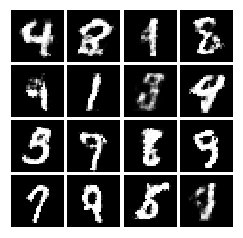

############################
Iter: 50000
D loss: 0.6628
G_loss: 2.576


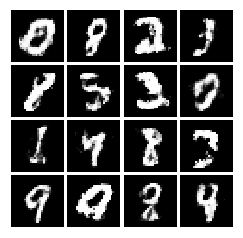

############################
Iter: 51000
D loss: 0.746
G_loss: 2.312


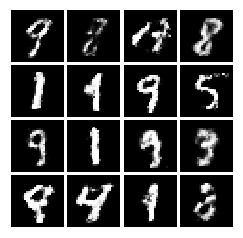

############################
Iter: 52000
D loss: 0.5499
G_loss: 2.487


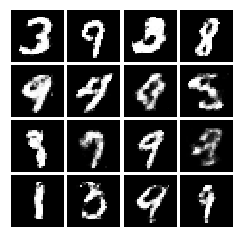

############################
Iter: 53000
D loss: 0.6519
G_loss: 2.299


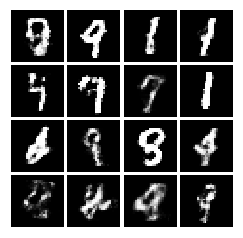

############################
Iter: 54000
D loss: 0.7437
G_loss: 2.563


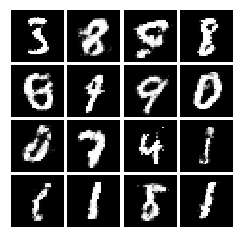

############################
Iter: 55000
D loss: 0.5291
G_loss: 2.159


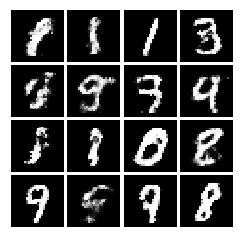

############################
Iter: 56000
D loss: 0.6007
G_loss: 2.302


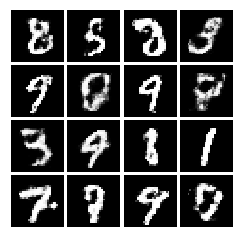

############################
Iter: 57000
D loss: 0.6194
G_loss: 2.688


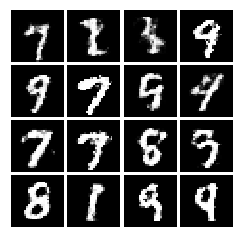

############################
Iter: 58000
D loss: 0.6882
G_loss: 2.487


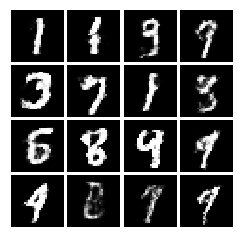

############################
Iter: 59000
D loss: 0.5747
G_loss: 2.171


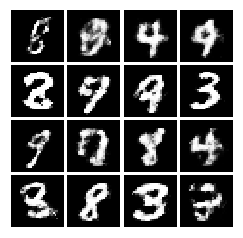

############################
Iter: 60000
D loss: 0.6894
G_loss: 2.453


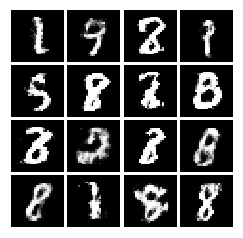

############################
Iter: 61000
D loss: 0.7227
G_loss: 1.875


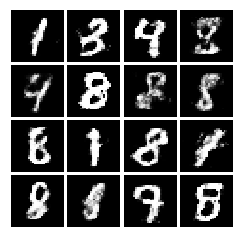

############################
Iter: 62000
D loss: 0.5937
G_loss: 2.651


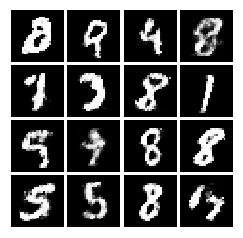

############################
Iter: 63000
D loss: 0.6828
G_loss: 2.577


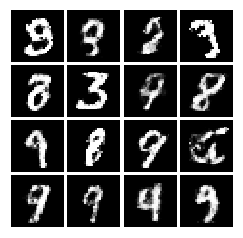

############################
Iter: 64000
D loss: 0.6838
G_loss: 2.114


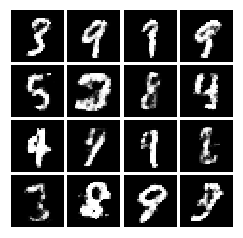

############################
Iter: 65000
D loss: 0.7161
G_loss: 2.216


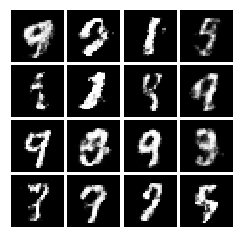

############################
Iter: 66000
D loss: 0.5807
G_loss: 2.25


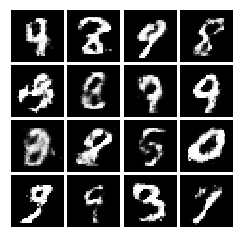

############################
Iter: 67000
D loss: 0.6925
G_loss: 2.188


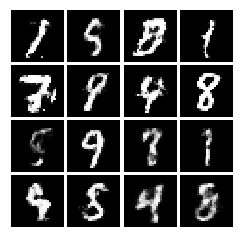

############################
Iter: 68000
D loss: 0.6207
G_loss: 2.232


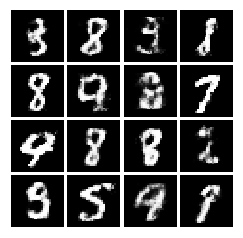

############################
Iter: 69000
D loss: 0.6156
G_loss: 2.217


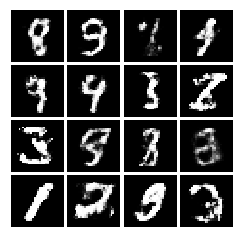

############################
Iter: 70000
D loss: 0.687
G_loss: 2.745


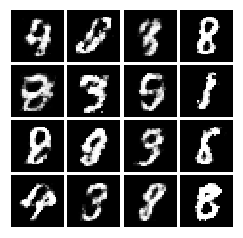

############################
Iter: 71000
D loss: 0.6188
G_loss: 2.407


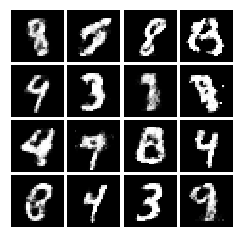

############################
Iter: 72000
D loss: 0.668
G_loss: 2.473


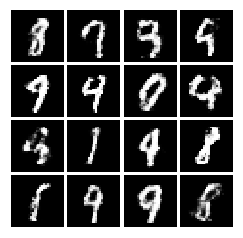

############################
Iter: 73000
D loss: 0.6953
G_loss: 2.855


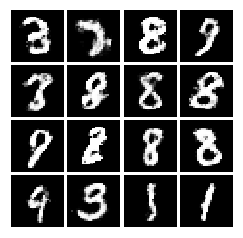

############################
Iter: 74000
D loss: 0.6044
G_loss: 2.298


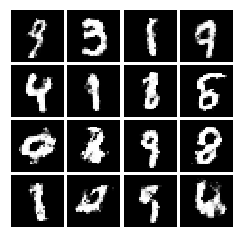

############################
Iter: 75000
D loss: 0.7422
G_loss: 2.611


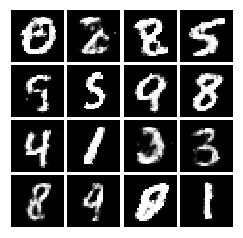

############################
Iter: 76000
D loss: 0.567
G_loss: 2.774


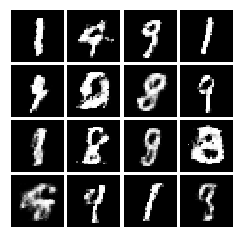

############################
Iter: 77000
D loss: 0.6268
G_loss: 2.481


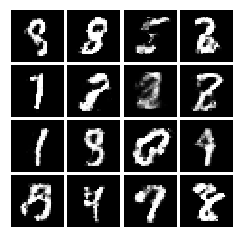

############################
Iter: 78000
D loss: 0.5446
G_loss: 2.712


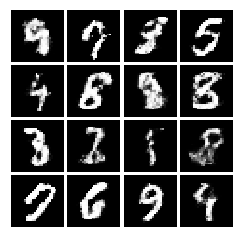

############################
Iter: 79000
D loss: 0.7483
G_loss: 2.045


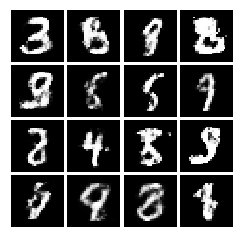

############################
Iter: 80000
D loss: 0.4977
G_loss: 2.425


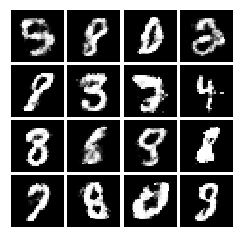

############################
Iter: 81000
D loss: 0.6091
G_loss: 2.346


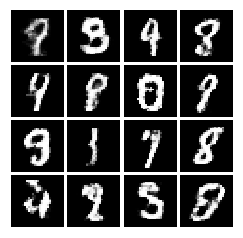

############################
Iter: 82000
D loss: 0.7807
G_loss: 2.137


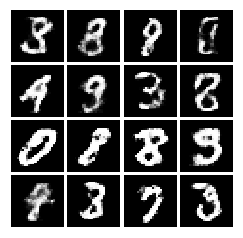

############################
Iter: 83000
D loss: 0.6193
G_loss: 2.264


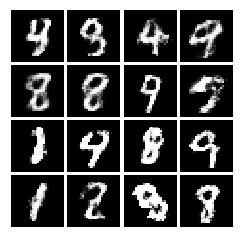

############################
Iter: 84000
D loss: 0.5535
G_loss: 2.529


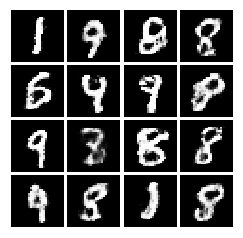

############################
Iter: 85000
D loss: 0.6842
G_loss: 2.492


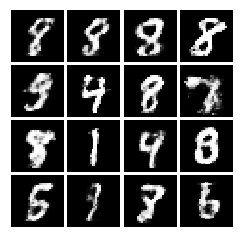

############################
Iter: 86000
D loss: 0.5099
G_loss: 2.894


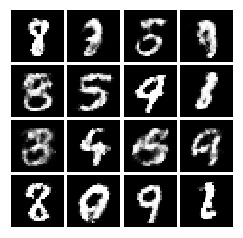

############################
Iter: 87000
D loss: 0.7595
G_loss: 2.442


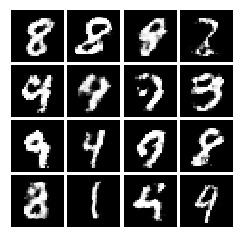

############################
Iter: 88000
D loss: 0.6683
G_loss: 2.442


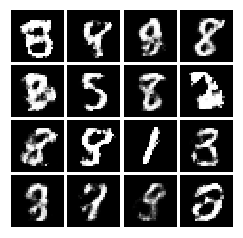

############################
Iter: 89000
D loss: 0.493
G_loss: 2.235


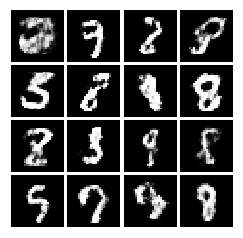

############################
Iter: 90000
D loss: 0.5897
G_loss: 2.468


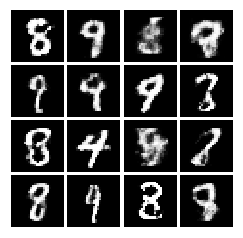

############################
Iter: 91000
D loss: 0.613
G_loss: 2.31


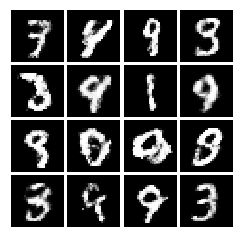

############################
Iter: 92000
D loss: 0.6775
G_loss: 2.445


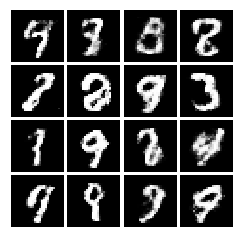

############################
Iter: 93000
D loss: 0.458
G_loss: 2.627


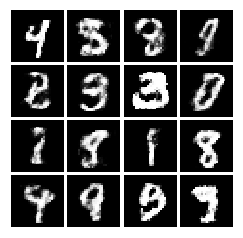

############################
Iter: 94000
D loss: 0.5888
G_loss: 2.751


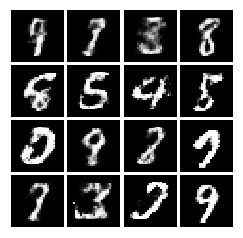

############################
Iter: 95000
D loss: 0.5902
G_loss: 2.405


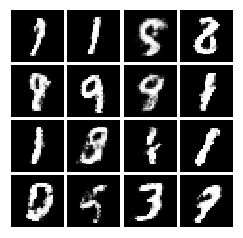

############################
Iter: 96000
D loss: 0.5311
G_loss: 2.581


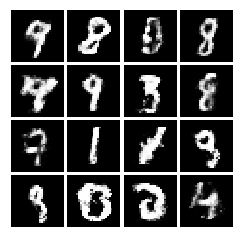

############################
Iter: 97000
D loss: 0.579
G_loss: 2.565


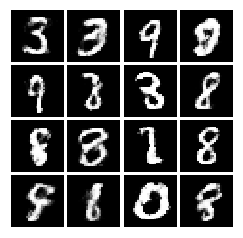

############################
Iter: 98000
D loss: 0.719
G_loss: 2.269


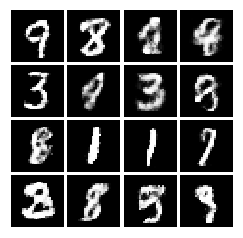

############################
Iter: 99000
D loss: 0.5844
G_loss: 2.271


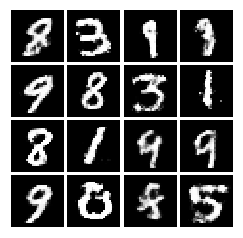

############################
Iter: 100000
D loss: 0.6969
G_loss: 2.658


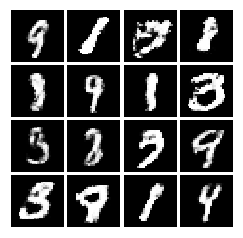

############################
Iter: 101000
D loss: 0.6208
G_loss: 2.345


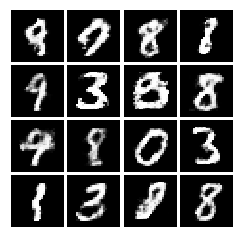

############################
Iter: 102000
D loss: 0.5951
G_loss: 2.248


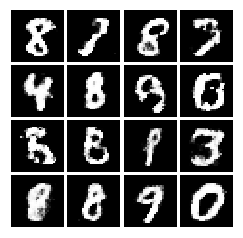

############################
Iter: 103000
D loss: 0.4871
G_loss: 2.275


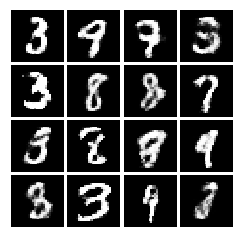

############################
Iter: 104000
D loss: 0.5378
G_loss: 2.541


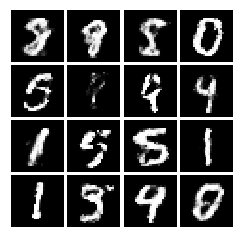

############################
Iter: 105000
D loss: 0.5289
G_loss: 2.726


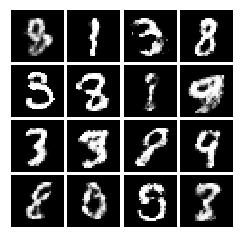

############################
Iter: 106000
D loss: 0.5442
G_loss: 2.572


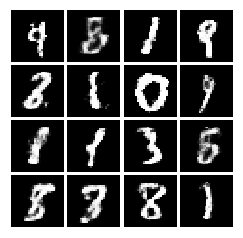

############################
Iter: 107000
D loss: 0.5821
G_loss: 2.613


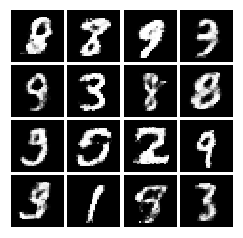

############################
Iter: 108000
D loss: 0.5287
G_loss: 2.743


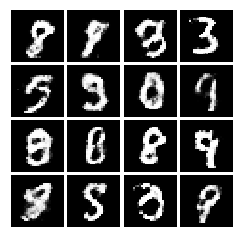

############################
Iter: 109000
D loss: 0.5794
G_loss: 3.02


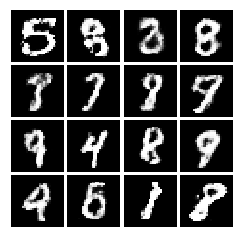

############################
Iter: 110000
D loss: 0.5404
G_loss: 1.853


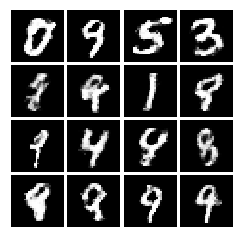

############################
Iter: 111000
D loss: 0.566
G_loss: 2.736


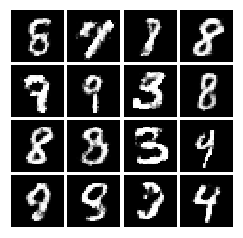

############################
Iter: 112000
D loss: 0.6303
G_loss: 2.667


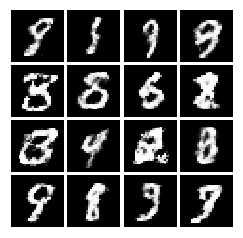

############################
Iter: 113000
D loss: 0.5814
G_loss: 2.387


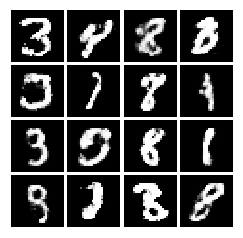

############################
Iter: 114000
D loss: 0.7316
G_loss: 2.517


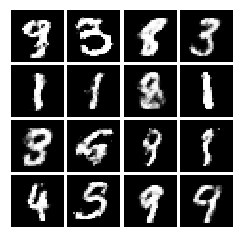

############################
Iter: 115000
D loss: 0.5731
G_loss: 2.39


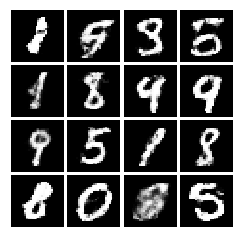

############################
Iter: 116000
D loss: 0.5191
G_loss: 2.182


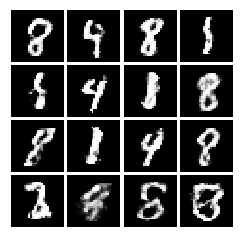

############################
Iter: 117000
D loss: 0.459
G_loss: 2.595


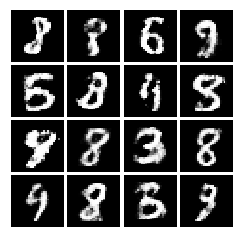

############################
Iter: 118000
D loss: 0.6292
G_loss: 3.029


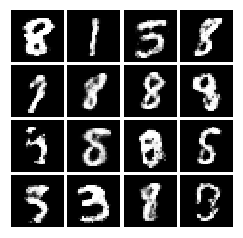

############################
Iter: 119000
D loss: 0.5012
G_loss: 2.548


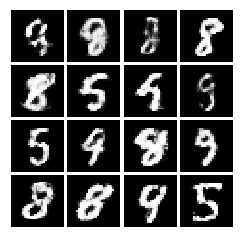

############################
Iter: 120000
D loss: 0.5632
G_loss: 2.603


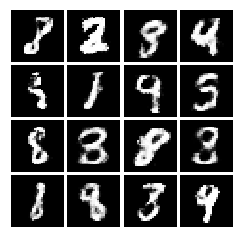

############################
Iter: 121000
D loss: 0.5149
G_loss: 2.417


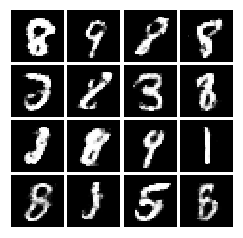

############################
Iter: 122000
D loss: 0.5673
G_loss: 2.626


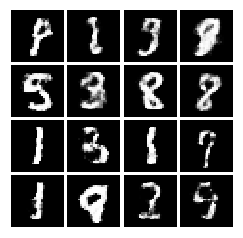

############################
Iter: 123000
D loss: 0.6635
G_loss: 3.097


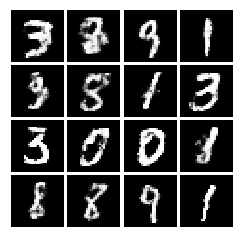

############################
Iter: 124000
D loss: 0.4152
G_loss: 2.965


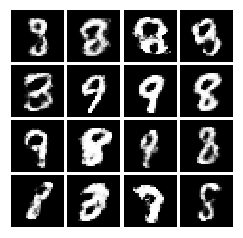

############################
Iter: 125000
D loss: 0.62
G_loss: 2.543


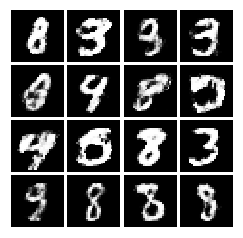

############################
Iter: 126000
D loss: 0.4952
G_loss: 2.75


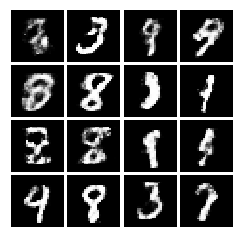

############################
Iter: 127000
D loss: 0.4709
G_loss: 2.697


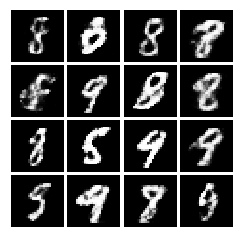

############################
Iter: 128000
D loss: 0.6572
G_loss: 2.756


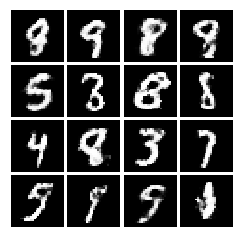

############################
Iter: 129000
D loss: 0.5074
G_loss: 2.46


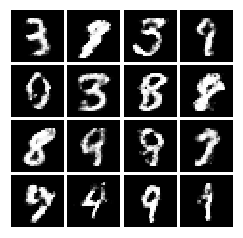

############################
Iter: 130000
D loss: 0.5688
G_loss: 2.548


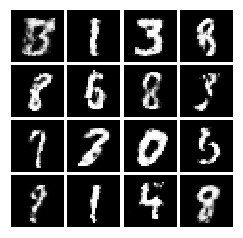

############################
Iter: 131000
D loss: 0.5554
G_loss: 2.626


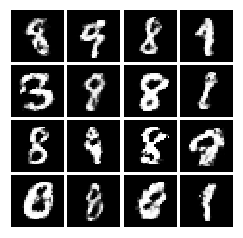

############################
Iter: 132000
D loss: 0.4637
G_loss: 2.594


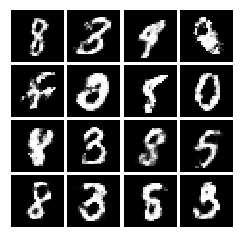

############################
Iter: 133000
D loss: 0.5186
G_loss: 2.611


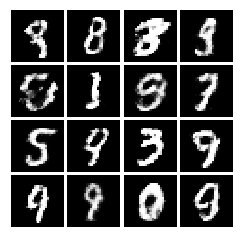

############################
Iter: 134000
D loss: 0.4916
G_loss: 2.536


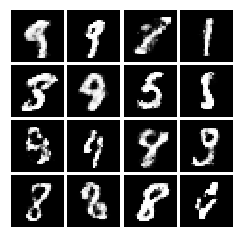

############################
Iter: 135000
D loss: 0.5062
G_loss: 2.545


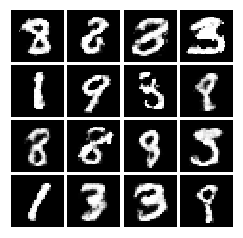

############################
Iter: 136000
D loss: 0.4696
G_loss: 2.466


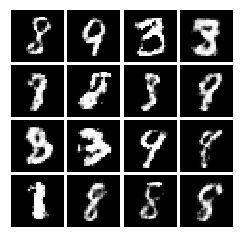

############################
Iter: 137000
D loss: 0.4521
G_loss: 2.826


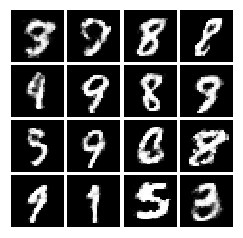

############################
Iter: 138000
D loss: 0.5084
G_loss: 2.509


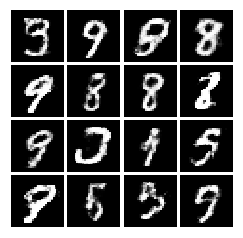

############################
Iter: 139000
D loss: 0.5569
G_loss: 2.401


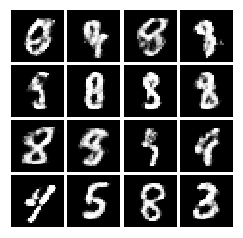

############################
Iter: 140000
D loss: 0.4102
G_loss: 2.724


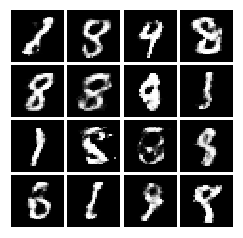

############################
Iter: 141000
D loss: 0.4762
G_loss: 2.813


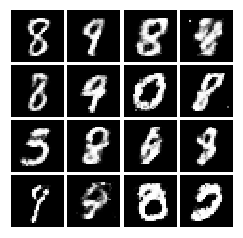

############################
Iter: 142000
D loss: 0.4113
G_loss: 2.536


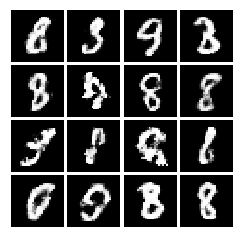

############################
Iter: 143000
D loss: 0.5955
G_loss: 2.882


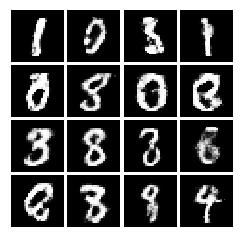

############################
Iter: 144000
D loss: 0.5013
G_loss: 2.851


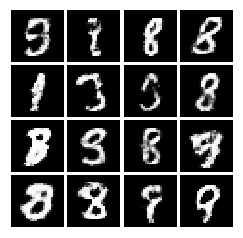

############################
Iter: 145000
D loss: 0.5899
G_loss: 2.886


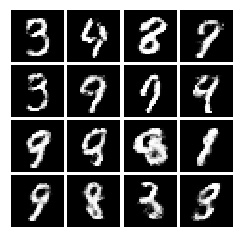

############################
Iter: 146000
D loss: 0.3901
G_loss: 2.82


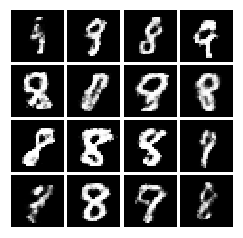

############################
Iter: 147000
D loss: 0.4601
G_loss: 2.646


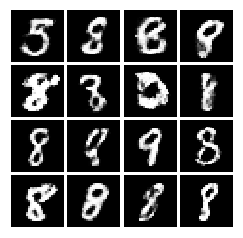

############################
Iter: 148000
D loss: 0.5073
G_loss: 2.851


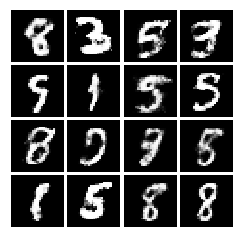

############################
Iter: 149000
D loss: 0.4825
G_loss: 3.136


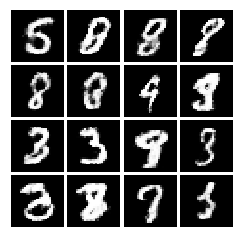

############################
Iter: 150000
D loss: 0.5519
G_loss: 2.873


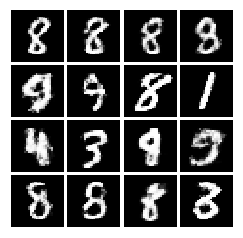

############################
Iter: 151000
D loss: 0.5353
G_loss: 2.807


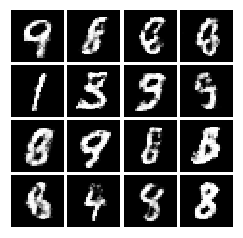

############################
Iter: 152000
D loss: 0.6427
G_loss: 2.768


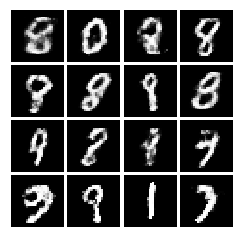

############################
Iter: 153000
D loss: 0.5231
G_loss: 2.687


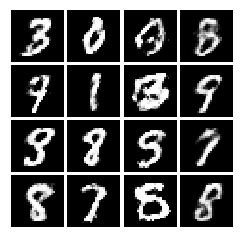

############################
Iter: 154000
D loss: 0.437
G_loss: 3.056


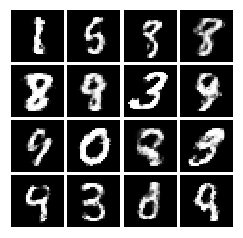

############################
Iter: 155000
D loss: 0.5669
G_loss: 2.721


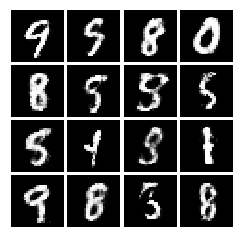

############################
Iter: 156000
D loss: 0.4788
G_loss: 2.66


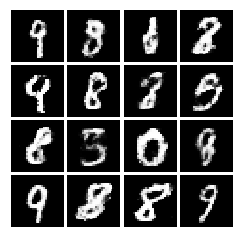

############################
Iter: 157000
D loss: 0.4446
G_loss: 2.873


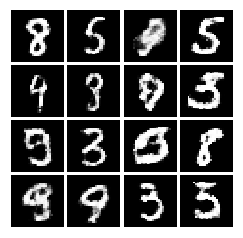

############################
Iter: 158000
D loss: 0.5218
G_loss: 2.591


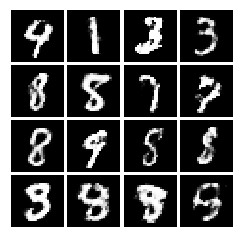

############################
Iter: 159000
D loss: 0.5975
G_loss: 3.333


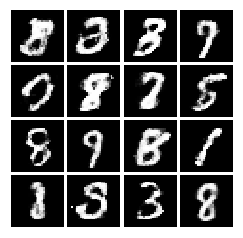

############################
Iter: 160000
D loss: 0.535
G_loss: 3.559


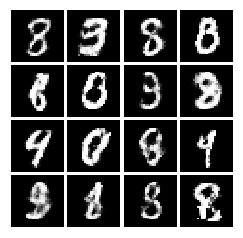

############################
Iter: 161000
D loss: 0.4785
G_loss: 2.761


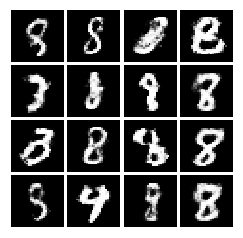

############################
Iter: 162000
D loss: 0.4766
G_loss: 3.193


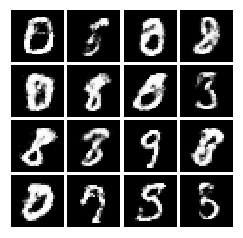

############################
Iter: 163000
D loss: 0.5085
G_loss: 3.354


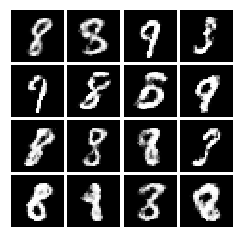

############################
Iter: 164000
D loss: 0.4307
G_loss: 3.034


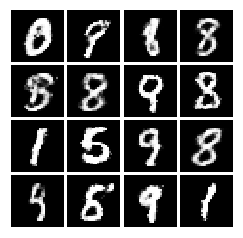

############################
Iter: 165000
D loss: 0.3899
G_loss: 3.25


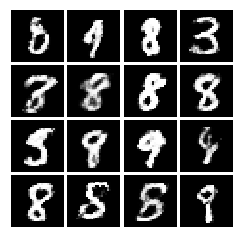

############################
Iter: 166000
D loss: 0.5501
G_loss: 2.823


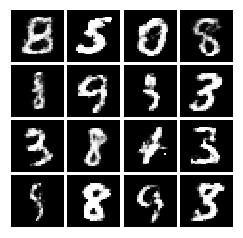

############################
Iter: 167000
D loss: 0.562
G_loss: 3.236


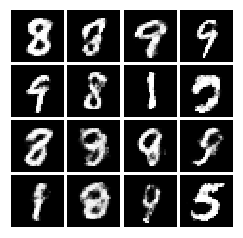

############################
Iter: 168000
D loss: 0.5394
G_loss: 2.835


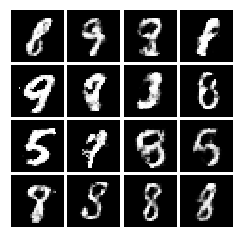

############################
Iter: 169000
D loss: 0.428
G_loss: 2.842


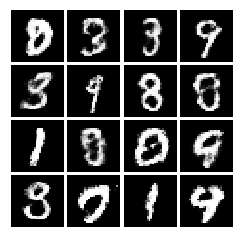

############################
Iter: 170000
D loss: 0.4453
G_loss: 3.155


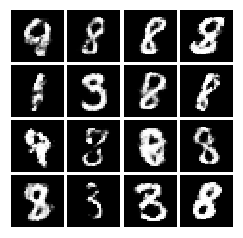

############################
Iter: 171000
D loss: 0.4723
G_loss: 2.669


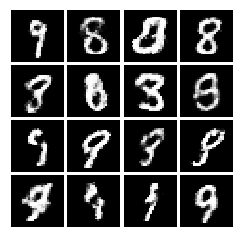

############################
Iter: 172000
D loss: 0.5101
G_loss: 3.149


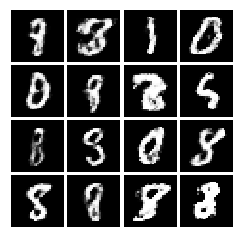

############################
Iter: 173000
D loss: 0.5445
G_loss: 2.946


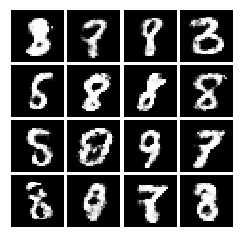

############################
Iter: 174000
D loss: 0.4238
G_loss: 2.769


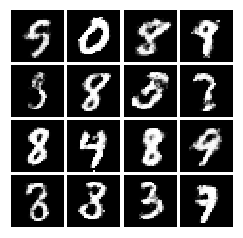

############################
Iter: 175000
D loss: 0.4525
G_loss: 2.906


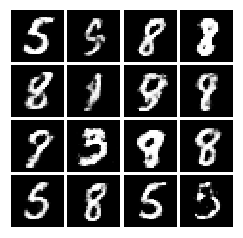

############################
Iter: 176000
D loss: 0.4459
G_loss: 3.12


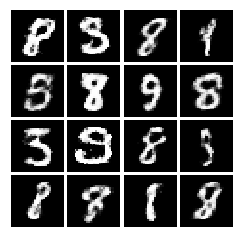

############################
Iter: 177000
D loss: 0.6525
G_loss: 3.021


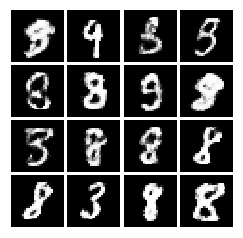

############################
Iter: 178000
D loss: 0.5137
G_loss: 2.791


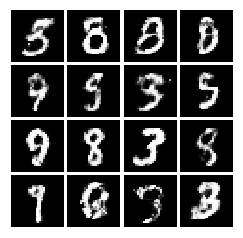

############################
Iter: 179000
D loss: 0.449
G_loss: 3.085


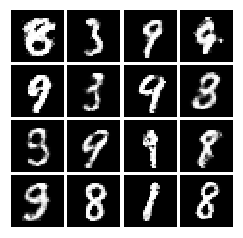

############################
Iter: 180000
D loss: 0.4337
G_loss: 3.046


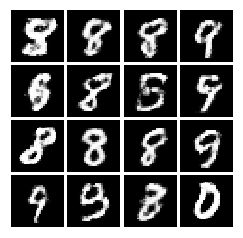

############################
Iter: 181000
D loss: 0.4442
G_loss: 3.311


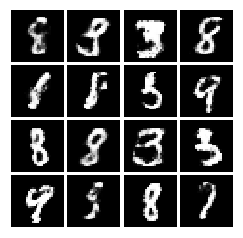

############################
Iter: 182000
D loss: 0.4677
G_loss: 3.082


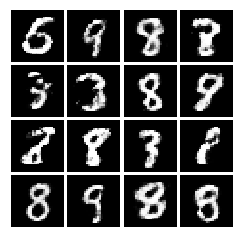

############################
Iter: 183000
D loss: 0.4258
G_loss: 3.103


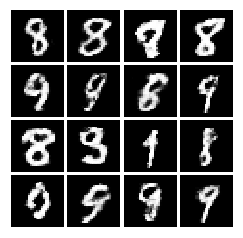

############################
Iter: 184000
D loss: 0.4796
G_loss: 3.208


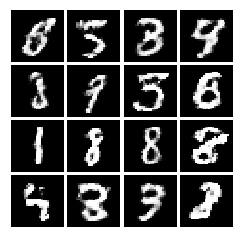

############################
Iter: 185000
D loss: 0.3325
G_loss: 3.096


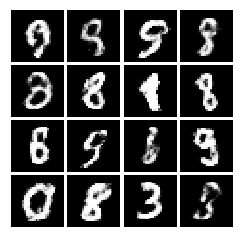

############################
Iter: 186000
D loss: 0.4754
G_loss: 3.657


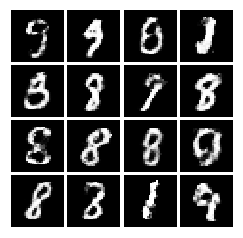

############################
Iter: 187000
D loss: 0.4717
G_loss: 3.235


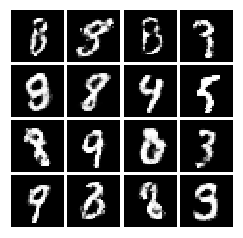

############################
Iter: 188000
D loss: 0.3827
G_loss: 3.043


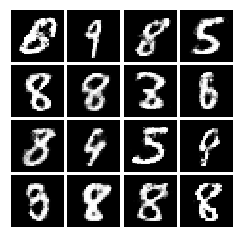

############################
Iter: 189000
D loss: 0.4606
G_loss: 2.909


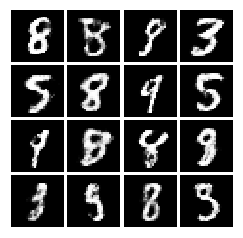

############################
Iter: 190000
D loss: 0.3833
G_loss: 3.139


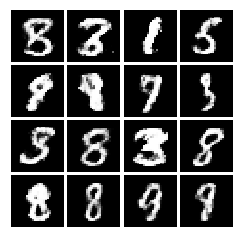

############################
Iter: 191000
D loss: 0.5103
G_loss: 3.03


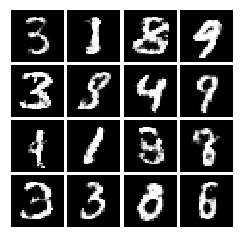

############################
Iter: 192000
D loss: 0.4731
G_loss: 3.164


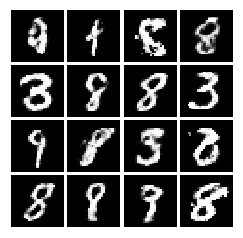

############################
Iter: 193000
D loss: 0.5376
G_loss: 3.35


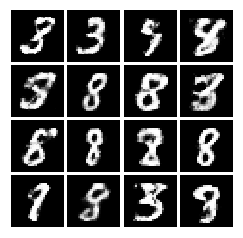

############################
Iter: 194000
D loss: 0.5127
G_loss: 3.136


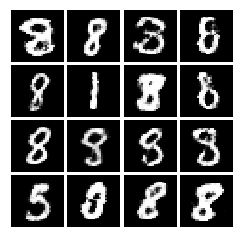

############################
Iter: 195000
D loss: 0.4532
G_loss: 3.109


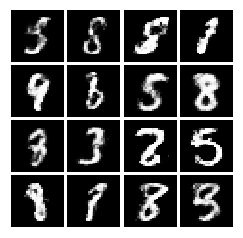

############################
Iter: 196000
D loss: 0.5597
G_loss: 2.503


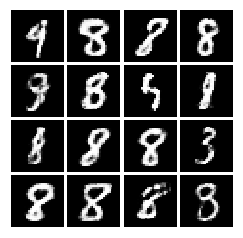

############################
Iter: 197000
D loss: 0.5652
G_loss: 3.473


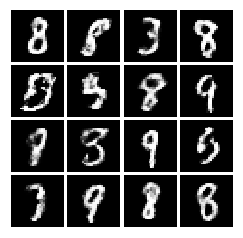

############################
Iter: 198000
D loss: 0.3535
G_loss: 2.824


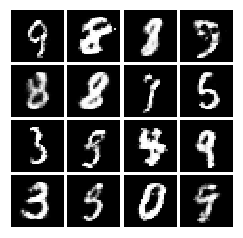

############################
Iter: 199000
D loss: 0.3953
G_loss: 2.884


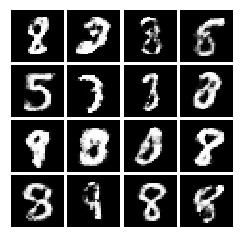

############################
Iter: 200000
D loss: 0.3811
G_loss: 3.787


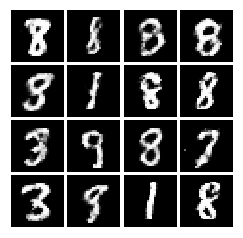

############################
Iter: 201000
D loss: 0.6144
G_loss: 3.344


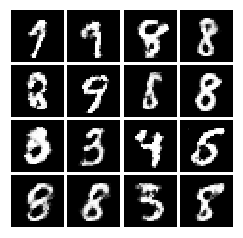

############################
Iter: 202000
D loss: 0.4965
G_loss: 3.18


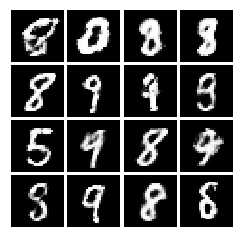

############################
Iter: 203000
D loss: 0.5252
G_loss: 2.801


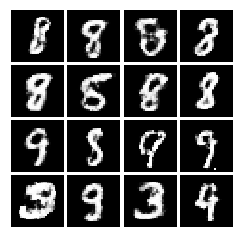

############################
Iter: 204000
D loss: 0.4338
G_loss: 2.904


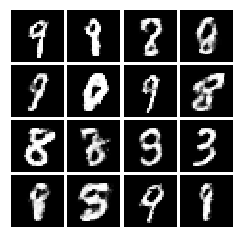

############################
Iter: 205000
D loss: 0.4034
G_loss: 3.447


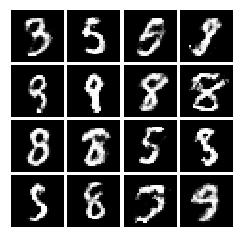

############################
Iter: 206000
D loss: 0.3629
G_loss: 3.667


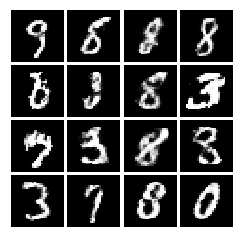

############################
Iter: 207000
D loss: 0.4246
G_loss: 2.73


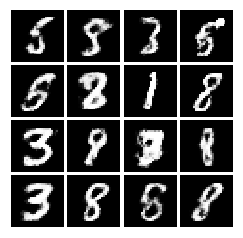

############################
Iter: 208000
D loss: 0.3879
G_loss: 3.329


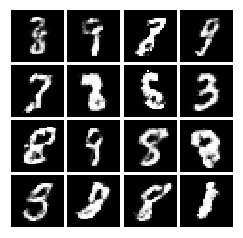

############################
Iter: 209000
D loss: 0.5768
G_loss: 3.472


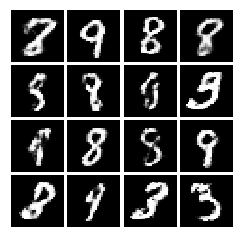

############################
Iter: 210000
D loss: 0.2726
G_loss: 2.986


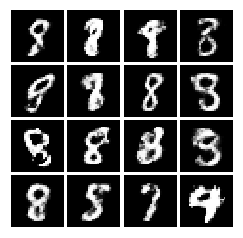

############################
Iter: 211000
D loss: 0.3757
G_loss: 2.89


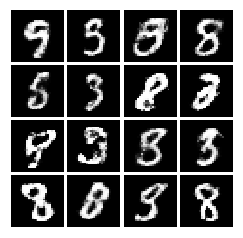

############################
Iter: 212000
D loss: 0.5172
G_loss: 2.991


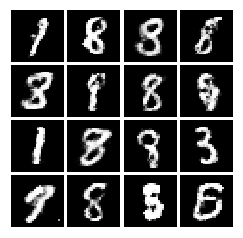

############################
Iter: 213000
D loss: 0.4447
G_loss: 3.446


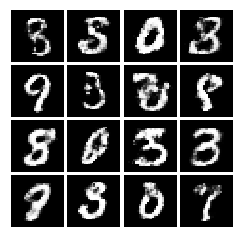

############################
Iter: 214000
D loss: 0.4657
G_loss: 2.99


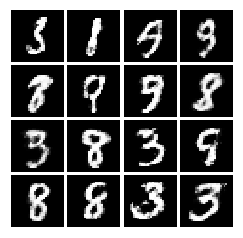

############################
Iter: 215000
D loss: 0.394
G_loss: 2.981


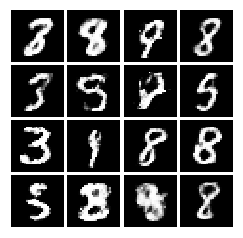

############################
Iter: 216000
D loss: 0.5246
G_loss: 2.985


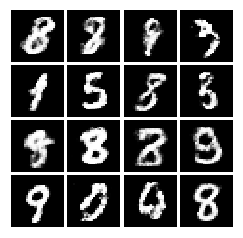

############################
Iter: 217000
D loss: 0.5134
G_loss: 3.265


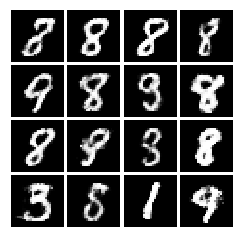

############################
Iter: 218000
D loss: 0.3609
G_loss: 3.298


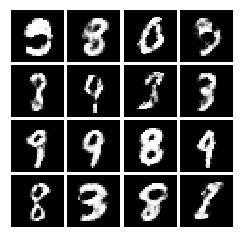

############################
Iter: 219000
D loss: 0.4872
G_loss: 2.909


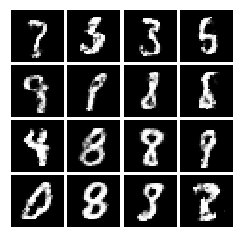

############################
Iter: 220000
D loss: 0.4868
G_loss: 3.035


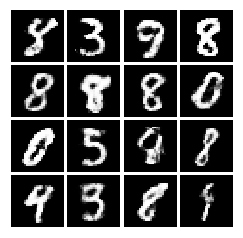

############################
Iter: 221000
D loss: 0.5067
G_loss: 2.992


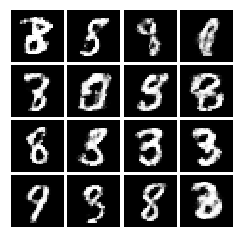

############################
Iter: 222000
D loss: 0.4423
G_loss: 3.319


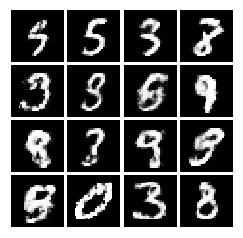

############################
Iter: 223000
D loss: 0.4553
G_loss: 3.336


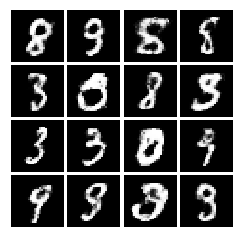

############################
Iter: 224000
D loss: 0.5215
G_loss: 3.064


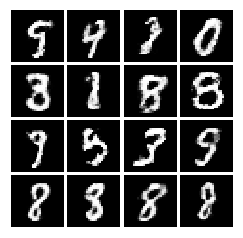

############################
Iter: 225000
D loss: 0.4405
G_loss: 3.251


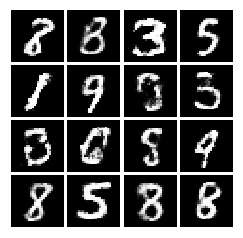

############################
Iter: 226000
D loss: 0.4259
G_loss: 3.474


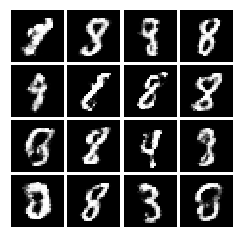

############################
Iter: 227000
D loss: 0.4254
G_loss: 3.131


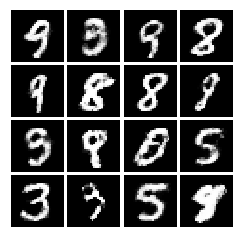

############################
Iter: 228000
D loss: 0.4184
G_loss: 3.076


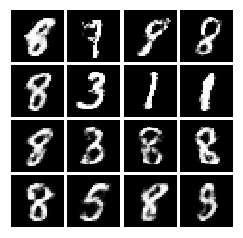

############################
Iter: 229000
D loss: 0.502
G_loss: 3.236


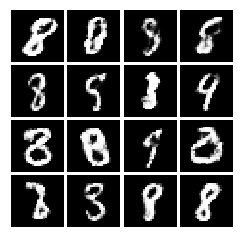

############################
Iter: 230000
D loss: 0.4973
G_loss: 3.281


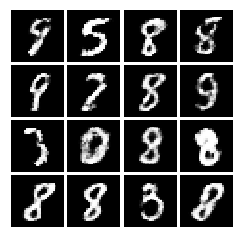

############################
Iter: 231000
D loss: 0.4947
G_loss: 3.016


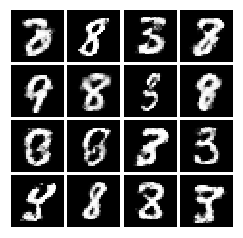

############################
Iter: 232000
D loss: 0.3914
G_loss: 3.452


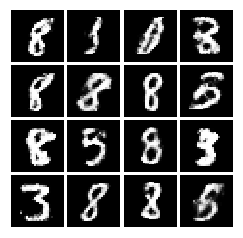

############################
Iter: 233000
D loss: 0.4338
G_loss: 2.764


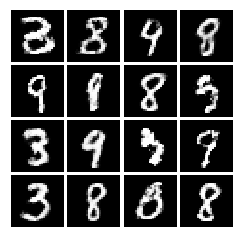

############################
Iter: 234000
D loss: 0.4772
G_loss: 3.112


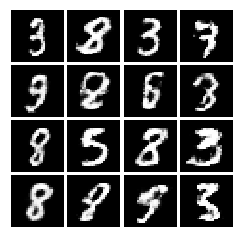

############################
Iter: 235000
D loss: 0.3778
G_loss: 3.56


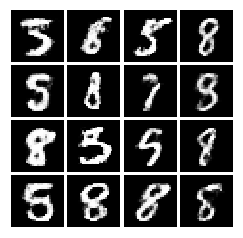

############################
Iter: 236000
D loss: 0.4301
G_loss: 3.234


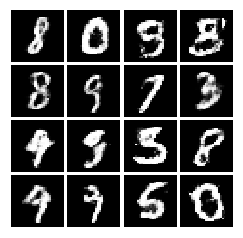

############################
Iter: 237000
D loss: 0.4795
G_loss: 3.329


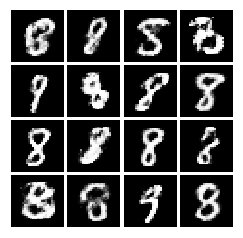

############################
Iter: 238000
D loss: 0.4936
G_loss: 3.693


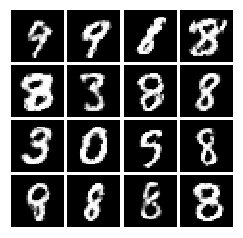

############################
Iter: 239000
D loss: 0.3916
G_loss: 3.373


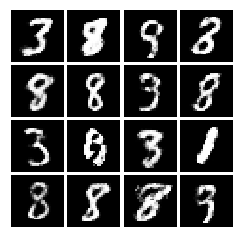

############################
Iter: 240000
D loss: 0.58
G_loss: 3.497


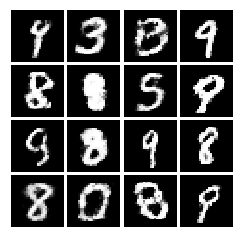

############################
Iter: 241000
D loss: 0.5281
G_loss: 3.621


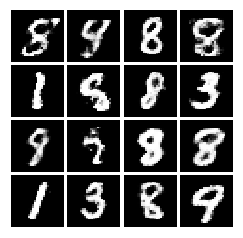

############################
Iter: 242000
D loss: 0.3633
G_loss: 2.91


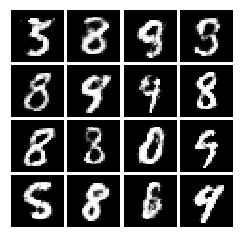

############################
Iter: 243000
D loss: 0.4855
G_loss: 3.397


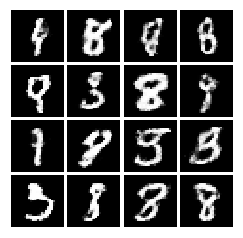

############################
Iter: 244000
D loss: 0.4112
G_loss: 3.366


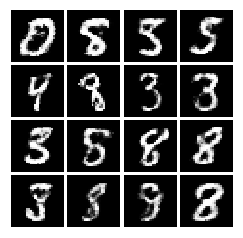

############################
Iter: 245000
D loss: 0.3955
G_loss: 3.458


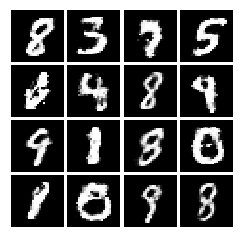

############################
Iter: 246000
D loss: 0.4231
G_loss: 2.962


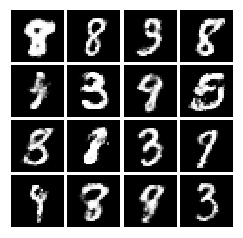

############################
Iter: 247000
D loss: 0.4419
G_loss: 3.672


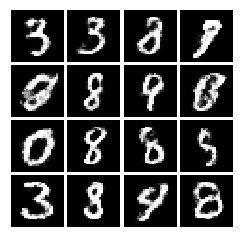

############################
Iter: 248000
D loss: 0.3423
G_loss: 2.672


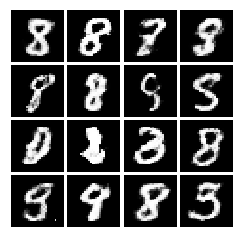

############################
Iter: 249000
D loss: 0.4109
G_loss: 3.285


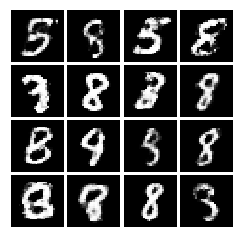

############################
Iter: 250000
D loss: 0.3982
G_loss: 3.175


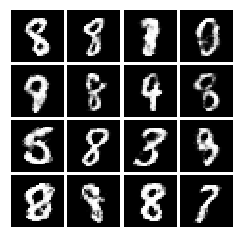

############################
Iter: 251000
D loss: 0.4632
G_loss: 3.468


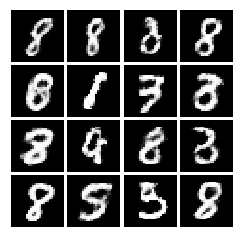

############################
Iter: 252000
D loss: 0.3187
G_loss: 3.142


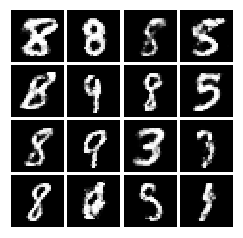

############################
Iter: 253000
D loss: 0.5193
G_loss: 3.133


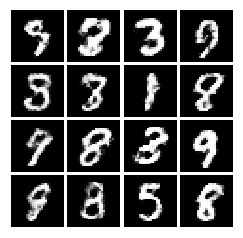

############################
Iter: 254000
D loss: 0.3292
G_loss: 3.291


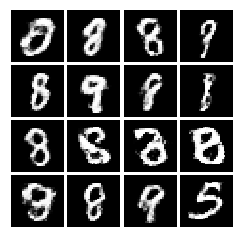

############################
Iter: 255000
D loss: 0.4164
G_loss: 3.283


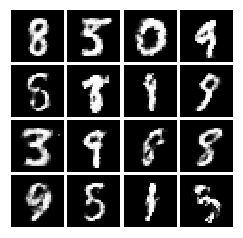

############################
Iter: 256000
D loss: 0.3371
G_loss: 3.133


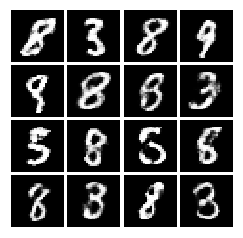

############################
Iter: 257000
D loss: 0.4759
G_loss: 3.626


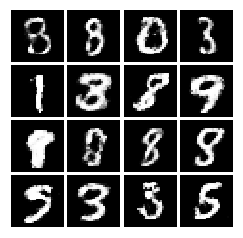

############################
Iter: 258000
D loss: 0.5021
G_loss: 3.417


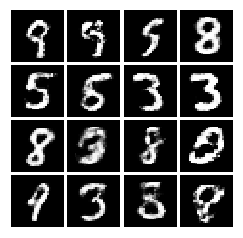

############################
Iter: 259000
D loss: 0.3588
G_loss: 3.906


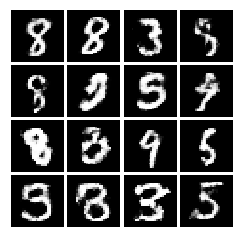

############################
Iter: 260000
D loss: 0.459
G_loss: 3.723


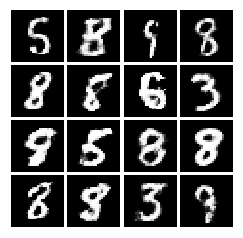

############################
Iter: 261000
D loss: 0.3768
G_loss: 3.29


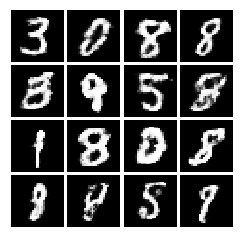

############################
Iter: 262000
D loss: 0.3518
G_loss: 2.871


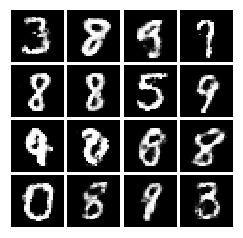

############################
Iter: 263000
D loss: 0.3953
G_loss: 3.118


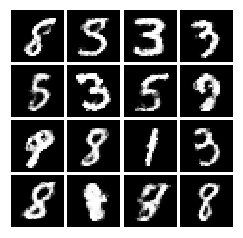

############################
Iter: 264000
D loss: 0.327
G_loss: 3.353


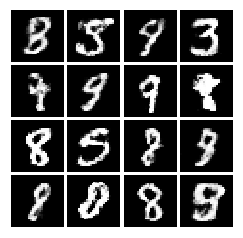

############################
Iter: 265000
D loss: 0.318
G_loss: 2.853


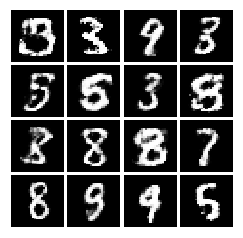

############################
Iter: 266000
D loss: 0.3769
G_loss: 3.077


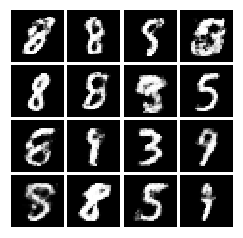

############################
Iter: 267000
D loss: 0.3194
G_loss: 3.438


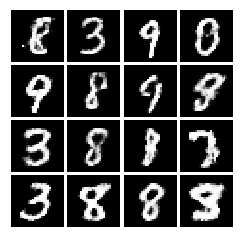

############################
Iter: 268000
D loss: 0.4189
G_loss: 3.427


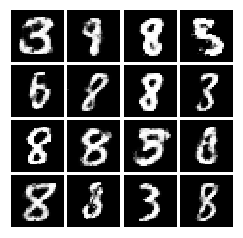

############################
Iter: 269000
D loss: 0.3551
G_loss: 3.404


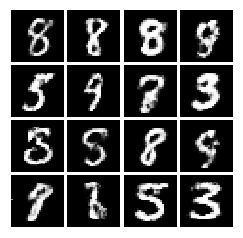

############################
Iter: 270000
D loss: 0.3417
G_loss: 2.866


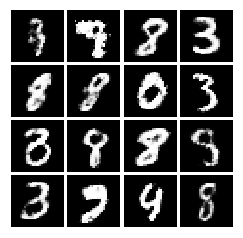

############################
Iter: 271000
D loss: 0.4325
G_loss: 3.702


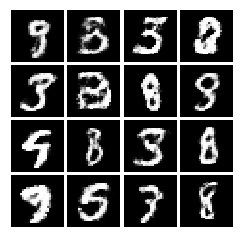

############################
Iter: 272000
D loss: 0.3989
G_loss: 3.4


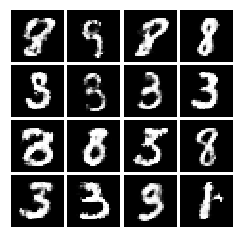

############################
Iter: 273000
D loss: 0.417
G_loss: 3.686


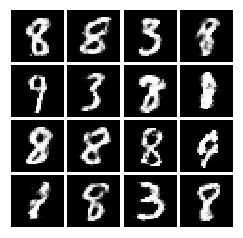

############################
Iter: 274000
D loss: 0.3165
G_loss: 3.555


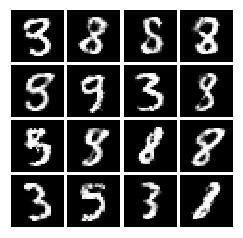

############################
Iter: 275000
D loss: 0.3991
G_loss: 2.912


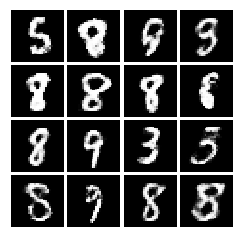

############################
Iter: 276000
D loss: 0.3726
G_loss: 3.275


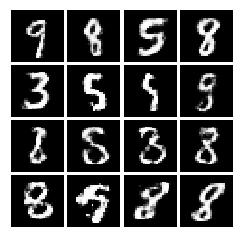

############################
Iter: 277000
D loss: 0.4271
G_loss: 3.097


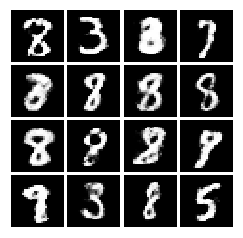

############################
Iter: 278000
D loss: 0.3858
G_loss: 2.927


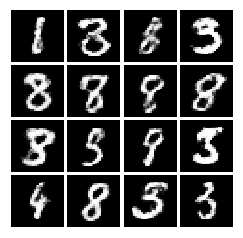

############################
Iter: 279000
D loss: 0.4439
G_loss: 3.641


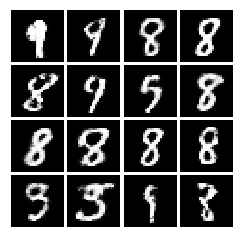

############################
Iter: 280000
D loss: 0.4928
G_loss: 3.432


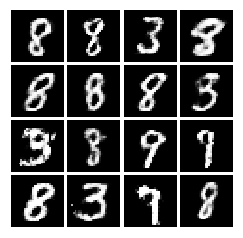

############################
Iter: 281000
D loss: 0.5513
G_loss: 3.184


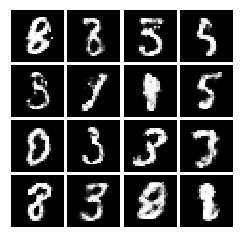

############################
Iter: 282000
D loss: 0.3162
G_loss: 3.441


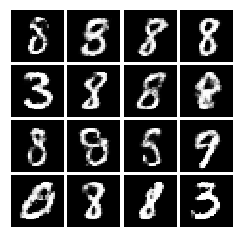

############################
Iter: 283000
D loss: 0.355
G_loss: 3.287


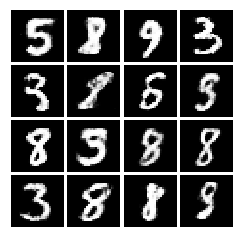

############################
Iter: 284000
D loss: 0.5129
G_loss: 3.419


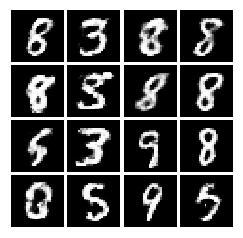

############################
Iter: 285000
D loss: 0.3877
G_loss: 3.385


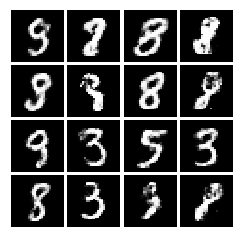

############################
Iter: 286000
D loss: 0.3822
G_loss: 3.601


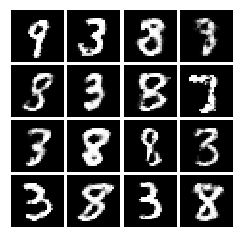

############################
Iter: 287000
D loss: 0.4396
G_loss: 3.138


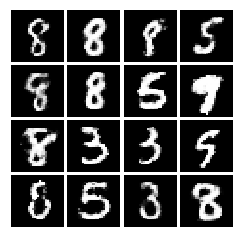

############################
Iter: 288000
D loss: 0.3757
G_loss: 3.169


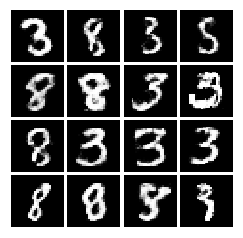

############################
Iter: 289000
D loss: 0.3484
G_loss: 3.26


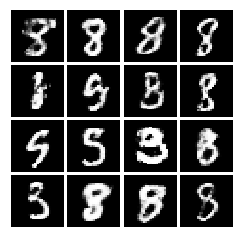

############################
Iter: 290000
D loss: 0.3879
G_loss: 3.642


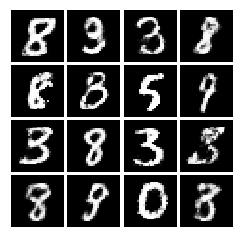

############################
Iter: 291000
D loss: 0.4389
G_loss: 3.501


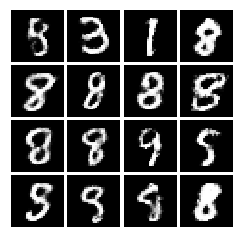

############################
Iter: 292000
D loss: 0.4037
G_loss: 3.03


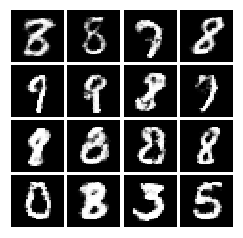

############################
Iter: 293000
D loss: 0.3221
G_loss: 3.257


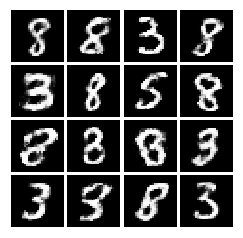

############################
Iter: 294000
D loss: 0.3539
G_loss: 3.267


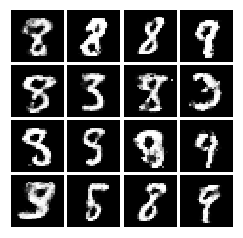

############################
Iter: 295000
D loss: 0.4388
G_loss: 3.962


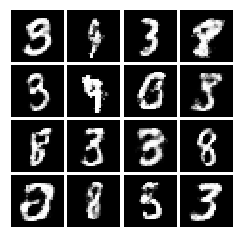

############################
Iter: 296000
D loss: 0.3557
G_loss: 3.664


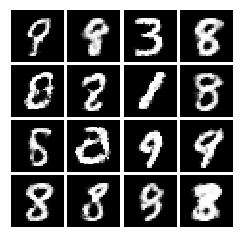

############################
Iter: 297000
D loss: 0.3066
G_loss: 2.807


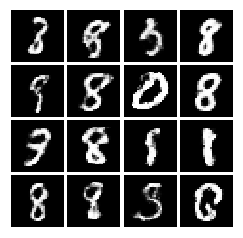

############################
Iter: 298000
D loss: 0.4016
G_loss: 3.619


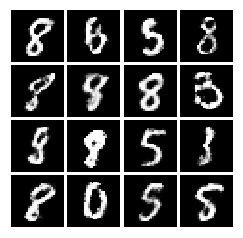

############################
Iter: 299000
D loss: 0.5667
G_loss: 3.18


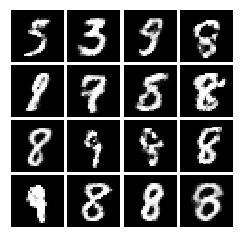

############################
Iter: 300000
D loss: 0.3778
G_loss: 3.209


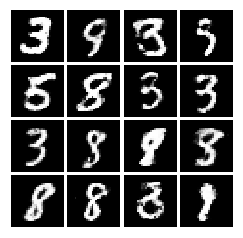

############################
Iter: 301000
D loss: 0.4099
G_loss: 3.425


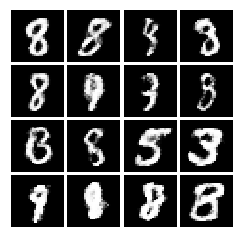

############################
Iter: 302000
D loss: 0.4078
G_loss: 3.419


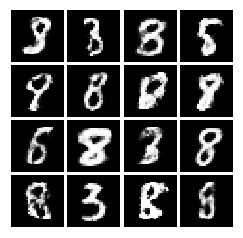

############################
Iter: 303000
D loss: 0.4639
G_loss: 3.482


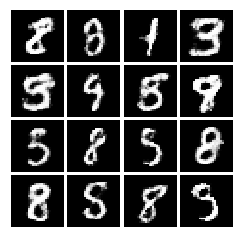

############################
Iter: 304000
D loss: 0.4329
G_loss: 3.155


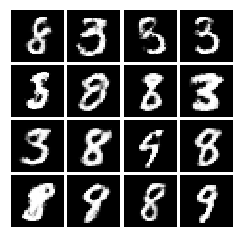

############################
Iter: 305000
D loss: 0.3748
G_loss: 3.515


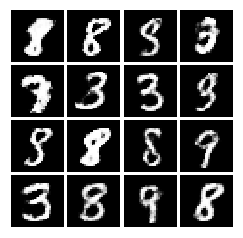

############################
Iter: 306000
D loss: 0.3112
G_loss: 3.479


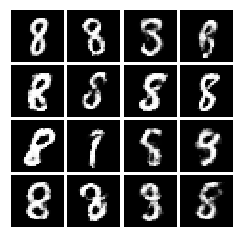

############################
Iter: 307000
D loss: 0.3997
G_loss: 3.353


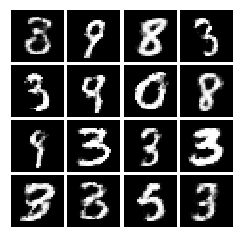

############################
Iter: 308000
D loss: 0.3714
G_loss: 3.646


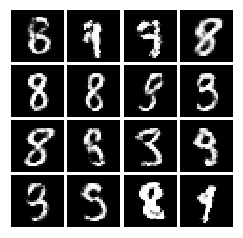

############################
Iter: 309000
D loss: 0.3803
G_loss: 3.314


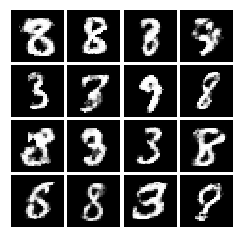

############################
Iter: 310000
D loss: 0.5133
G_loss: 3.637


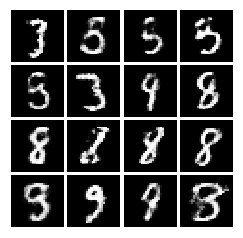

############################
Iter: 311000
D loss: 0.382
G_loss: 2.844


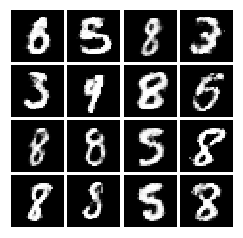

############################
Iter: 312000
D loss: 0.3758
G_loss: 3.026


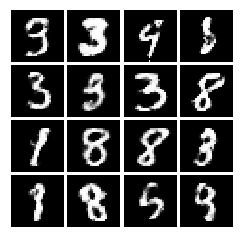

############################
Iter: 313000
D loss: 0.451
G_loss: 3.569


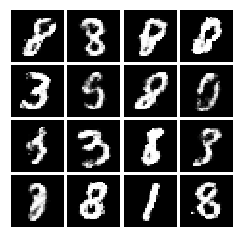

############################
Iter: 314000
D loss: 0.4406
G_loss: 3.198


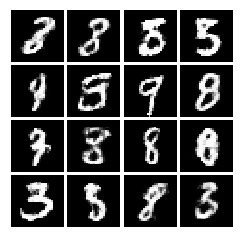

############################
Iter: 315000
D loss: 0.3935
G_loss: 3.332


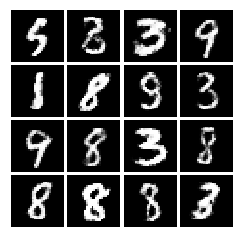

############################
Iter: 316000
D loss: 0.3736
G_loss: 3.389


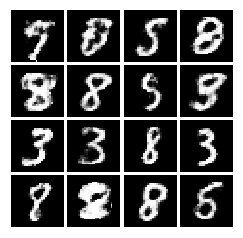

############################
Iter: 317000
D loss: 0.3881
G_loss: 3.265


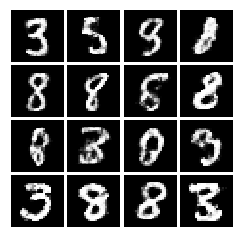

############################
Iter: 318000
D loss: 0.34
G_loss: 3.215


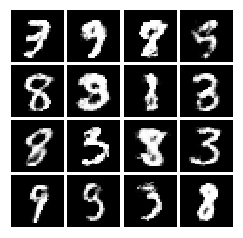

############################
Iter: 319000
D loss: 0.3865
G_loss: 3.346


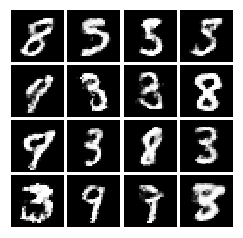

############################
Iter: 320000
D loss: 0.5443
G_loss: 3.071


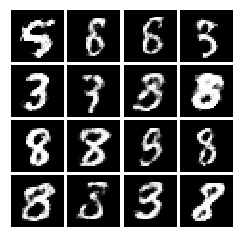

############################
Iter: 321000
D loss: 0.5468
G_loss: 3.46


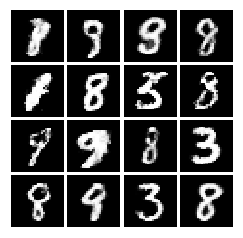

############################
Iter: 322000
D loss: 0.4456
G_loss: 3.027


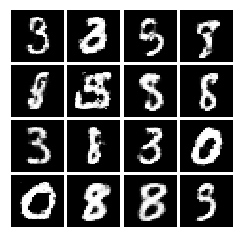

############################
Iter: 323000
D loss: 0.3674
G_loss: 2.951


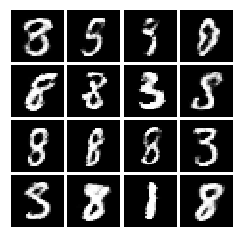

############################
Iter: 324000
D loss: 0.5358
G_loss: 3.387


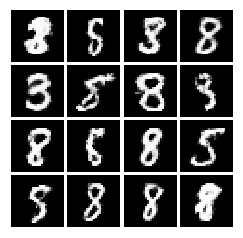

############################
Iter: 325000
D loss: 0.4531
G_loss: 3.558


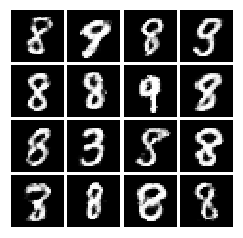

############################
Iter: 326000
D loss: 0.4532
G_loss: 3.099


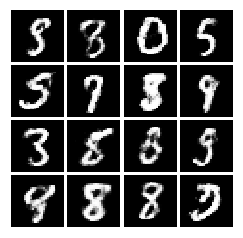

############################
Iter: 327000
D loss: 0.3095
G_loss: 3.21


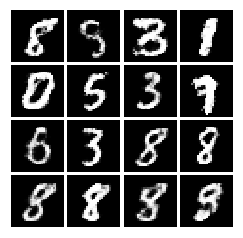

############################
Iter: 328000
D loss: 0.4539
G_loss: 3.368


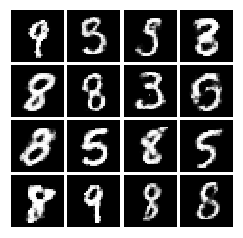

############################
Iter: 329000
D loss: 0.4625
G_loss: 2.794


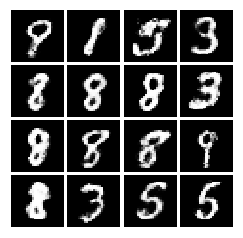

############################
Iter: 330000
D loss: 0.4709
G_loss: 3.25


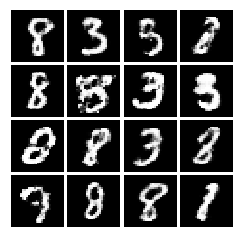

############################
Iter: 331000
D loss: 0.2958
G_loss: 3.379


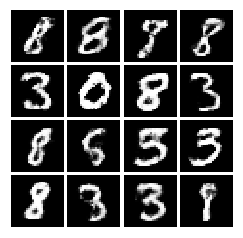

############################
Iter: 332000
D loss: 0.4134
G_loss: 3.753


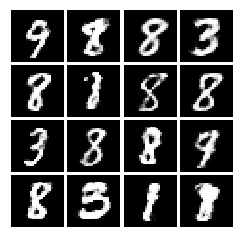

############################
Iter: 333000
D loss: 0.379
G_loss: 3.348


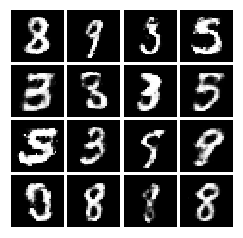

############################
Iter: 334000
D loss: 0.4329
G_loss: 3.447


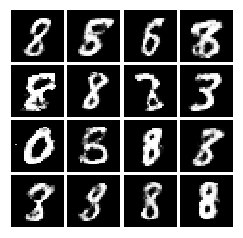

############################
Iter: 335000
D loss: 0.3615
G_loss: 3.673


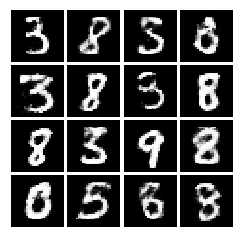

############################
Iter: 336000
D loss: 0.3682
G_loss: 3.327


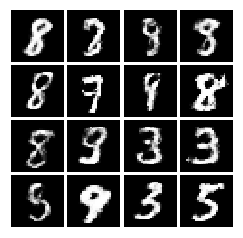

############################
Iter: 337000
D loss: 0.3065
G_loss: 3.016


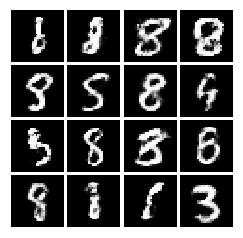

############################
Iter: 338000
D loss: 0.4267
G_loss: 3.796


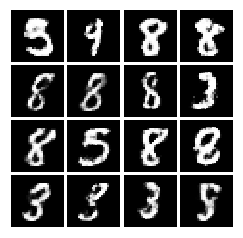

############################
Iter: 339000
D loss: 0.4025
G_loss: 3.279


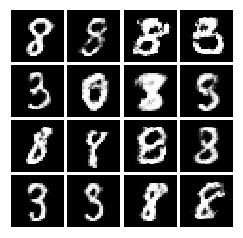

############################
Iter: 340000
D loss: 0.4094
G_loss: 3.633


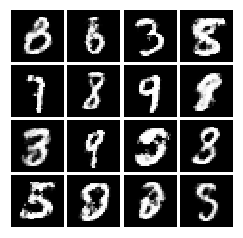

############################
Iter: 341000
D loss: 0.3973
G_loss: 2.957


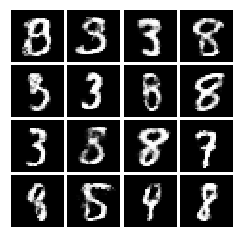

############################
Iter: 342000
D loss: 0.5163
G_loss: 3.236


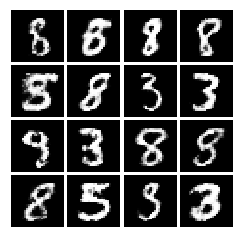

############################
Iter: 343000
D loss: 0.2432
G_loss: 3.528


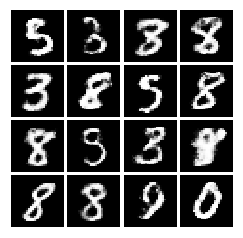

############################
Iter: 344000
D loss: 0.322
G_loss: 3.266


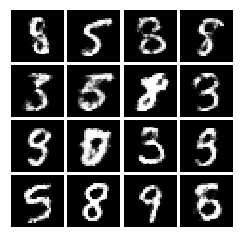

############################
Iter: 345000
D loss: 0.3218
G_loss: 3.155


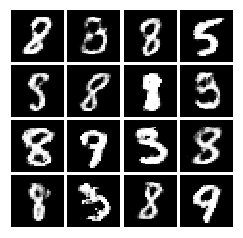

############################
Iter: 346000
D loss: 0.3471
G_loss: 2.894


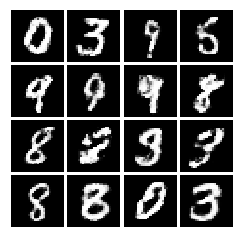

############################
Iter: 347000
D loss: 0.3699
G_loss: 3.377


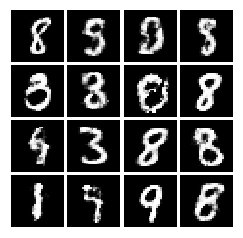

############################
Iter: 348000
D loss: 0.359
G_loss: 3.5


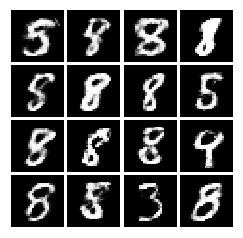

############################
Iter: 349000
D loss: 0.32
G_loss: 3.248


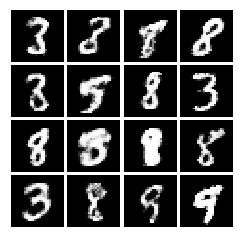

############################
Iter: 350000
D loss: 0.3817
G_loss: 3.642


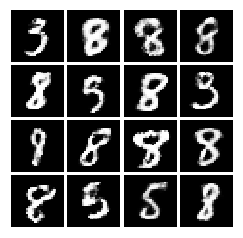

############################
Iter: 351000
D loss: 0.2698
G_loss: 2.945


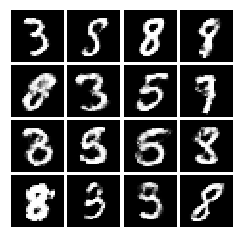

############################
Iter: 352000
D loss: 0.3768
G_loss: 3.867


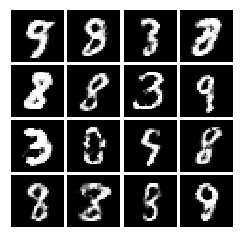

############################
Iter: 353000
D loss: 0.3999
G_loss: 3.261


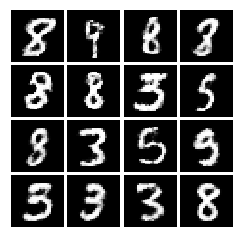

############################
Iter: 354000
D loss: 0.377
G_loss: 3.289


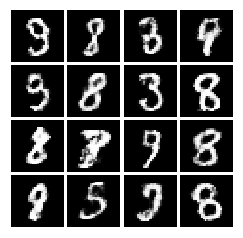

############################
Iter: 355000
D loss: 0.4018
G_loss: 3.527


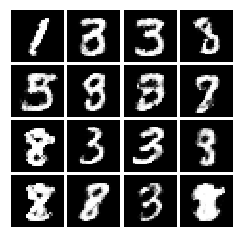

############################
Iter: 356000
D loss: 0.4131
G_loss: 3.683


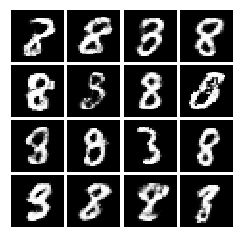

############################
Iter: 357000
D loss: 0.3791
G_loss: 3.451


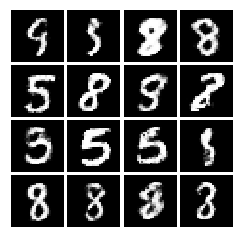

############################
Iter: 358000
D loss: 0.3762
G_loss: 3.302


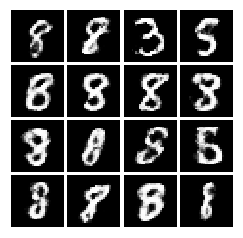

############################
Iter: 359000
D loss: 0.4155
G_loss: 3.649


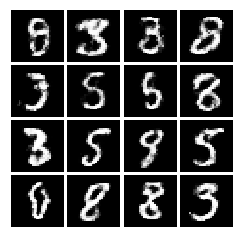

############################
Iter: 360000
D loss: 0.3856
G_loss: 3.557


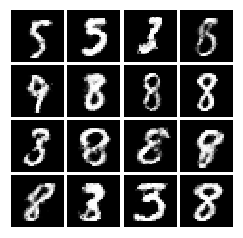

############################
Iter: 361000
D loss: 0.392
G_loss: 3.387


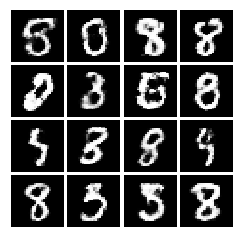

############################
Iter: 362000
D loss: 0.3474
G_loss: 3.36


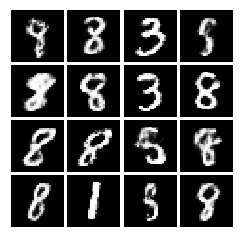

############################
Iter: 363000
D loss: 0.5056
G_loss: 3.528


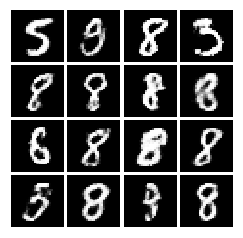

############################
Iter: 364000
D loss: 0.4004
G_loss: 3.153


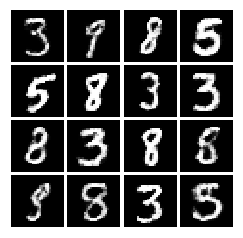

############################
Iter: 365000
D loss: 0.4368
G_loss: 3.16


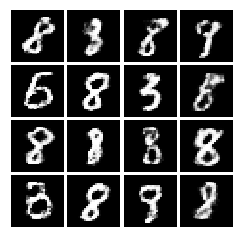

############################
Iter: 366000
D loss: 0.4285
G_loss: 4.465


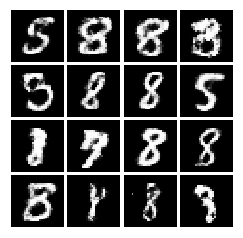

############################
Iter: 367000
D loss: 0.4177
G_loss: 3.729


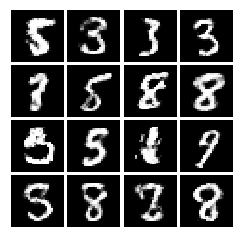

############################
Iter: 368000
D loss: 0.3488
G_loss: 3.555


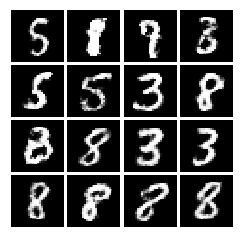

############################
Iter: 369000
D loss: 0.457
G_loss: 3.625


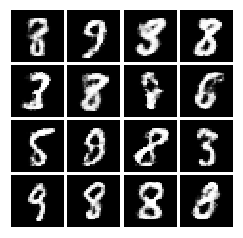

############################
Iter: 370000
D loss: 0.3173
G_loss: 4.024


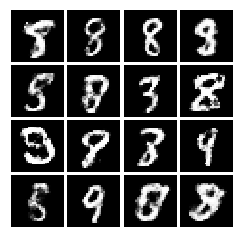

############################
Iter: 371000
D loss: 0.3171
G_loss: 3.019


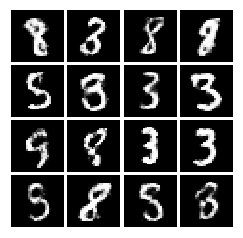

############################
Iter: 372000
D loss: 0.3885
G_loss: 3.427


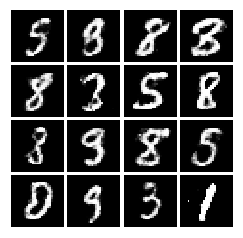

############################
Iter: 373000
D loss: 0.3689
G_loss: 3.615


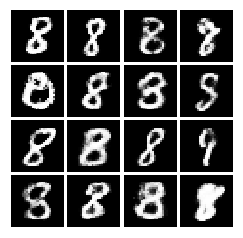

############################
Iter: 374000
D loss: 0.3183
G_loss: 4.052


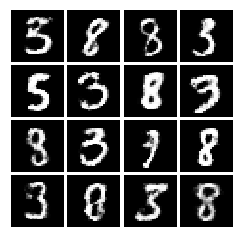

############################
Iter: 375000
D loss: 0.3594
G_loss: 3.679


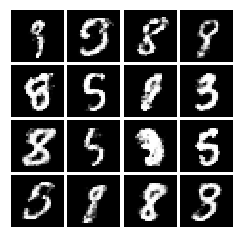

############################
Iter: 376000
D loss: 0.3894
G_loss: 3.229


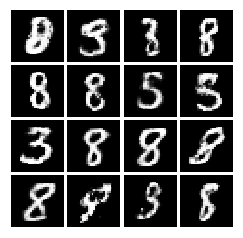

############################
Iter: 377000
D loss: 0.3327
G_loss: 3.76


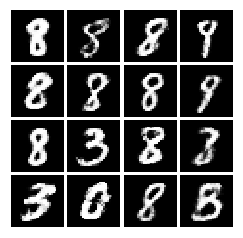

############################
Iter: 378000
D loss: 0.4052
G_loss: 3.738


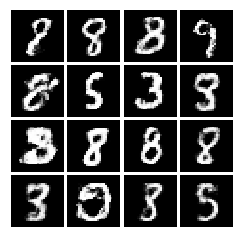

############################
Iter: 379000
D loss: 0.3579
G_loss: 3.288


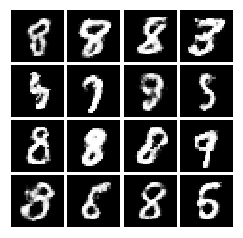

############################
Iter: 380000
D loss: 0.4409
G_loss: 3.243


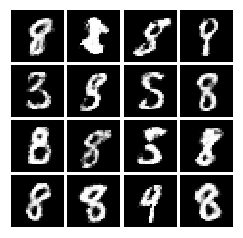

############################
Iter: 381000
D loss: 0.3762
G_loss: 3.759


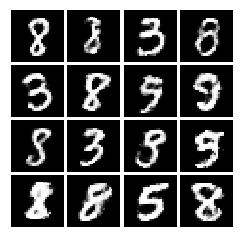

############################
Iter: 382000
D loss: 0.4006
G_loss: 3.82


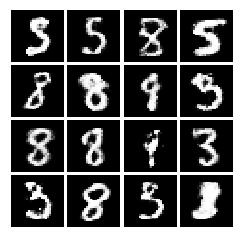

############################
Iter: 383000
D loss: 0.2631
G_loss: 3.413


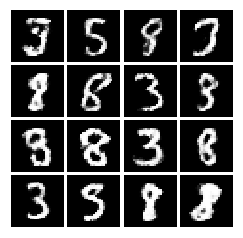

############################
Iter: 384000
D loss: 0.3752
G_loss: 3.352


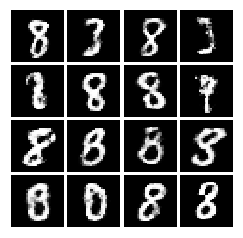

############################
Iter: 385000
D loss: 0.332
G_loss: 3.378


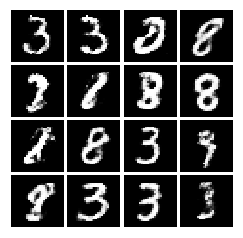

############################
Iter: 386000
D loss: 0.3648
G_loss: 3.692


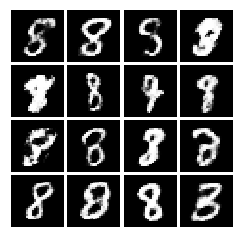

############################
Iter: 387000
D loss: 0.3214
G_loss: 3.441


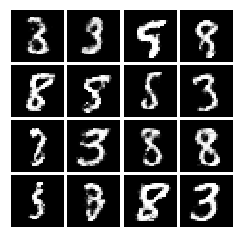

############################
Iter: 388000
D loss: 0.3832
G_loss: 3.334


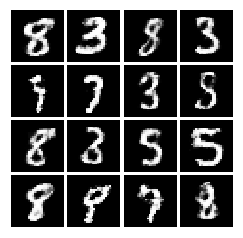

############################
Iter: 389000
D loss: 0.3138
G_loss: 3.557


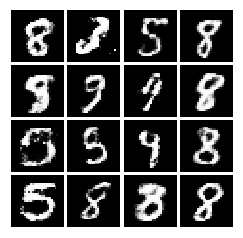

############################
Iter: 390000
D loss: 0.4123
G_loss: 3.614


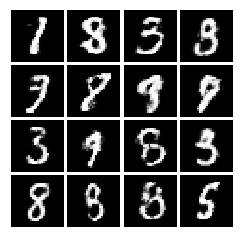

############################
Iter: 391000
D loss: 0.3351
G_loss: 3.163


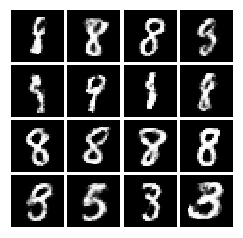

############################
Iter: 392000
D loss: 0.3512
G_loss: 3.675


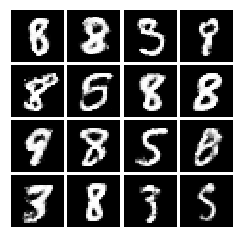

############################
Iter: 393000
D loss: 0.3125
G_loss: 3.318


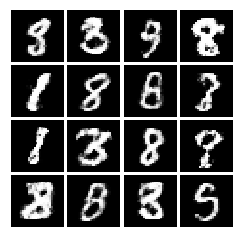

############################
Iter: 394000
D loss: 0.3657
G_loss: 3.383


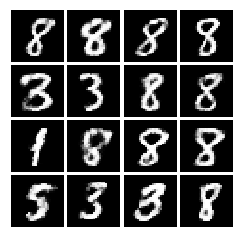

############################
Iter: 395000
D loss: 0.414
G_loss: 3.585


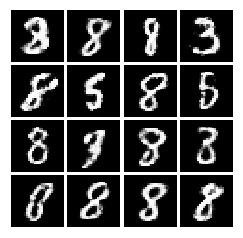

############################
Iter: 396000
D loss: 0.3491
G_loss: 3.433


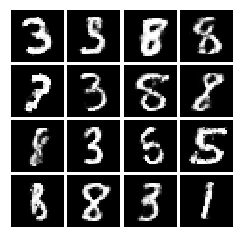

############################
Iter: 397000
D loss: 0.3121
G_loss: 3.587


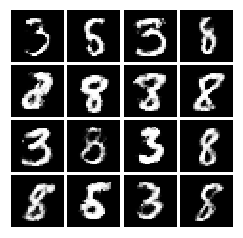

############################
Iter: 398000
D loss: 0.3381
G_loss: 3.073


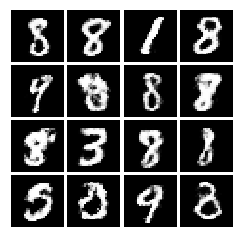

############################
Iter: 399000
D loss: 0.3721
G_loss: 3.615


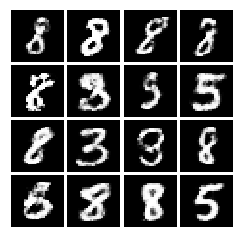

############################
Iter: 400000
D loss: 0.2796
G_loss: 3.046


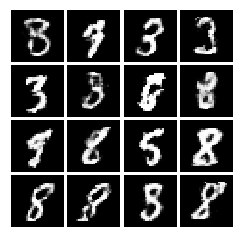

############################
Iter: 401000
D loss: 0.3385
G_loss: 3.598


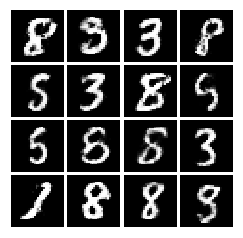

############################
Iter: 402000
D loss: 0.3996
G_loss: 4.126


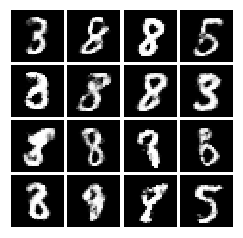

############################
Iter: 403000
D loss: 0.3608
G_loss: 3.406


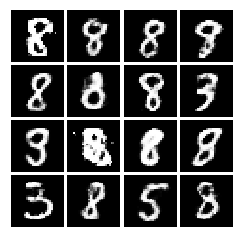

############################
Iter: 404000
D loss: 0.3689
G_loss: 3.664


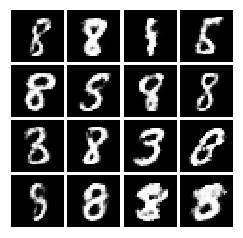

############################
Iter: 405000
D loss: 0.4815
G_loss: 4.037


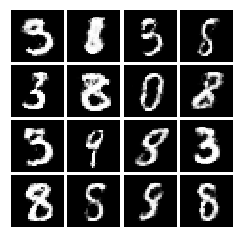

############################
Iter: 406000
D loss: 0.2984
G_loss: 3.416


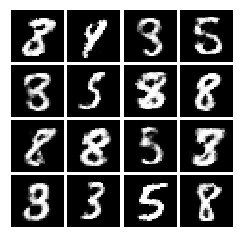

############################
Iter: 407000
D loss: 0.3694
G_loss: 3.058


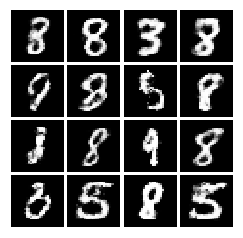

############################
Iter: 408000
D loss: 0.3592
G_loss: 3.85


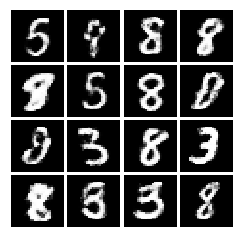

############################
Iter: 409000
D loss: 0.3874
G_loss: 3.394


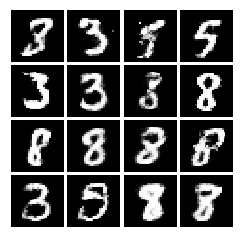

############################
Iter: 410000
D loss: 0.4068
G_loss: 3.201


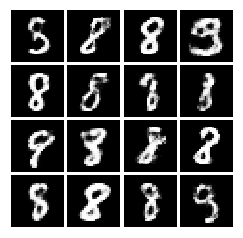

############################
Iter: 411000
D loss: 0.4904
G_loss: 3.511


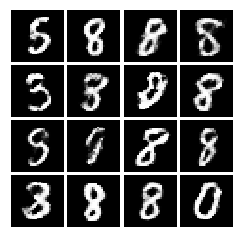

############################
Iter: 412000
D loss: 0.2548
G_loss: 3.731


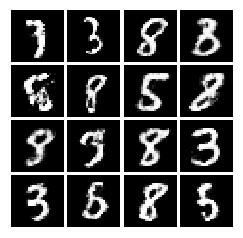

############################
Iter: 413000
D loss: 0.3111
G_loss: 3.376


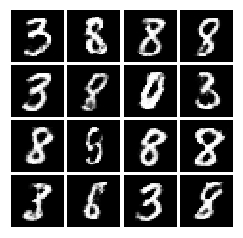

############################
Iter: 414000
D loss: 0.4756
G_loss: 3.703


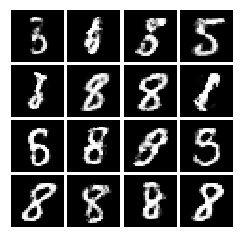

############################
Iter: 415000
D loss: 0.4392
G_loss: 3.308


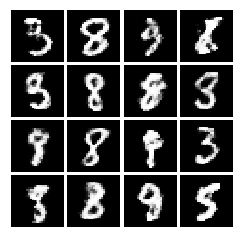

############################
Iter: 416000
D loss: 0.2925
G_loss: 3.208


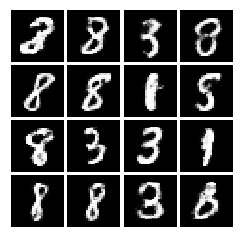

############################
Iter: 417000
D loss: 0.3679
G_loss: 3.196


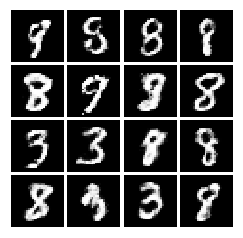

############################
Iter: 418000
D loss: 0.3604
G_loss: 3.567


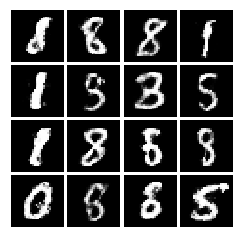

############################
Iter: 419000
D loss: 0.5135
G_loss: 3.635


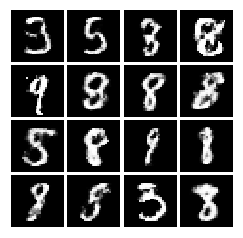

############################
Iter: 420000
D loss: 0.2971
G_loss: 3.433


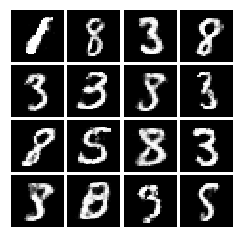

############################
Iter: 421000
D loss: 0.3132
G_loss: 3.476


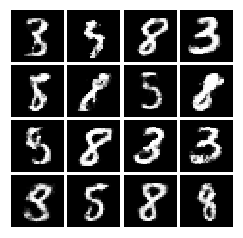

############################
Iter: 422000
D loss: 0.3691
G_loss: 3.625


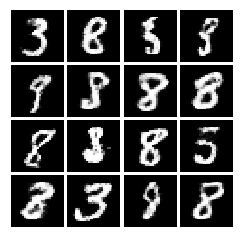

############################
Iter: 423000
D loss: 0.3942
G_loss: 3.243


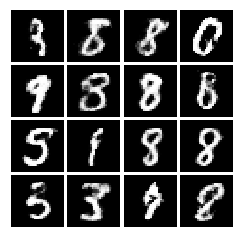

############################
Iter: 424000
D loss: 0.3485
G_loss: 3.122


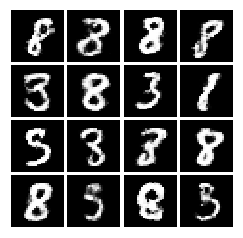

############################
Iter: 425000
D loss: 0.3739
G_loss: 3.84


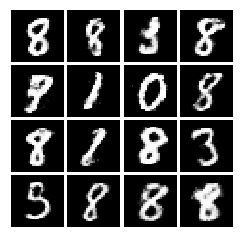

############################
Iter: 426000
D loss: 0.3677
G_loss: 3.853


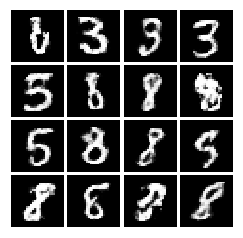

############################
Iter: 427000
D loss: 0.4675
G_loss: 3.961


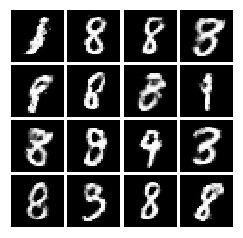

############################
Iter: 428000
D loss: 0.3452
G_loss: 3.572


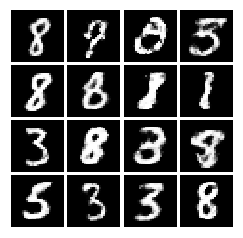

############################
Iter: 429000
D loss: 0.353
G_loss: 3.028


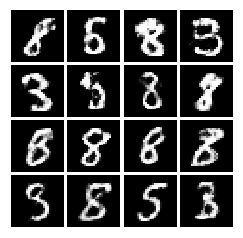

############################
Iter: 430000
D loss: 0.4318
G_loss: 4.404


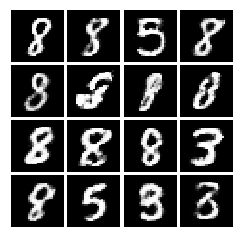

############################
Iter: 431000
D loss: 0.4099
G_loss: 3.855


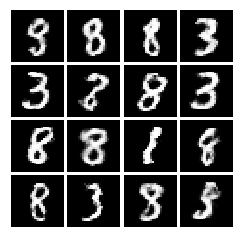

############################
Iter: 432000
D loss: 0.5404
G_loss: 4.046


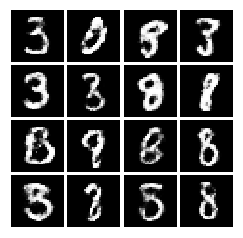

############################
Iter: 433000
D loss: 0.3517
G_loss: 3.754


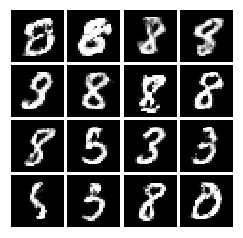

############################
Iter: 434000
D loss: 0.3441
G_loss: 3.735


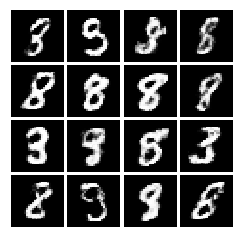

############################
Iter: 435000
D loss: 0.3355
G_loss: 3.354


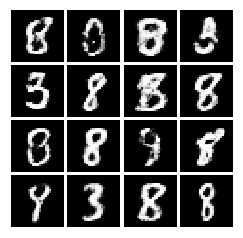

############################
Iter: 436000
D loss: 0.3495
G_loss: 3.479


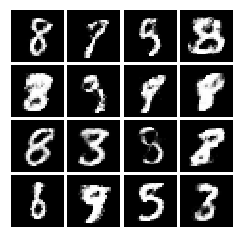

############################
Iter: 437000
D loss: 0.3356
G_loss: 3.349


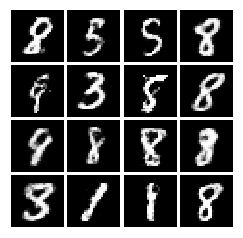

############################
Iter: 438000
D loss: 0.4124
G_loss: 3.395


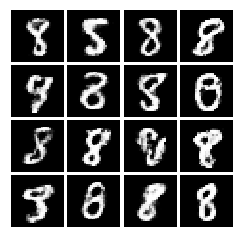

############################
Iter: 439000
D loss: 0.3024
G_loss: 3.353


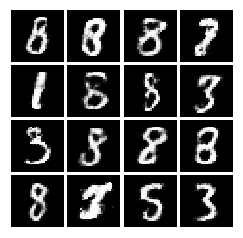

############################
Iter: 440000
D loss: 0.3654
G_loss: 4.059


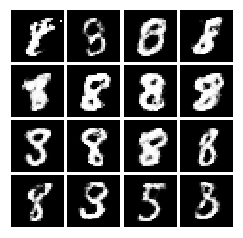

############################
Iter: 441000
D loss: 0.3062
G_loss: 3.892


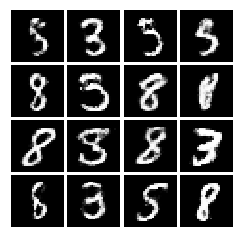

############################
Iter: 442000
D loss: 0.2964
G_loss: 3.218


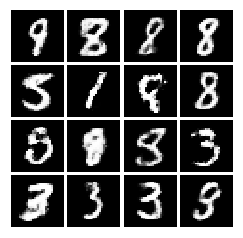

############################
Iter: 443000
D loss: 0.4289
G_loss: 4.072


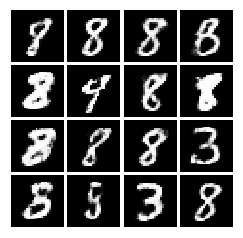

############################
Iter: 444000
D loss: 0.3773
G_loss: 3.115


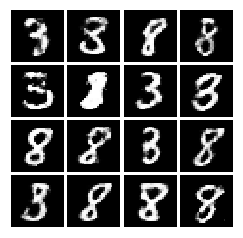

############################
Iter: 445000
D loss: 0.4807
G_loss: 3.445


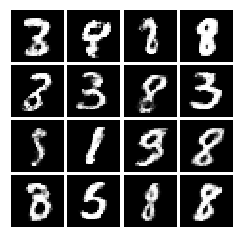

############################
Iter: 446000
D loss: 0.3476
G_loss: 3.547


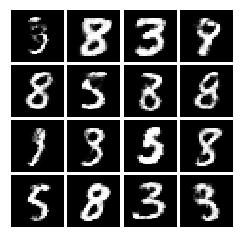

############################
Iter: 447000
D loss: 0.2849
G_loss: 3.788


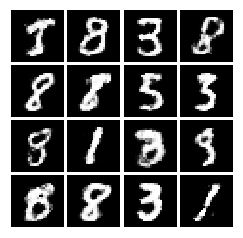

############################
Iter: 448000
D loss: 0.4174
G_loss: 3.369


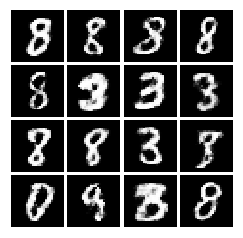

############################
Iter: 449000
D loss: 0.3384
G_loss: 3.692


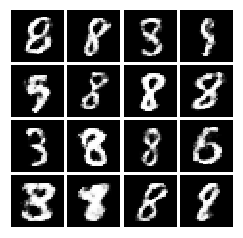

############################
Iter: 450000
D loss: 0.3443
G_loss: 3.235


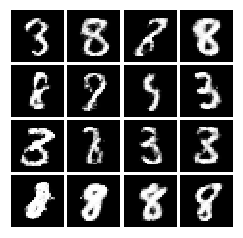

############################
Iter: 451000
D loss: 0.345
G_loss: 3.516


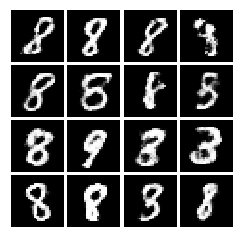

############################
Iter: 452000
D loss: 0.2962
G_loss: 3.821


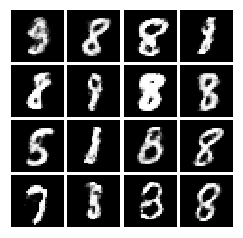

############################
Iter: 453000
D loss: 0.4429
G_loss: 3.853


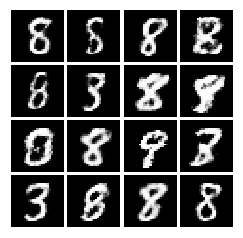

############################
Iter: 454000
D loss: 0.3702
G_loss: 4.002


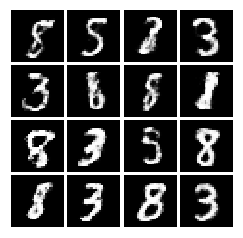

############################
Iter: 455000
D loss: 0.4465
G_loss: 3.491


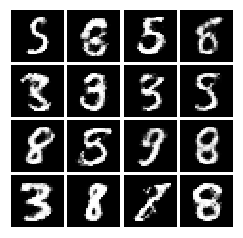

############################
Iter: 456000
D loss: 0.3379
G_loss: 3.784


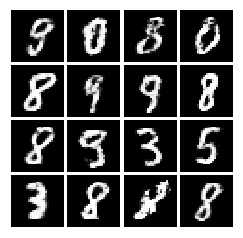

############################
Iter: 457000
D loss: 0.3664
G_loss: 4.201


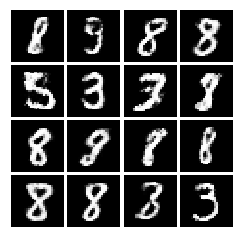

############################
Iter: 458000
D loss: 0.3901
G_loss: 3.438


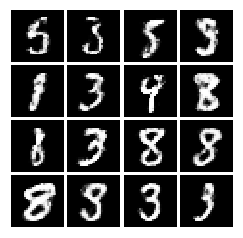

############################
Iter: 459000
D loss: 0.3226
G_loss: 3.45


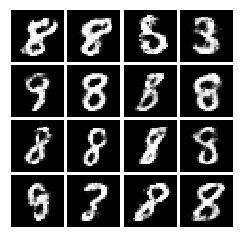

############################
Iter: 460000
D loss: 0.3453
G_loss: 4.007


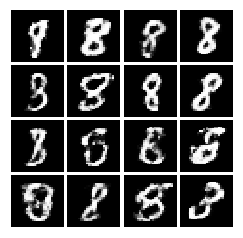

############################
Iter: 461000
D loss: 0.304
G_loss: 3.56


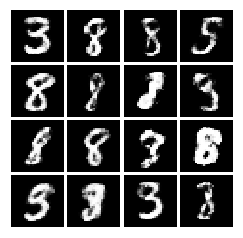

############################
Iter: 462000
D loss: 0.4858
G_loss: 4.029


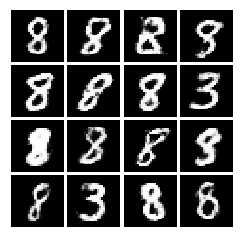

############################
Iter: 463000
D loss: 0.3959
G_loss: 3.583


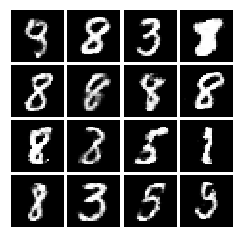

############################
Iter: 464000
D loss: 0.3463
G_loss: 3.525


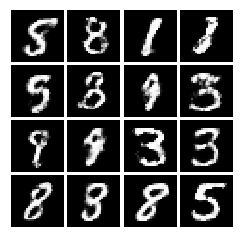

############################
Iter: 465000
D loss: 0.2476
G_loss: 3.513


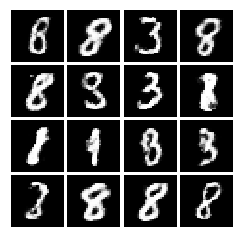

############################
Iter: 466000
D loss: 0.2977
G_loss: 4.085


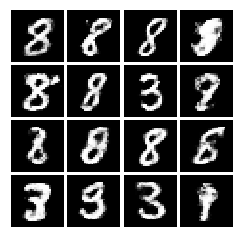

############################
Iter: 467000
D loss: 0.4299
G_loss: 3.418


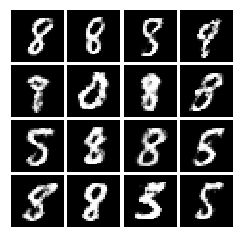

############################
Iter: 468000
D loss: 0.4087
G_loss: 4.207


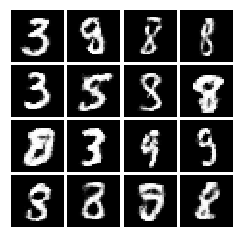

############################
Iter: 469000
D loss: 0.2524
G_loss: 3.691


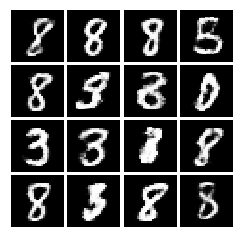

############################
Iter: 470000
D loss: 0.4736
G_loss: 3.302


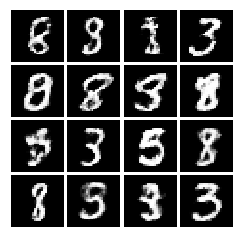

############################
Iter: 471000
D loss: 0.4517
G_loss: 4.065


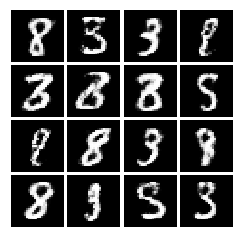

############################
Iter: 472000
D loss: 0.3754
G_loss: 3.294


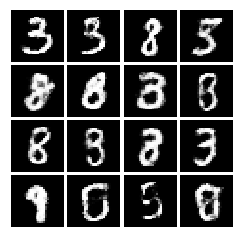

############################
Iter: 473000
D loss: 0.5034
G_loss: 3.23


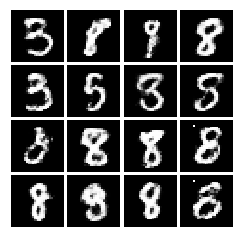

############################
Iter: 474000
D loss: 0.2857
G_loss: 3.431


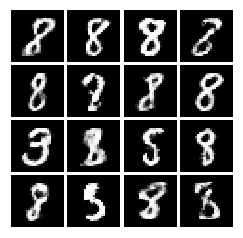

############################
Iter: 475000
D loss: 0.4174
G_loss: 3.791


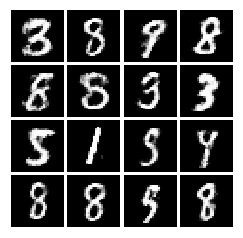

############################
Iter: 476000
D loss: 0.3359
G_loss: 3.908


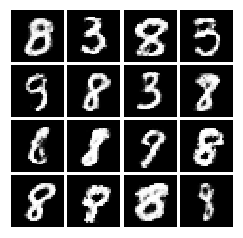

############################
Iter: 477000
D loss: 0.2936
G_loss: 3.854


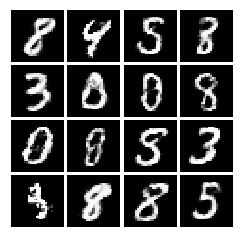

############################
Iter: 478000
D loss: 0.3475
G_loss: 3.778


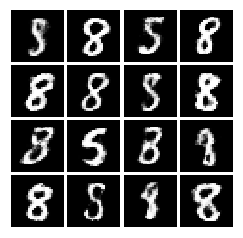

############################
Iter: 479000
D loss: 0.4341
G_loss: 3.049


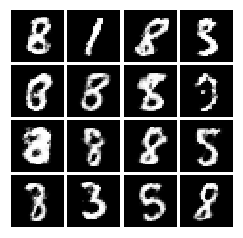

############################
Iter: 480000
D loss: 0.2491
G_loss: 3.932


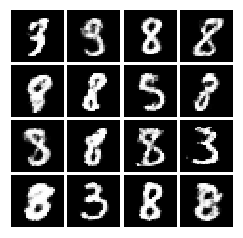

############################
Iter: 481000
D loss: 0.3992
G_loss: 3.25


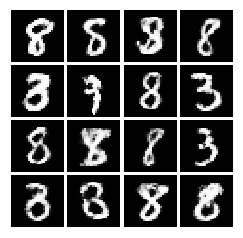

############################
Iter: 482000
D loss: 0.3367
G_loss: 3.652


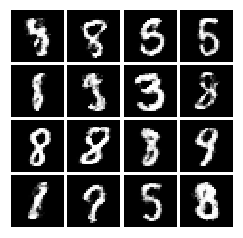

############################
Iter: 483000
D loss: 0.349
G_loss: 3.557


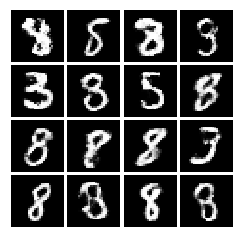

############################
Iter: 484000
D loss: 0.3693
G_loss: 3.415


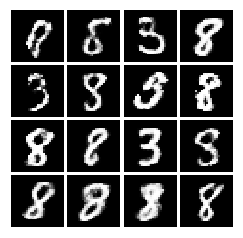

############################
Iter: 485000
D loss: 0.426
G_loss: 3.908


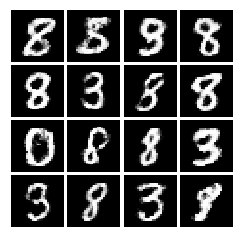

############################
Iter: 486000
D loss: 0.344
G_loss: 3.533


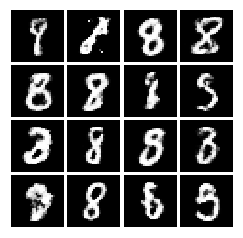

############################
Iter: 487000
D loss: 0.39
G_loss: 4.042


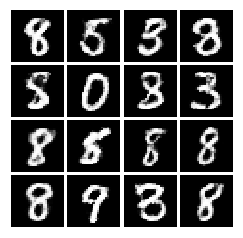

############################
Iter: 488000
D loss: 0.234
G_loss: 3.781


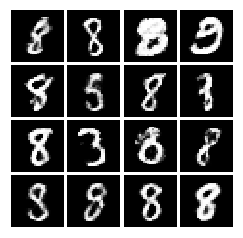

############################
Iter: 489000
D loss: 0.3016
G_loss: 4.37


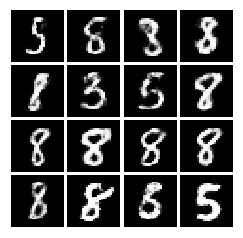

############################
Iter: 490000
D loss: 0.4091
G_loss: 3.635


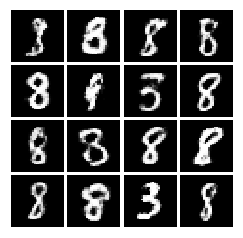

############################
Iter: 491000
D loss: 0.3207
G_loss: 3.408


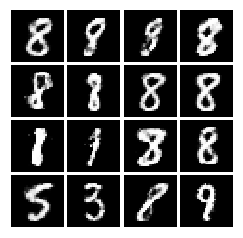

############################
Iter: 492000
D loss: 0.2126
G_loss: 3.56


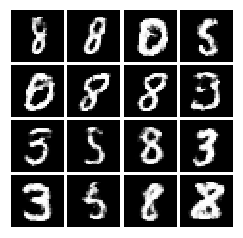

############################
Iter: 493000
D loss: 0.3563
G_loss: 3.634


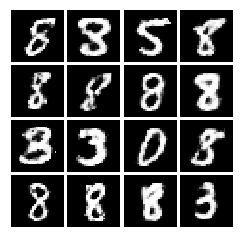

############################
Iter: 494000
D loss: 0.2461
G_loss: 3.531


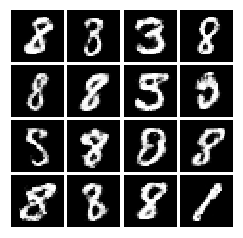

############################
Iter: 495000
D loss: 0.3205
G_loss: 3.983


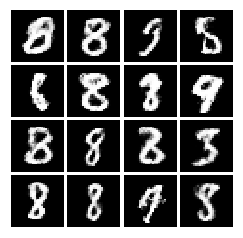

############################
Iter: 496000
D loss: 0.4653
G_loss: 3.413


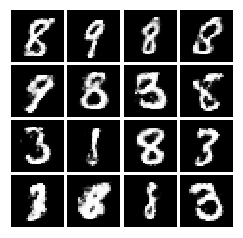

############################
Iter: 497000
D loss: 0.3607
G_loss: 3.879


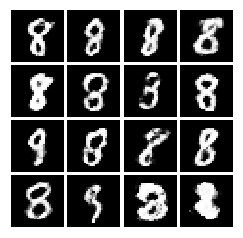

############################
Iter: 498000
D loss: 0.3774
G_loss: 3.531


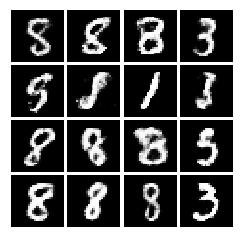

############################
Iter: 499000
D loss: 0.3415
G_loss: 3.848


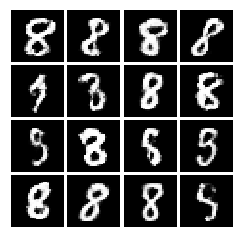

############################
Iter: 500000
D loss: 0.3764
G_loss: 4.027


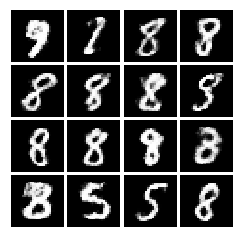

############################
Iter: 501000
D loss: 0.3403
G_loss: 3.708


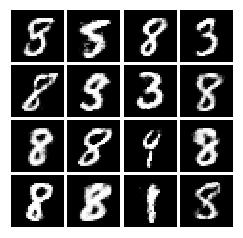

############################
Iter: 502000
D loss: 0.3267
G_loss: 3.653


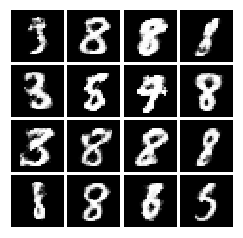

############################
Iter: 503000
D loss: 0.4315
G_loss: 3.269


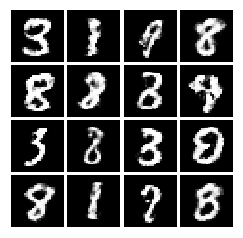

############################
Iter: 504000
D loss: 0.2936
G_loss: 3.747


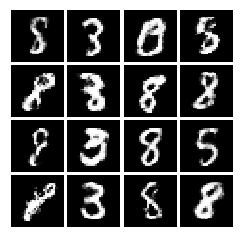

############################
Iter: 505000
D loss: 0.3606
G_loss: 3.53


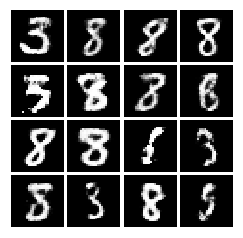

############################
Iter: 506000
D loss: 0.344
G_loss: 3.762


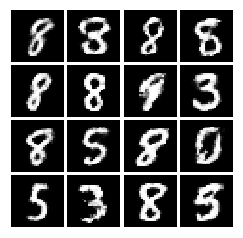

############################
Iter: 507000
D loss: 0.3735
G_loss: 3.984


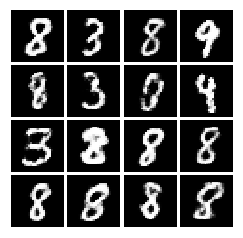

############################
Iter: 508000
D loss: 0.2863
G_loss: 4.011


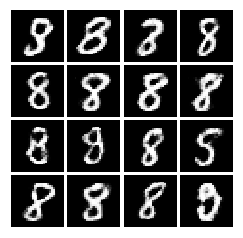

############################
Iter: 509000
D loss: 0.3942
G_loss: 3.673


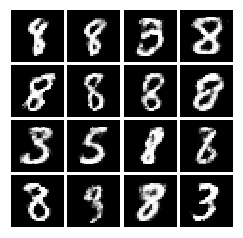

############################
Iter: 510000
D loss: 0.3424
G_loss: 4.027


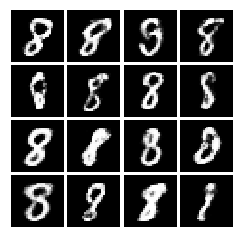

############################
Iter: 511000
D loss: 0.4311
G_loss: 3.925


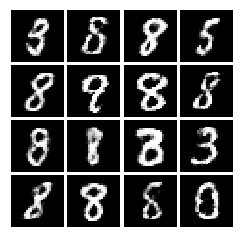

############################
Iter: 512000
D loss: 0.3222
G_loss: 3.816


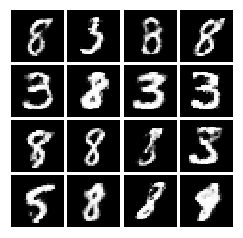

############################
Iter: 513000
D loss: 0.3295
G_loss: 3.308


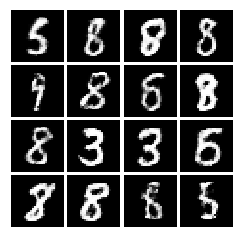

############################
Iter: 514000
D loss: 0.3104
G_loss: 4.021


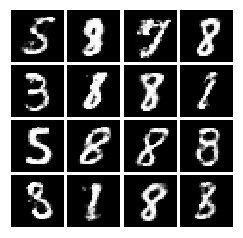

############################
Iter: 515000
D loss: 0.3889
G_loss: 3.533


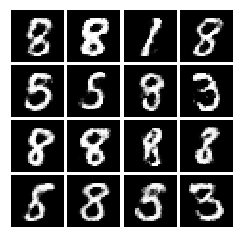

############################
Iter: 516000
D loss: 0.2882
G_loss: 3.82


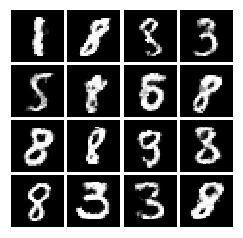

############################
Iter: 517000
D loss: 0.3139
G_loss: 3.566


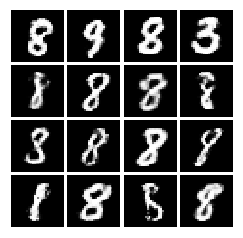

############################
Iter: 518000
D loss: 0.4114
G_loss: 3.904


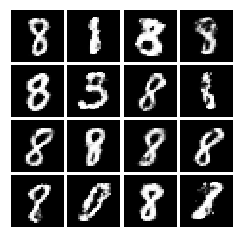

############################
Iter: 519000
D loss: 0.3122
G_loss: 4.007


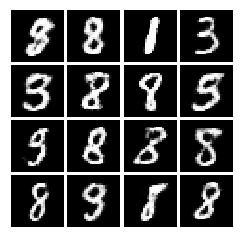

############################
Iter: 520000
D loss: 0.4013
G_loss: 3.756


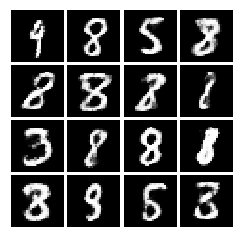

############################
Iter: 521000
D loss: 0.3265
G_loss: 3.604


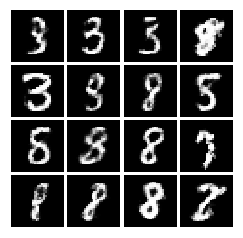

############################
Iter: 522000
D loss: 0.4252
G_loss: 3.552


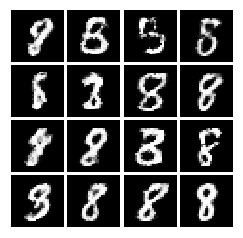

############################
Iter: 523000
D loss: 0.3834
G_loss: 3.92


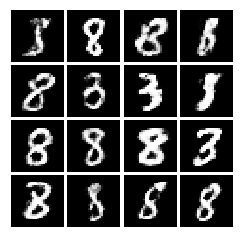

############################
Iter: 524000
D loss: 0.3172
G_loss: 3.562


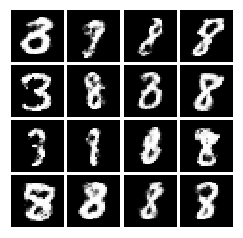

############################
Iter: 525000
D loss: 0.3616
G_loss: 3.762


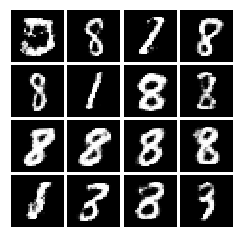

############################
Iter: 526000
D loss: 0.3574
G_loss: 3.842


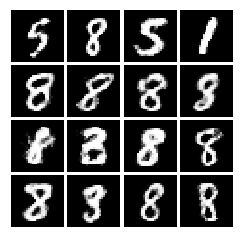

############################
Iter: 527000
D loss: 0.3576
G_loss: 3.92


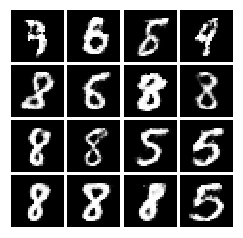

############################
Iter: 528000
D loss: 0.3282
G_loss: 3.988


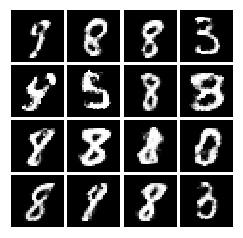

############################
Iter: 529000
D loss: 0.3034
G_loss: 3.711


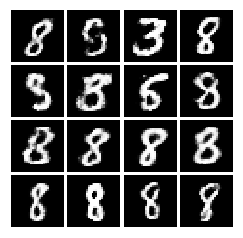

############################
Iter: 530000
D loss: 0.3371
G_loss: 3.819


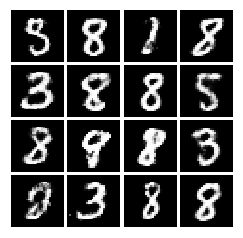

############################
Iter: 531000
D loss: 0.3416
G_loss: 3.838


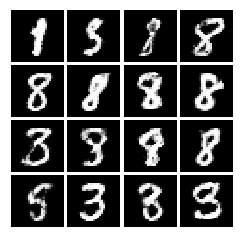

############################
Iter: 532000
D loss: 0.2658
G_loss: 3.347


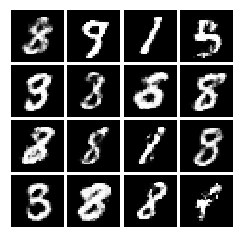

############################
Iter: 533000
D loss: 0.4706
G_loss: 3.701


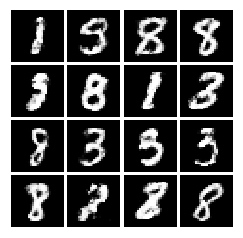

############################
Iter: 534000
D loss: 0.4303
G_loss: 4.256


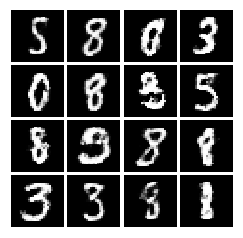

############################
Iter: 535000
D loss: 0.3534
G_loss: 3.982


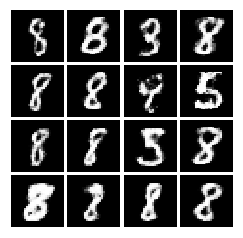

############################
Iter: 536000
D loss: 0.2664
G_loss: 3.786


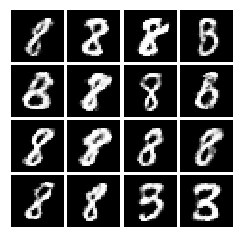

############################
Iter: 537000
D loss: 0.4171
G_loss: 3.77


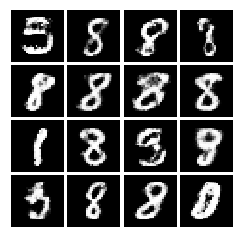

############################
Iter: 538000
D loss: 0.3016
G_loss: 3.75


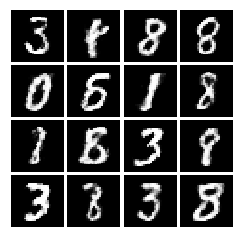

############################
Iter: 539000
D loss: 0.2989
G_loss: 3.769


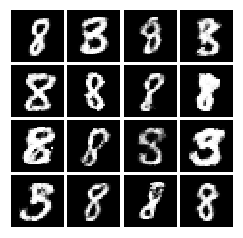

############################
Iter: 540000
D loss: 0.2759
G_loss: 4.07


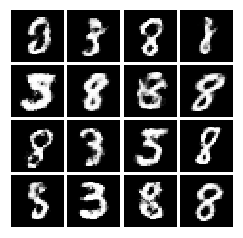

############################
Iter: 541000
D loss: 0.3307
G_loss: 3.546


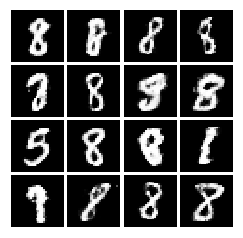

############################
Iter: 542000
D loss: 0.3399
G_loss: 3.975


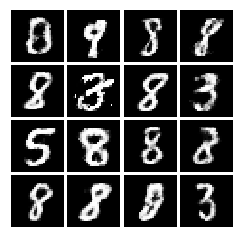

############################
Iter: 543000
D loss: 0.2802
G_loss: 3.615


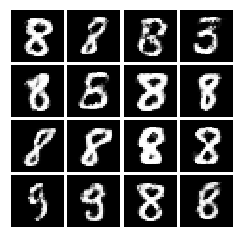

############################
Iter: 544000
D loss: 0.2841
G_loss: 3.768


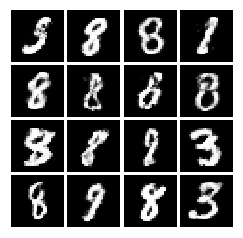

############################
Iter: 545000
D loss: 0.4991
G_loss: 4.129


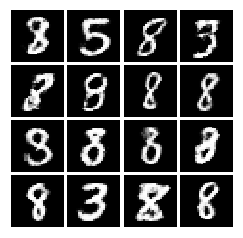

############################
Iter: 546000
D loss: 0.3579
G_loss: 3.818


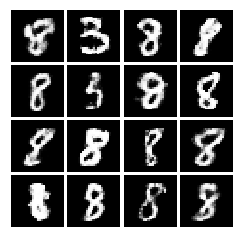

############################
Iter: 547000
D loss: 0.271
G_loss: 3.393


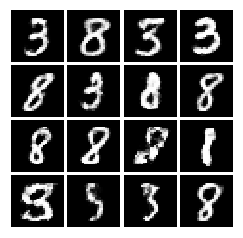

############################
Iter: 548000
D loss: 0.2597
G_loss: 3.648


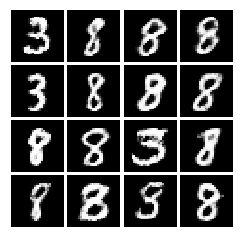

############################
Iter: 549000
D loss: 0.3642
G_loss: 4.401


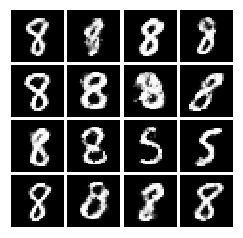

############################
Iter: 550000
D loss: 0.2257
G_loss: 4.29


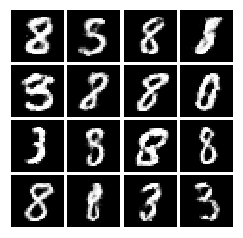

############################
Iter: 551000
D loss: 0.5553
G_loss: 3.697


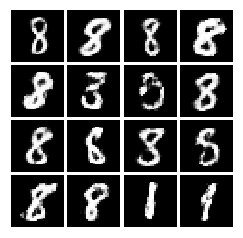

############################
Iter: 552000
D loss: 0.2808
G_loss: 3.9


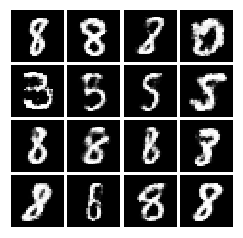

############################
Iter: 553000
D loss: 0.3515
G_loss: 3.927


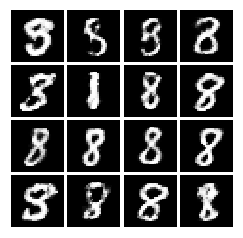

############################
Iter: 554000
D loss: 0.2746
G_loss: 3.628


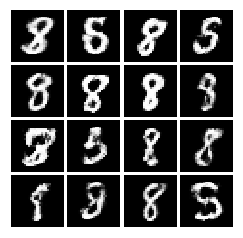

############################
Iter: 555000
D loss: 0.3134
G_loss: 3.329


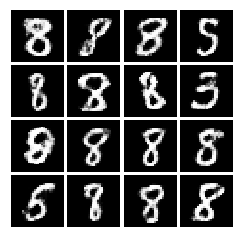

############################
Iter: 556000
D loss: 0.3297
G_loss: 4.007


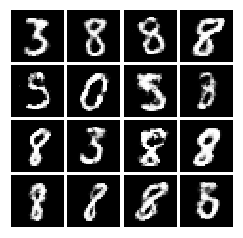

############################
Iter: 557000
D loss: 0.2894
G_loss: 3.095


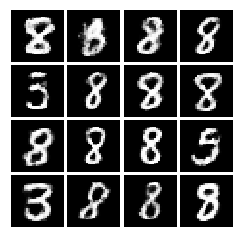

############################
Iter: 558000
D loss: 0.2851
G_loss: 3.793


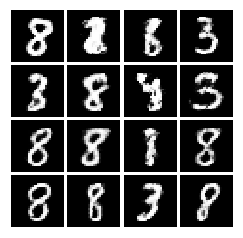

############################
Iter: 559000
D loss: 0.2141
G_loss: 4.256


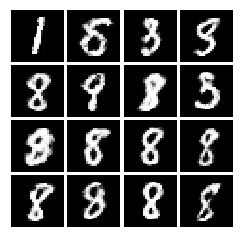

############################
Iter: 560000
D loss: 0.2494
G_loss: 3.329


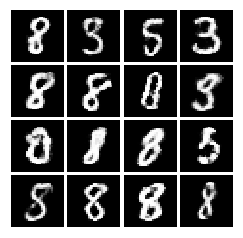

############################
Iter: 561000
D loss: 0.2214
G_loss: 3.708


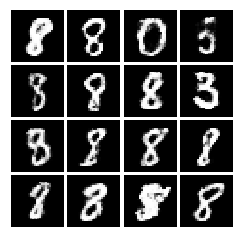

############################
Iter: 562000
D loss: 0.258
G_loss: 3.685


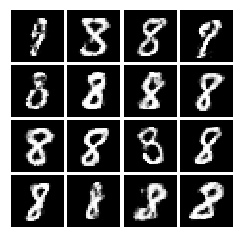

############################
Iter: 563000
D loss: 0.3275
G_loss: 3.794


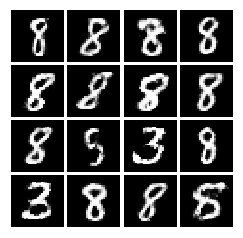

############################
Iter: 564000
D loss: 0.2637
G_loss: 3.249


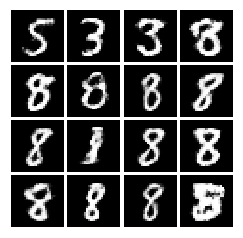

############################
Iter: 565000
D loss: 0.2271
G_loss: 3.576


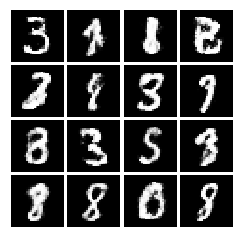

############################
Iter: 566000
D loss: 0.3899
G_loss: 3.517


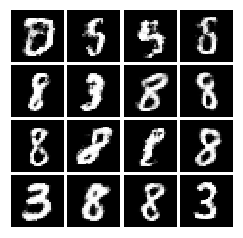

############################
Iter: 567000
D loss: 0.4337
G_loss: 3.557


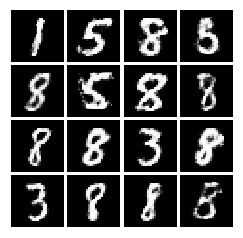

############################
Iter: 568000
D loss: 0.2887
G_loss: 3.986


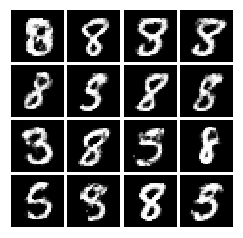

############################
Iter: 569000
D loss: 0.3226
G_loss: 3.701


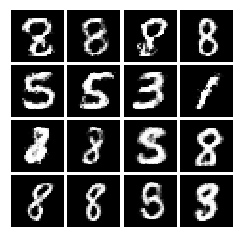

############################
Iter: 570000
D loss: 0.3036
G_loss: 4.293


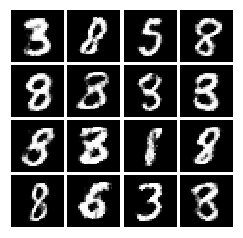

############################
Iter: 571000
D loss: 0.3056
G_loss: 3.599


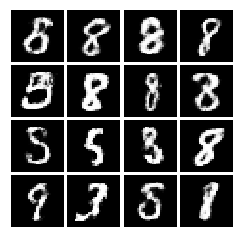

############################
Iter: 572000
D loss: 0.3226
G_loss: 4.251


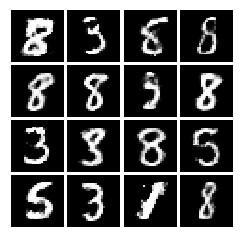

############################
Iter: 573000
D loss: 0.315
G_loss: 3.147


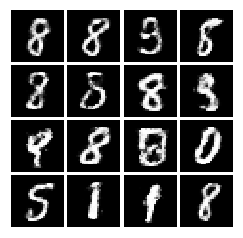

############################
Iter: 574000
D loss: 0.3578
G_loss: 3.964


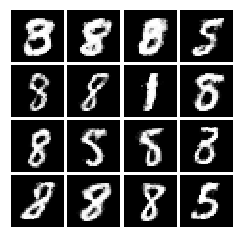

############################
Iter: 575000
D loss: 0.3403
G_loss: 3.16


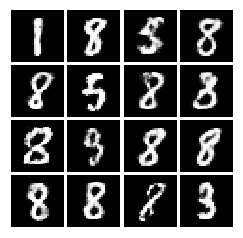

############################
Iter: 576000
D loss: 0.3374
G_loss: 3.385


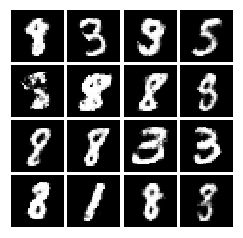

############################
Iter: 577000
D loss: 0.3961
G_loss: 3.673


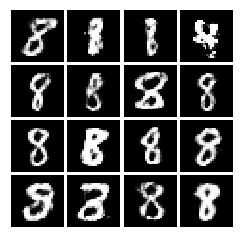

############################
Iter: 578000
D loss: 0.2933
G_loss: 3.955


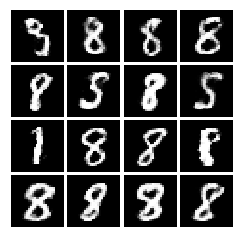

############################
Iter: 579000
D loss: 0.3238
G_loss: 3.626


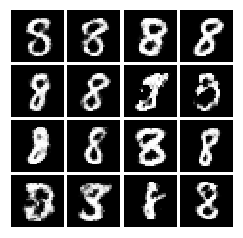

############################
Iter: 580000
D loss: 0.2916
G_loss: 3.709


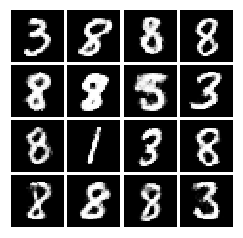

############################
Iter: 581000
D loss: 0.3806
G_loss: 3.13


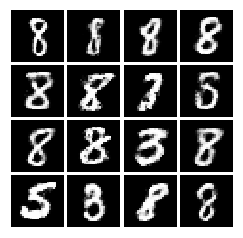

############################
Iter: 582000
D loss: 0.2847
G_loss: 3.997


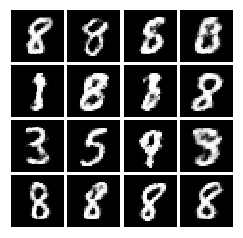

############################
Iter: 583000
D loss: 0.2403
G_loss: 3.594


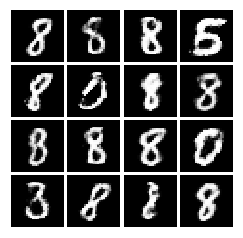

############################
Iter: 584000
D loss: 0.353
G_loss: 3.964


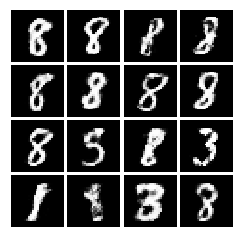

############################
Iter: 585000
D loss: 0.2515
G_loss: 3.827


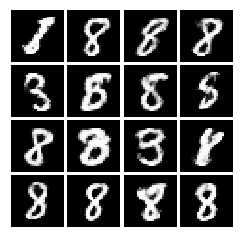

############################
Iter: 586000
D loss: 0.2977
G_loss: 3.723


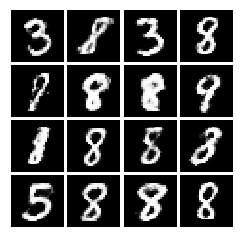

############################
Iter: 587000
D loss: 0.3146
G_loss: 3.953


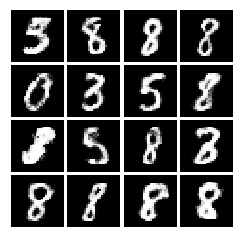

############################
Iter: 588000
D loss: 0.309
G_loss: 3.16


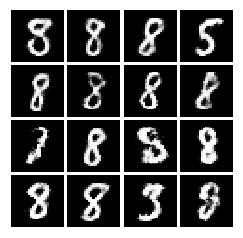

############################
Iter: 589000
D loss: 0.2492
G_loss: 4.523


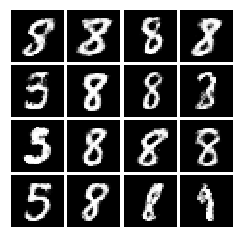

############################
Iter: 590000
D loss: 0.2553
G_loss: 4.022


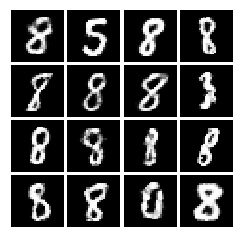

############################
Iter: 591000
D loss: 0.2433
G_loss: 4.402


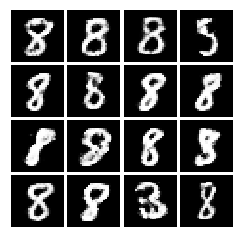

############################
Iter: 592000
D loss: 0.313
G_loss: 3.549


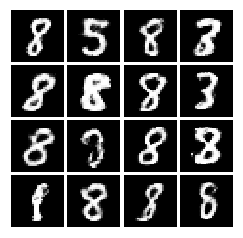

############################
Iter: 593000
D loss: 0.3216
G_loss: 4.404


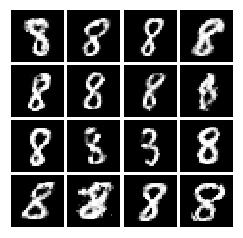

############################
Iter: 594000
D loss: 0.3035
G_loss: 3.825


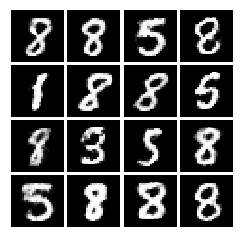

############################
Iter: 595000
D loss: 0.3702
G_loss: 3.838


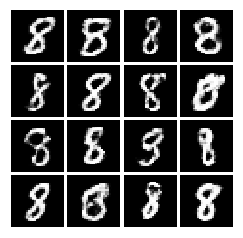

############################
Iter: 596000
D loss: 0.2585
G_loss: 4.036


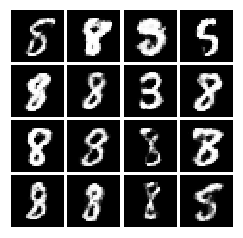

############################
Iter: 597000
D loss: 0.3413
G_loss: 3.823


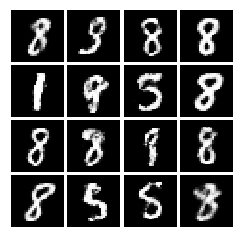

############################
Iter: 598000
D loss: 0.313
G_loss: 4.17


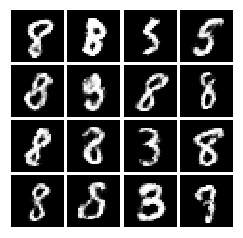

############################
Iter: 599000
D loss: 0.2306
G_loss: 3.937


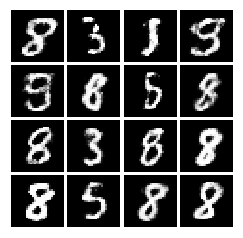

############################
Iter: 600000
D loss: 0.3629
G_loss: 3.681


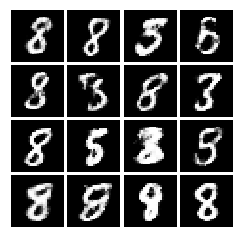

############################
Iter: 601000
D loss: 0.2343
G_loss: 4.069


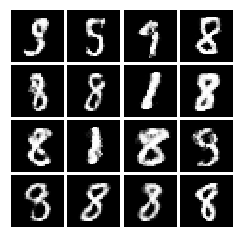

############################
Iter: 602000
D loss: 0.2809
G_loss: 3.946


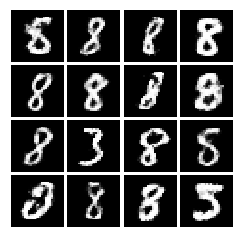

############################
Iter: 603000
D loss: 0.2294
G_loss: 3.597


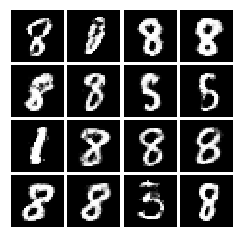

############################
Iter: 604000
D loss: 0.3641
G_loss: 3.556


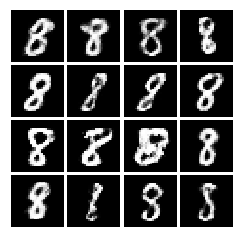

############################
Iter: 605000
D loss: 0.3339
G_loss: 4.082


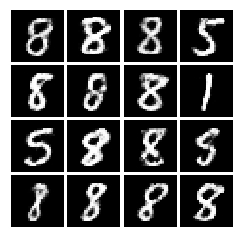

############################
Iter: 606000
D loss: 0.294
G_loss: 3.306


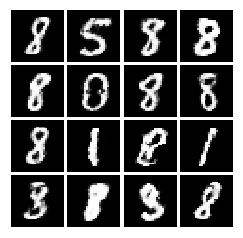

############################
Iter: 607000
D loss: 0.3146
G_loss: 3.271


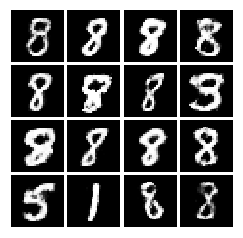

############################
Iter: 608000
D loss: 0.2754
G_loss: 3.649


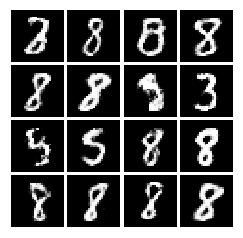

############################
Iter: 609000
D loss: 0.2452
G_loss: 3.773


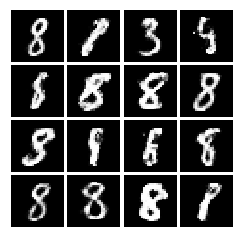

############################
Iter: 610000
D loss: 0.4302
G_loss: 4.915


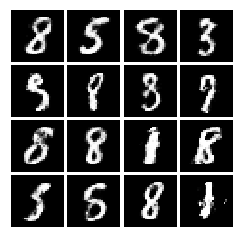

############################
Iter: 611000
D loss: 0.3729
G_loss: 3.631


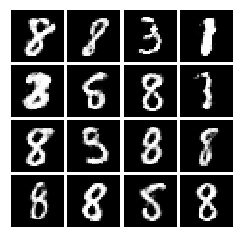

############################
Iter: 612000
D loss: 0.3864
G_loss: 4.599


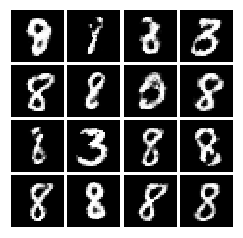

############################
Iter: 613000
D loss: 0.2697
G_loss: 3.999


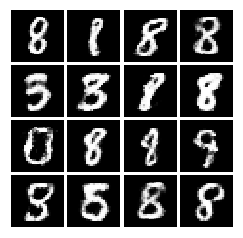

############################
Iter: 614000
D loss: 0.3555
G_loss: 4.379


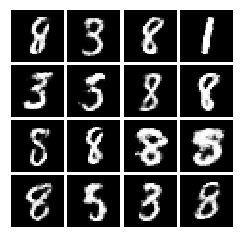

############################
Iter: 615000
D loss: 0.287
G_loss: 3.984


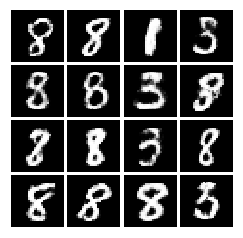

############################
Iter: 616000
D loss: 0.1757
G_loss: 3.896


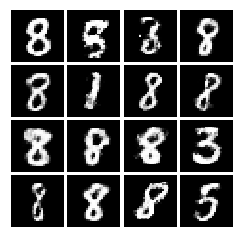

############################
Iter: 617000
D loss: 0.2417
G_loss: 3.709


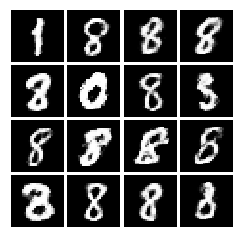

############################
Iter: 618000
D loss: 0.3511
G_loss: 3.773


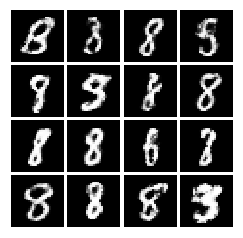

############################
Iter: 619000
D loss: 0.238
G_loss: 3.751


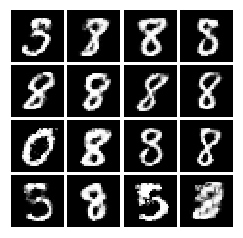

############################
Iter: 620000
D loss: 0.2662
G_loss: 3.76


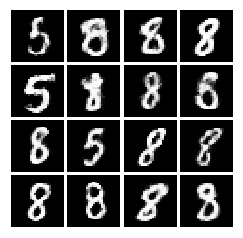

############################
Iter: 621000
D loss: 0.1938
G_loss: 4.405


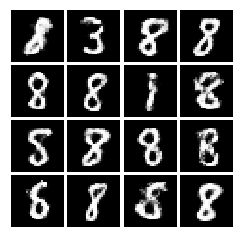

############################
Iter: 622000
D loss: 0.3978
G_loss: 4.132


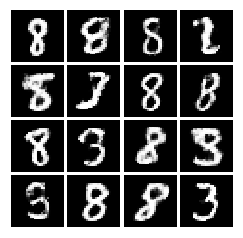

############################
Iter: 623000
D loss: 0.2153
G_loss: 3.71


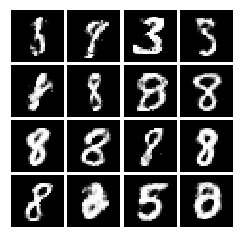

############################
Iter: 624000
D loss: 0.3517
G_loss: 3.624


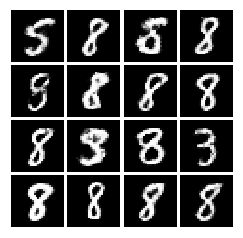

############################
Iter: 625000
D loss: 0.2016
G_loss: 4.377


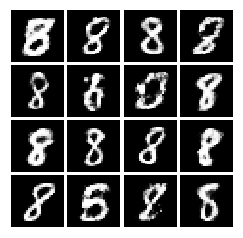

############################
Iter: 626000
D loss: 0.3125
G_loss: 4.13


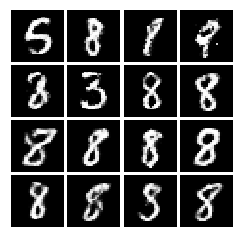

############################
Iter: 627000
D loss: 0.2657
G_loss: 4.06


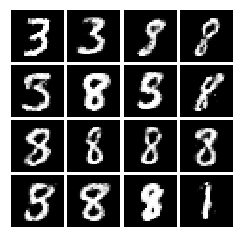

############################
Iter: 628000
D loss: 0.2456
G_loss: 3.348


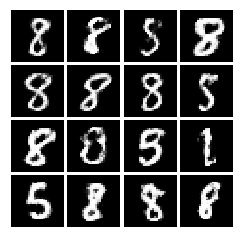

############################
Iter: 629000
D loss: 0.2709
G_loss: 3.529


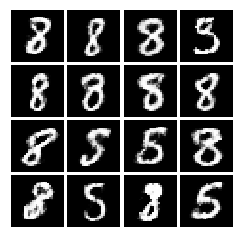

############################
Iter: 630000
D loss: 0.2113
G_loss: 4.14


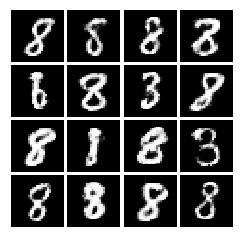

############################
Iter: 631000
D loss: 0.2169
G_loss: 3.679


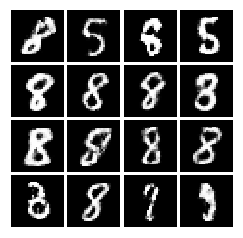

############################
Iter: 632000
D loss: 0.1862
G_loss: 4.115


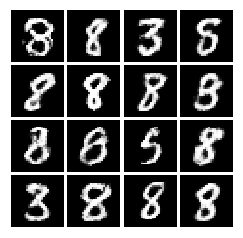

############################
Iter: 633000
D loss: 0.2342
G_loss: 3.93


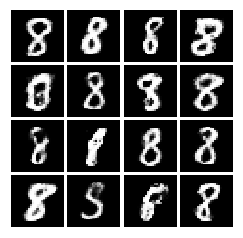

############################
Iter: 634000
D loss: 0.3255
G_loss: 3.612


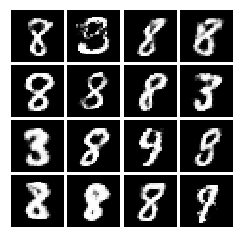

############################
Iter: 635000
D loss: 0.3263
G_loss: 4.335


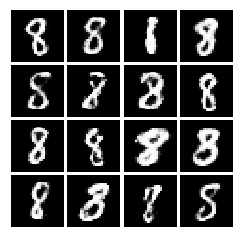

############################
Iter: 636000
D loss: 0.247
G_loss: 3.893


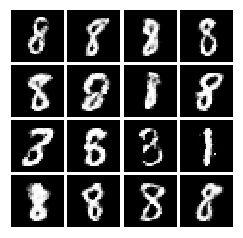

############################
Iter: 637000
D loss: 0.2482
G_loss: 4.483


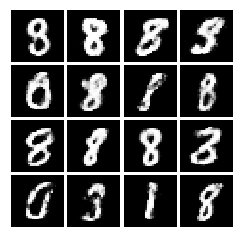

############################
Iter: 638000
D loss: 0.2966
G_loss: 4.29


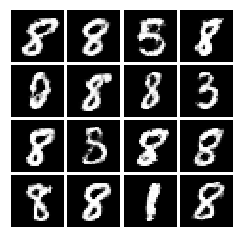

############################
Iter: 639000
D loss: 0.3247
G_loss: 4.384


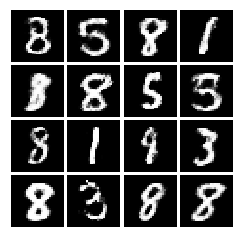

############################
Iter: 640000
D loss: 0.3566
G_loss: 3.934


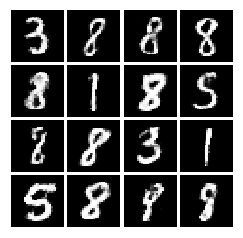

############################
Iter: 641000
D loss: 0.3277
G_loss: 3.521


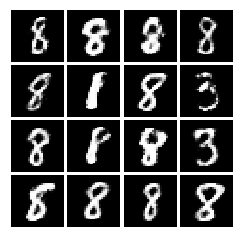

############################
Iter: 642000
D loss: 0.2662
G_loss: 4.164


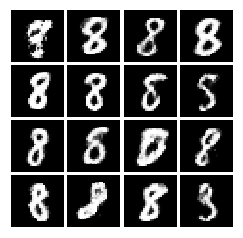

############################
Iter: 643000
D loss: 0.2015
G_loss: 3.568


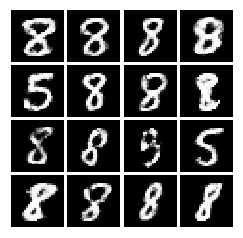

############################
Iter: 644000
D loss: 0.2814
G_loss: 3.71


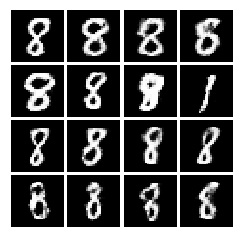

############################
Iter: 645000
D loss: 0.366
G_loss: 3.806


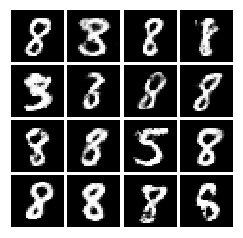

############################
Iter: 646000
D loss: 0.3085
G_loss: 4.098


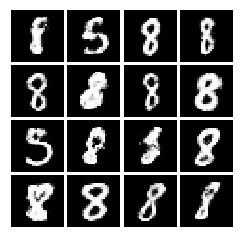

############################
Iter: 647000
D loss: 0.2554
G_loss: 3.791


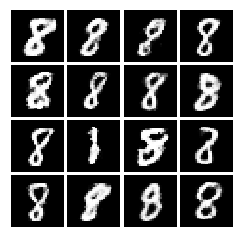

############################
Iter: 648000
D loss: 0.3161
G_loss: 3.759


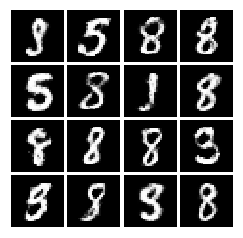

############################
Iter: 649000
D loss: 0.313
G_loss: 3.826


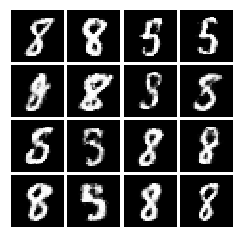

############################
Iter: 650000
D loss: 0.3283
G_loss: 3.784


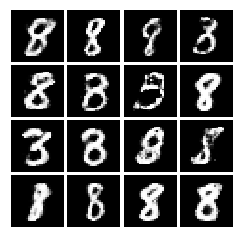

############################
Iter: 651000
D loss: 0.3138
G_loss: 3.585


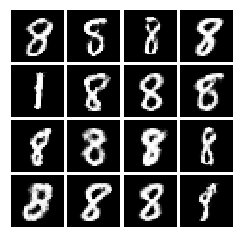

############################
Iter: 652000
D loss: 0.3692
G_loss: 3.954


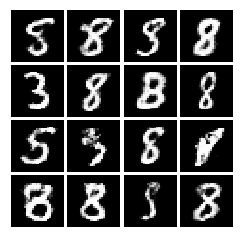

############################
Iter: 653000
D loss: 0.2392
G_loss: 3.899


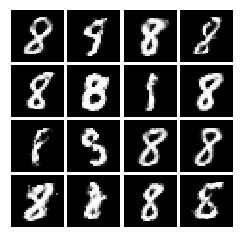

############################
Iter: 654000
D loss: 0.3891
G_loss: 3.995


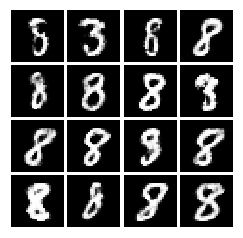

############################
Iter: 655000
D loss: 0.2783
G_loss: 4.023


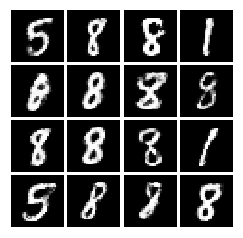

############################
Iter: 656000
D loss: 0.2287
G_loss: 3.469


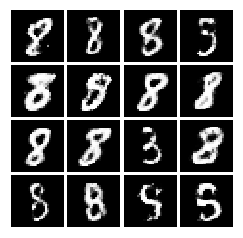

############################
Iter: 657000
D loss: 0.2916
G_loss: 4.367


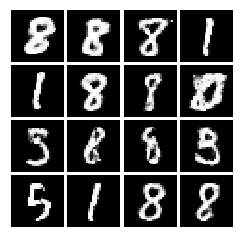

############################
Iter: 658000
D loss: 0.2293
G_loss: 4.325


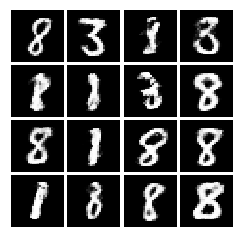

############################
Iter: 659000
D loss: 0.2349
G_loss: 4.117


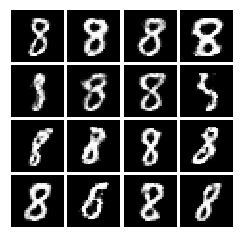

############################
Iter: 660000
D loss: 0.3344
G_loss: 4.055


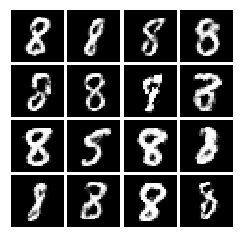

############################
Iter: 661000
D loss: 0.3351
G_loss: 3.579


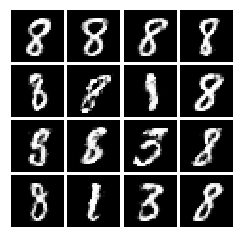

############################
Iter: 662000
D loss: 0.2208
G_loss: 3.969


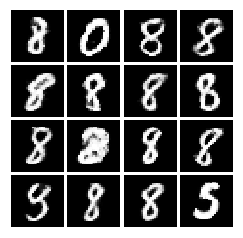

############################
Iter: 663000
D loss: 0.2558
G_loss: 4.033


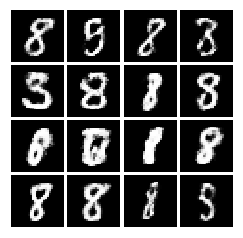

############################
Iter: 664000
D loss: 0.2903
G_loss: 4.089


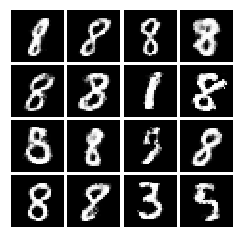

############################
Iter: 665000
D loss: 0.2968
G_loss: 3.246


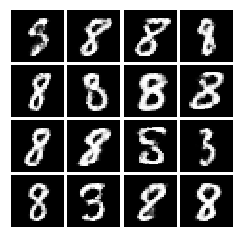

############################
Iter: 666000
D loss: 0.2506
G_loss: 4.105


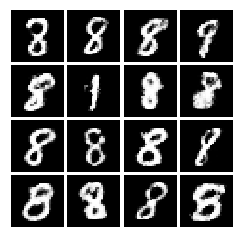

############################
Iter: 667000
D loss: 0.2954
G_loss: 3.73


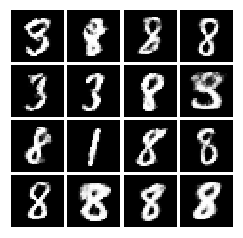

############################
Iter: 668000
D loss: 0.2445
G_loss: 3.905


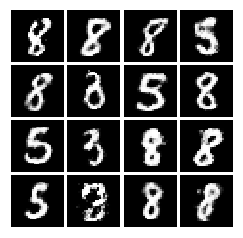

############################
Iter: 669000
D loss: 0.3801
G_loss: 3.139


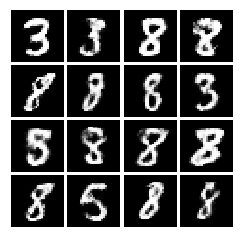

############################
Iter: 670000
D loss: 0.38
G_loss: 4.383


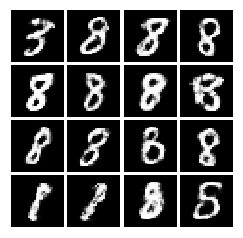

############################
Iter: 671000
D loss: 0.264
G_loss: 3.923


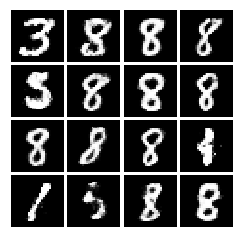

############################
Iter: 672000
D loss: 0.3133
G_loss: 4.183


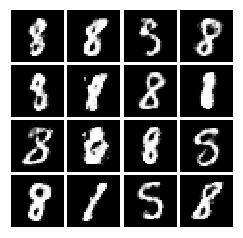

############################
Iter: 673000
D loss: 0.2946
G_loss: 4.841


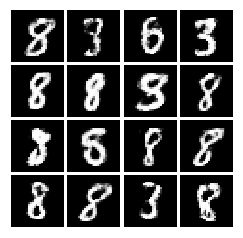

############################
Iter: 674000
D loss: 0.1771
G_loss: 4.019


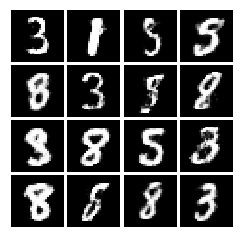

############################
Iter: 675000
D loss: 0.3486
G_loss: 4.179


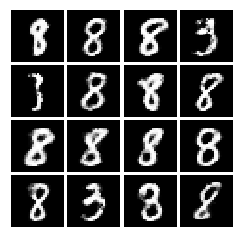

############################
Iter: 676000
D loss: 0.2983
G_loss: 3.926


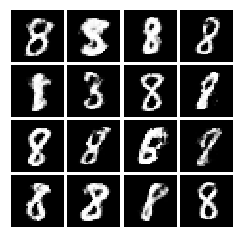

############################
Iter: 677000
D loss: 0.3539
G_loss: 3.547


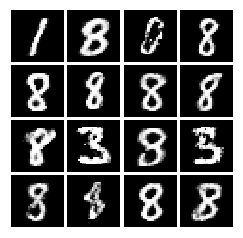

############################
Iter: 678000
D loss: 0.3234
G_loss: 3.89


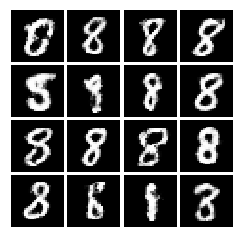

############################
Iter: 679000
D loss: 0.3028
G_loss: 3.87


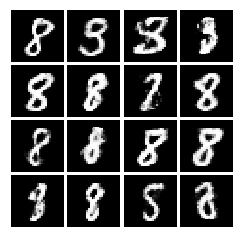

############################
Iter: 680000
D loss: 0.4836
G_loss: 4.261


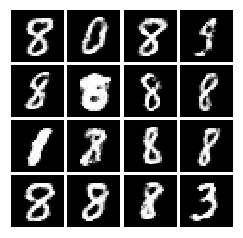

############################
Iter: 681000
D loss: 0.3528
G_loss: 3.741


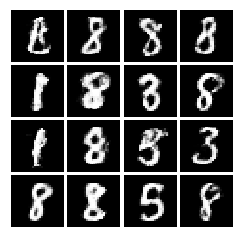

############################
Iter: 682000
D loss: 0.3119
G_loss: 3.577


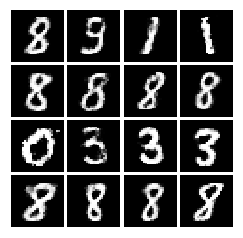

############################
Iter: 683000
D loss: 0.2734
G_loss: 4.205


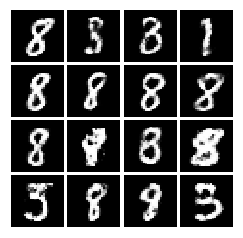

############################
Iter: 684000
D loss: 0.2634
G_loss: 4.591


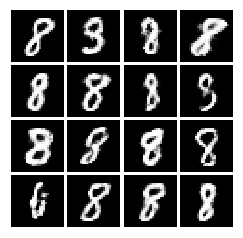

############################
Iter: 685000
D loss: 0.3338
G_loss: 3.633


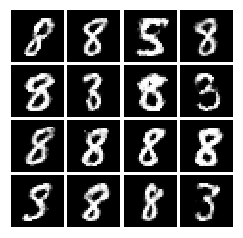

############################
Iter: 686000
D loss: 0.225
G_loss: 3.936


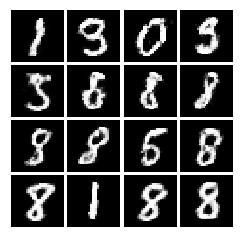

############################
Iter: 687000
D loss: 0.2218
G_loss: 4.241


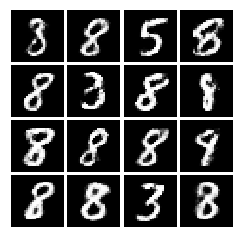

############################
Iter: 688000
D loss: 0.2347
G_loss: 3.845


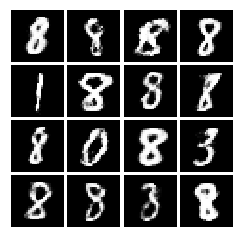

############################
Iter: 689000
D loss: 0.2796
G_loss: 4.556


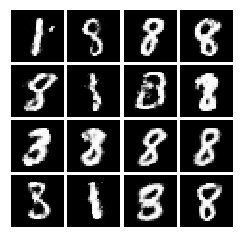

############################
Iter: 690000
D loss: 0.3113
G_loss: 3.785


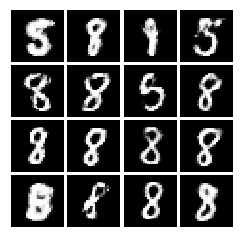

############################
Iter: 691000
D loss: 0.2273
G_loss: 4.109


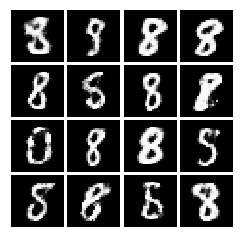

############################
Iter: 692000
D loss: 0.2896
G_loss: 4.654


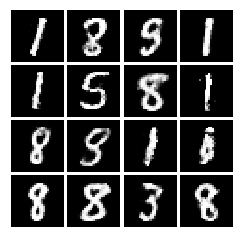

############################
Iter: 693000
D loss: 0.3695
G_loss: 3.718


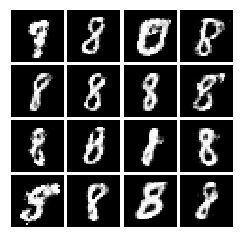

############################
Iter: 694000
D loss: 0.2437
G_loss: 3.829


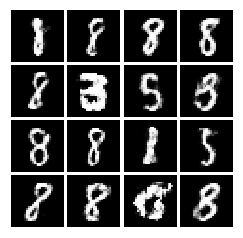

############################
Iter: 695000
D loss: 0.2241
G_loss: 3.984


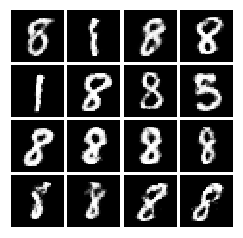

############################
Iter: 696000
D loss: 0.325
G_loss: 4.438


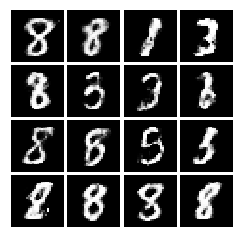

############################
Iter: 697000
D loss: 0.3126
G_loss: 3.978


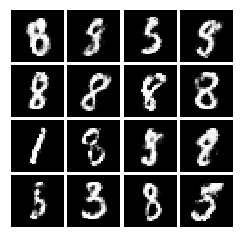

############################
Iter: 698000
D loss: 0.1788
G_loss: 3.956


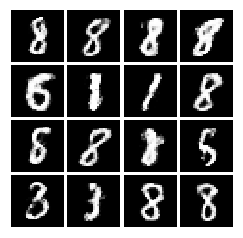

############################
Iter: 699000
D loss: 0.2411
G_loss: 3.56


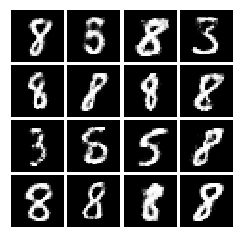

############################
Iter: 700000
D loss: 0.2017
G_loss: 4.438


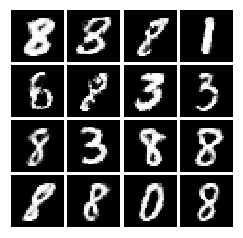

############################
Iter: 701000
D loss: 0.3244
G_loss: 4.431


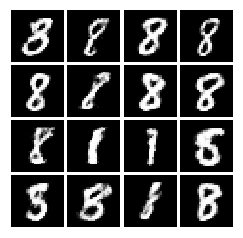

############################
Iter: 702000
D loss: 0.1583
G_loss: 3.776


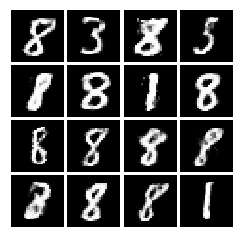

############################
Iter: 703000
D loss: 0.2665
G_loss: 4.076


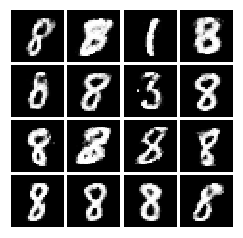

############################
Iter: 704000
D loss: 0.3723
G_loss: 4.159


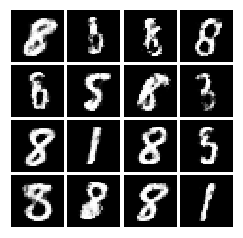

############################
Iter: 705000
D loss: 0.354
G_loss: 4.096


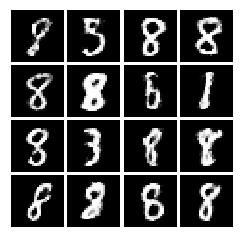

############################
Iter: 706000
D loss: 0.4109
G_loss: 4.085


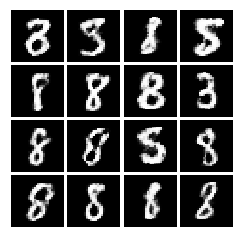

############################
Iter: 707000
D loss: 0.2693
G_loss: 3.966


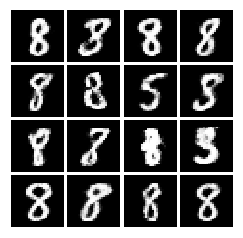

############################
Iter: 708000
D loss: 0.3354
G_loss: 4.739


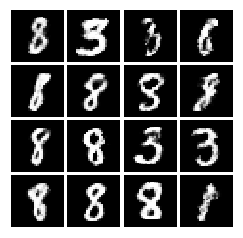

############################
Iter: 709000
D loss: 0.2464
G_loss: 5.174


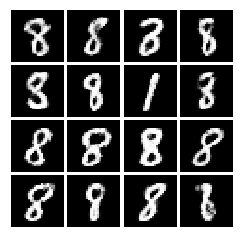

############################
Iter: 710000
D loss: 0.3955
G_loss: 4.568


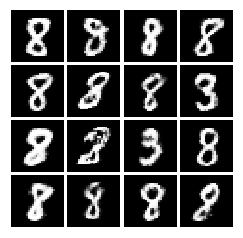

############################
Iter: 711000
D loss: 0.3271
G_loss: 4.241


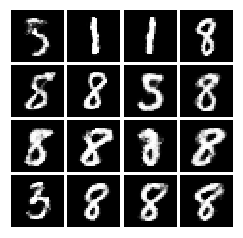

############################
Iter: 712000
D loss: 0.339
G_loss: 4.854


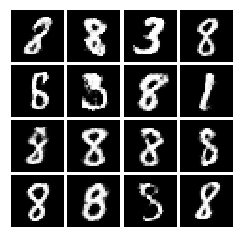

############################
Iter: 713000
D loss: 0.234
G_loss: 4.495


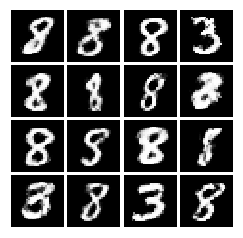

############################
Iter: 714000
D loss: 0.2759
G_loss: 4.489


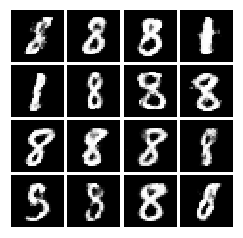

############################
Iter: 715000
D loss: 0.2641
G_loss: 3.655


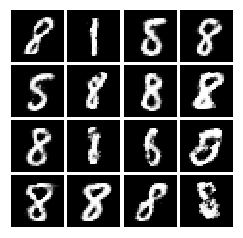

############################
Iter: 716000
D loss: 0.3574
G_loss: 4.239


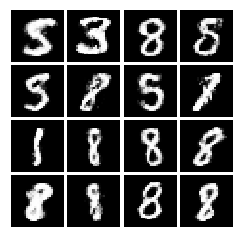

############################
Iter: 717000
D loss: 0.3016
G_loss: 4.024


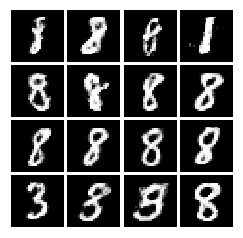

############################
Iter: 718000
D loss: 0.2129
G_loss: 3.857


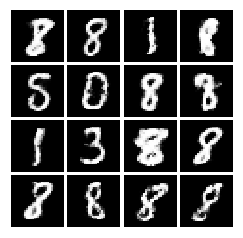

############################
Iter: 719000
D loss: 0.3617
G_loss: 4.085


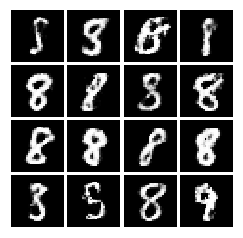

############################
Iter: 720000
D loss: 0.2612
G_loss: 4.076


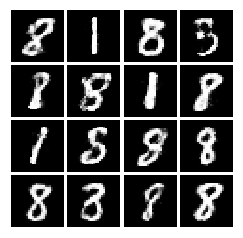

############################
Iter: 721000
D loss: 0.3063
G_loss: 3.498


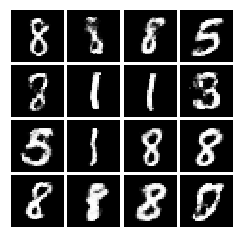

############################
Iter: 722000
D loss: 0.2605
G_loss: 4.45


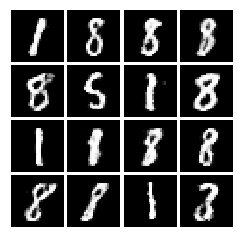

############################
Iter: 723000
D loss: 0.3146
G_loss: 3.844


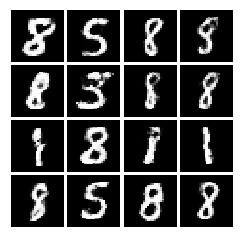

############################
Iter: 724000
D loss: 0.3355
G_loss: 4.375


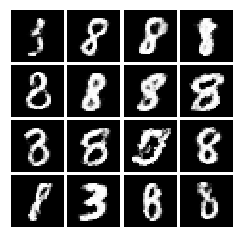

############################
Iter: 725000
D loss: 0.2432
G_loss: 4.17


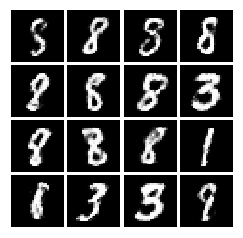

############################
Iter: 726000
D loss: 0.3039
G_loss: 5.068


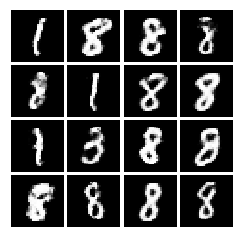

############################
Iter: 727000
D loss: 0.3002
G_loss: 4.289


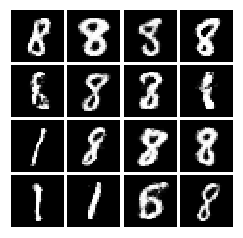

############################
Iter: 728000
D loss: 0.3134
G_loss: 4.458


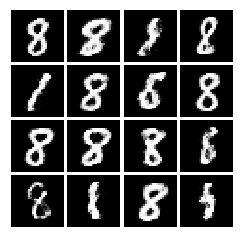

############################
Iter: 729000
D loss: 0.3081
G_loss: 4.091


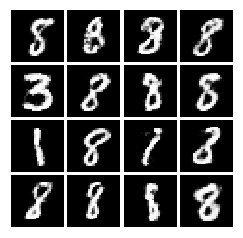

############################
Iter: 730000
D loss: 0.2796
G_loss: 3.475


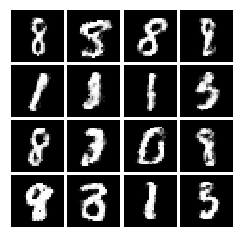

############################
Iter: 731000
D loss: 0.3849
G_loss: 4.139


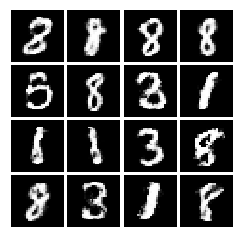

############################
Iter: 732000
D loss: 0.4248
G_loss: 3.992


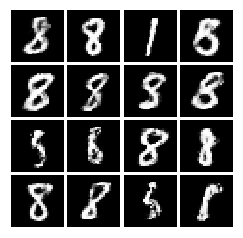

############################
Iter: 733000
D loss: 0.4275
G_loss: 4.065


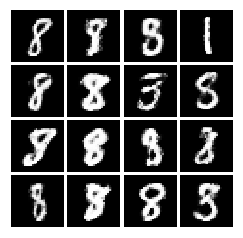

############################
Iter: 734000
D loss: 0.1958
G_loss: 3.343


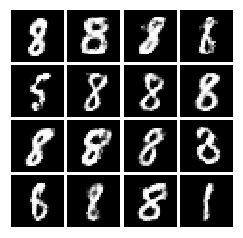

############################
Iter: 735000
D loss: 0.3236
G_loss: 4.205


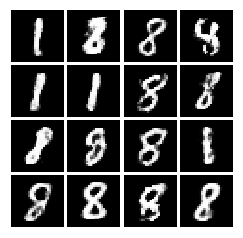

############################
Iter: 736000
D loss: 0.3314
G_loss: 4.327


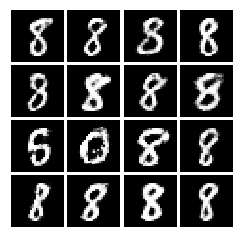

############################
Iter: 737000
D loss: 0.3246
G_loss: 4.377


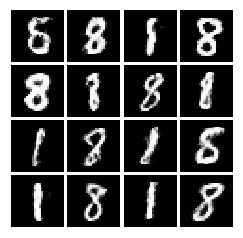

############################
Iter: 738000
D loss: 0.3491
G_loss: 3.685


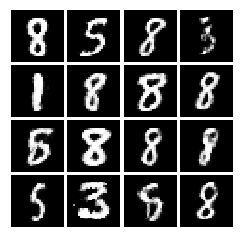

############################
Iter: 739000
D loss: 0.2857
G_loss: 4.572


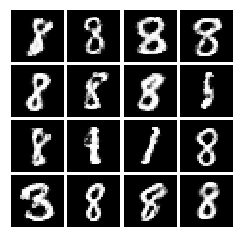

############################
Iter: 740000
D loss: 0.3256
G_loss: 4.07


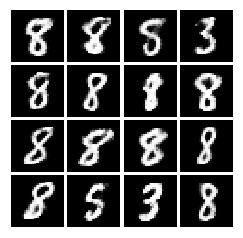

############################
Iter: 741000
D loss: 0.2407
G_loss: 4.174


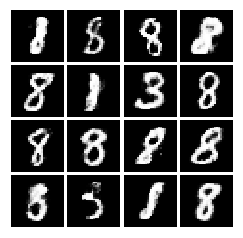

############################
Iter: 742000
D loss: 0.3446
G_loss: 3.765


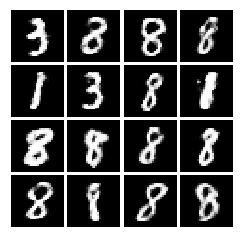

############################
Iter: 743000
D loss: 0.4998
G_loss: 3.488


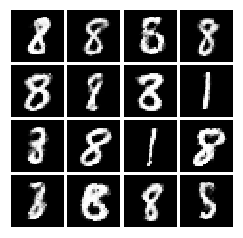

############################
Iter: 744000
D loss: 0.2953
G_loss: 4.002


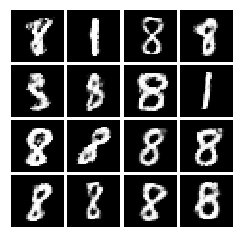

############################
Iter: 745000
D loss: 0.2131
G_loss: 3.998


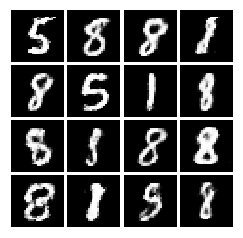

############################
Iter: 746000
D loss: 0.3366
G_loss: 3.884


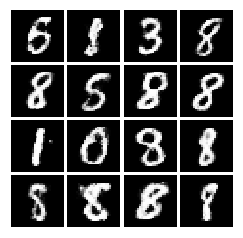

############################
Iter: 747000
D loss: 0.2751
G_loss: 4.075


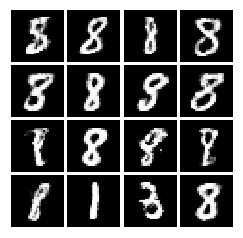

############################
Iter: 748000
D loss: 0.2672
G_loss: 3.623


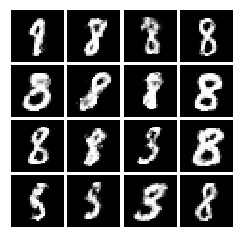

############################
Iter: 749000
D loss: 0.3495
G_loss: 3.808


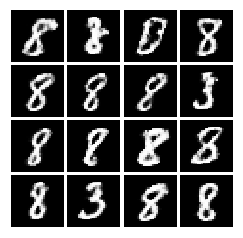

############################
Iter: 750000
D loss: 0.1835
G_loss: 4.499


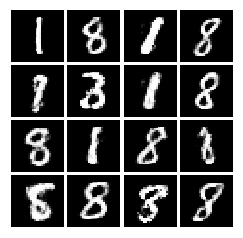

############################
Iter: 751000
D loss: 0.3873
G_loss: 4.171


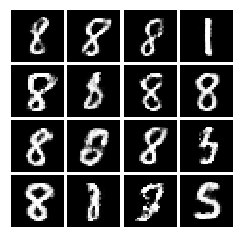

############################
Iter: 752000
D loss: 0.2886
G_loss: 4.111


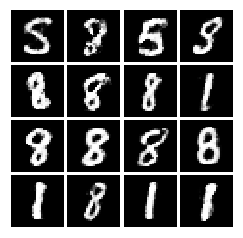

############################
Iter: 753000
D loss: 0.358
G_loss: 4.122


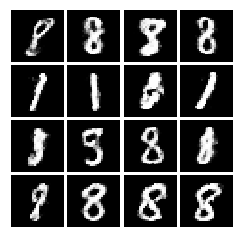

############################
Iter: 754000
D loss: 0.3139
G_loss: 4.15


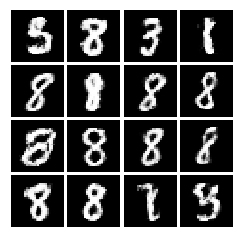

############################
Iter: 755000
D loss: 0.2863
G_loss: 3.938


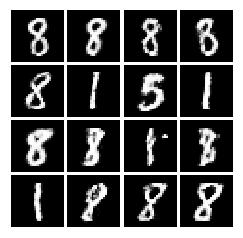

############################
Iter: 756000
D loss: 0.3722
G_loss: 3.744


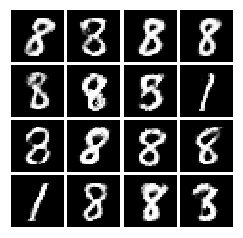

############################
Iter: 757000
D loss: 0.2964
G_loss: 3.86


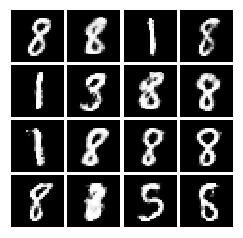

############################
Iter: 758000
D loss: 0.2935
G_loss: 4.033


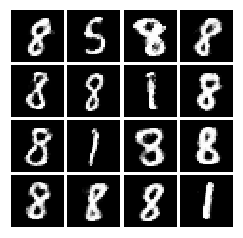

############################
Iter: 759000
D loss: 0.2508
G_loss: 4.488


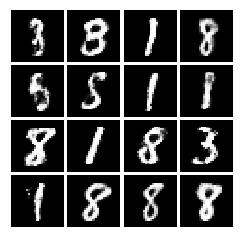

############################
Iter: 760000
D loss: 0.3761
G_loss: 4.16


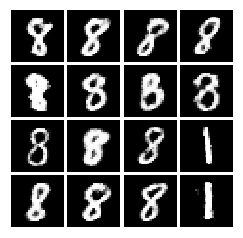

############################
Iter: 761000
D loss: 0.2592
G_loss: 3.989


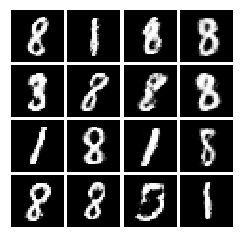

############################
Iter: 762000
D loss: 0.3176
G_loss: 4.113


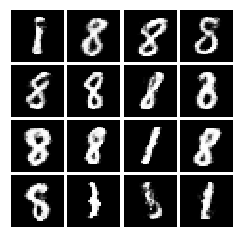

############################
Iter: 763000
D loss: 0.367
G_loss: 4.153


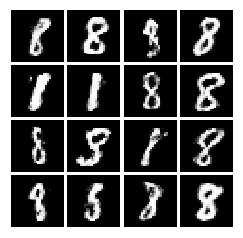

############################
Iter: 764000
D loss: 0.267
G_loss: 3.533


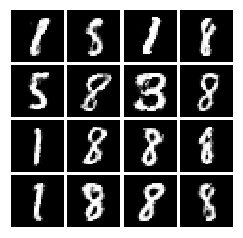

############################
Iter: 765000
D loss: 0.2207
G_loss: 3.868


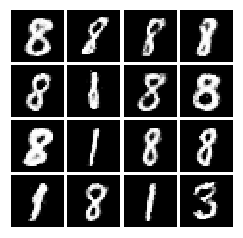

############################
Iter: 766000
D loss: 0.477
G_loss: 4.491


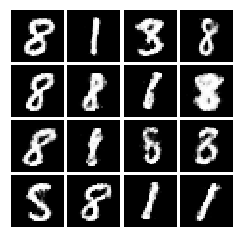

############################
Iter: 767000
D loss: 0.25
G_loss: 4.367


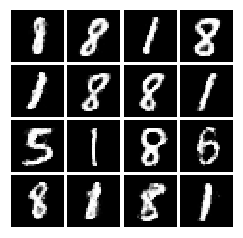

############################
Iter: 768000
D loss: 0.2551
G_loss: 3.723


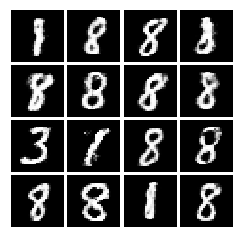

############################
Iter: 769000
D loss: 0.2655
G_loss: 3.186


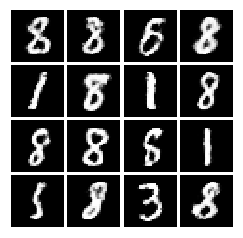

############################
Iter: 770000
D loss: 0.3101
G_loss: 4.313


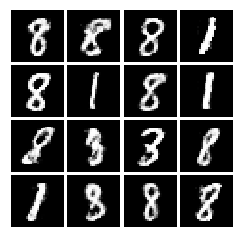

############################
Iter: 771000
D loss: 0.2628
G_loss: 3.734


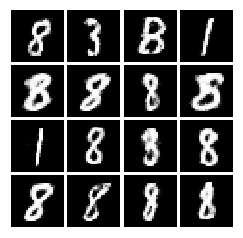

############################
Iter: 772000
D loss: 0.307
G_loss: 4.045


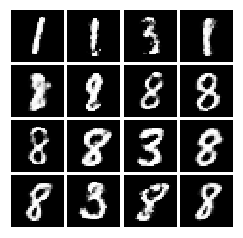

############################
Iter: 773000
D loss: 0.2955
G_loss: 4.236


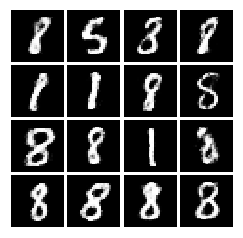

############################
Iter: 774000
D loss: 0.3416
G_loss: 4.049


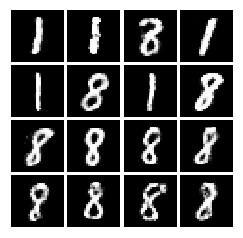

############################
Iter: 775000
D loss: 0.4038
G_loss: 3.713


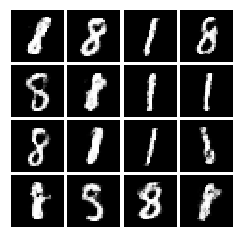

############################
Iter: 776000
D loss: 0.2851
G_loss: 3.291


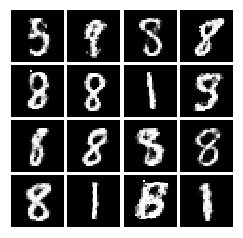

############################
Iter: 777000
D loss: 0.225
G_loss: 3.969


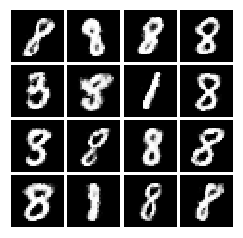

############################
Iter: 778000
D loss: 0.3062
G_loss: 3.807


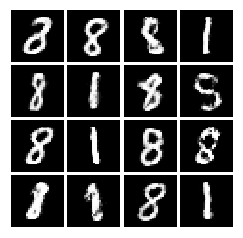

############################
Iter: 779000
D loss: 0.3575
G_loss: 3.863


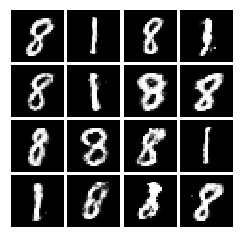

############################
Iter: 780000
D loss: 0.2904
G_loss: 3.943


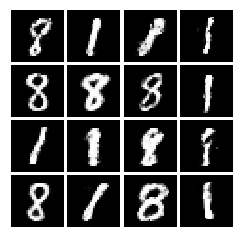

############################
Iter: 781000
D loss: 0.247
G_loss: 4.423


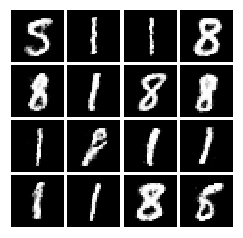

############################
Iter: 782000
D loss: 0.2458
G_loss: 4.302


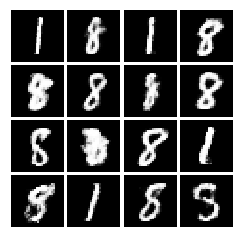

############################
Iter: 783000
D loss: 0.3139
G_loss: 3.739


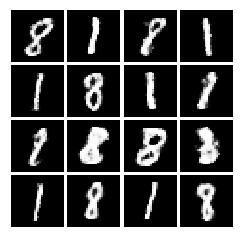

############################
Iter: 784000
D loss: 0.3792
G_loss: 3.427


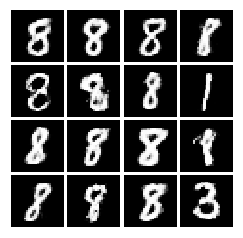

############################
Iter: 785000
D loss: 0.401
G_loss: 3.846


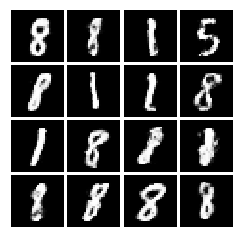

############################
Iter: 786000
D loss: 0.3593
G_loss: 4.339


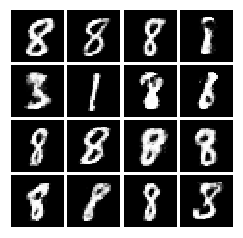

############################
Iter: 787000
D loss: 0.2463
G_loss: 3.816


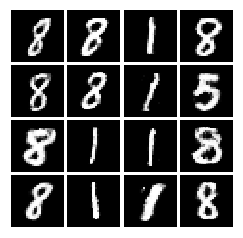

############################
Iter: 788000
D loss: 0.2649
G_loss: 3.674


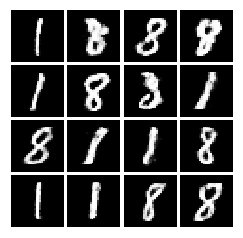

############################
Iter: 789000
D loss: 0.3204
G_loss: 3.48


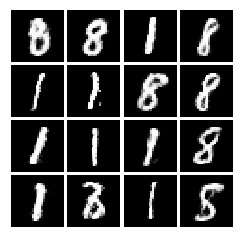

############################
Iter: 790000
D loss: 0.3188
G_loss: 4.187


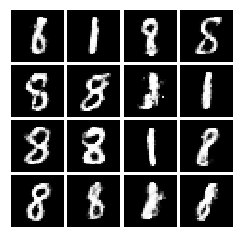

############################
Iter: 791000
D loss: 0.3365
G_loss: 3.579


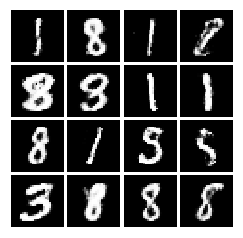

############################
Iter: 792000
D loss: 0.3734
G_loss: 4.045


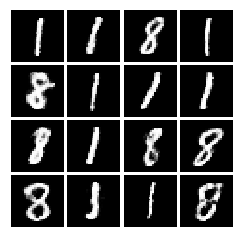

############################
Iter: 793000
D loss: 0.2949
G_loss: 3.63


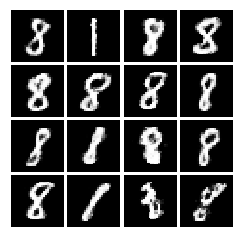

############################
Iter: 794000
D loss: 0.1611
G_loss: 3.295


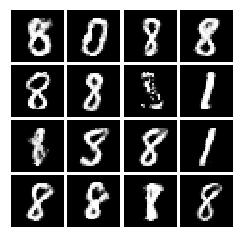

############################
Iter: 795000
D loss: 0.219
G_loss: 3.608


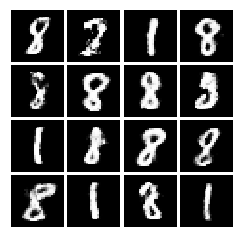

############################
Iter: 796000
D loss: 0.4377
G_loss: 2.882


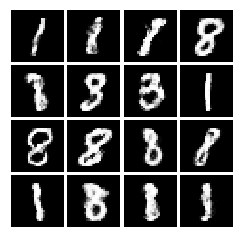

############################
Iter: 797000
D loss: 0.2759
G_loss: 4.195


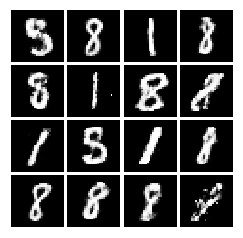

############################
Iter: 798000
D loss: 0.2319
G_loss: 4.115


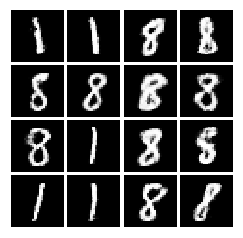

############################
Iter: 799000
D loss: 0.2186
G_loss: 3.7


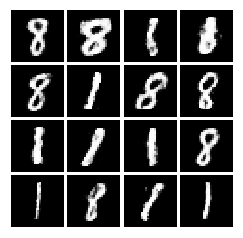

############################
Iter: 800000
D loss: 0.2683
G_loss: 3.638


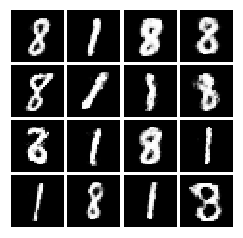

############################
Iter: 801000
D loss: 0.4018
G_loss: 3.697


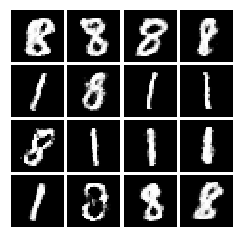

############################
Iter: 802000
D loss: 0.3256
G_loss: 4.043


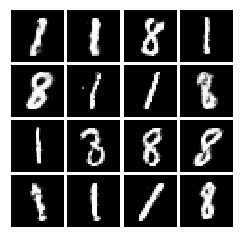

############################
Iter: 803000
D loss: 0.3176
G_loss: 4.247


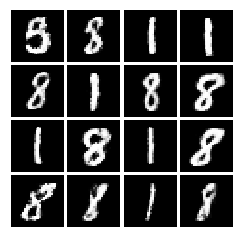

############################
Iter: 804000
D loss: 0.2965
G_loss: 3.507


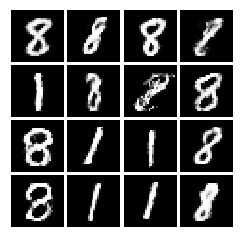

############################
Iter: 805000
D loss: 0.4092
G_loss: 3.335


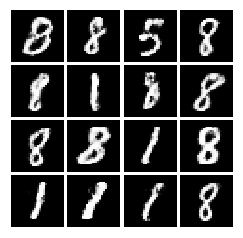

############################
Iter: 806000
D loss: 0.3702
G_loss: 3.975


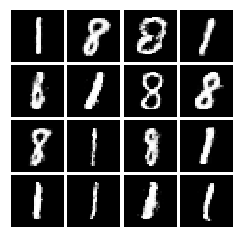

############################
Iter: 807000
D loss: 0.2552
G_loss: 3.646


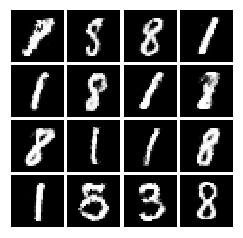

############################
Iter: 808000
D loss: 0.2114
G_loss: 4.169


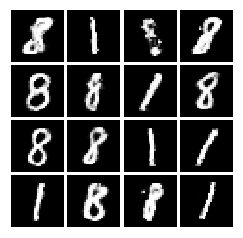

############################
Iter: 809000
D loss: 0.28
G_loss: 3.532


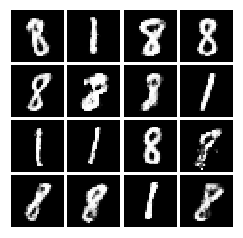

############################
Iter: 810000
D loss: 0.2665
G_loss: 3.918


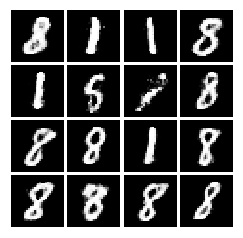

############################
Iter: 811000
D loss: 0.3476
G_loss: 3.521


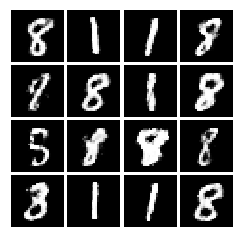

############################
Iter: 812000
D loss: 0.3052
G_loss: 3.31


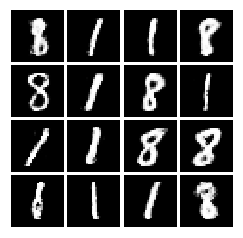

############################
Iter: 813000
D loss: 0.3093
G_loss: 3.831


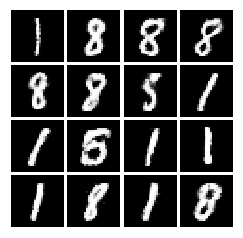

############################
Iter: 814000
D loss: 0.3829
G_loss: 3.687


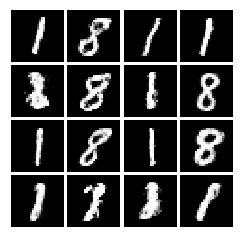

############################
Iter: 815000
D loss: 0.2711
G_loss: 3.423


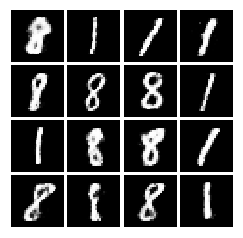

############################
Iter: 816000
D loss: 0.4201
G_loss: 3.635


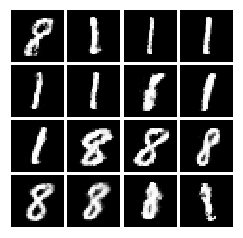

############################
Iter: 817000
D loss: 0.2014
G_loss: 4.203


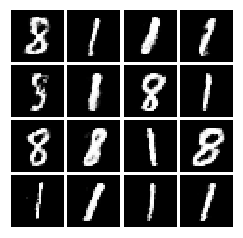

############################
Iter: 818000
D loss: 0.3736
G_loss: 3.77


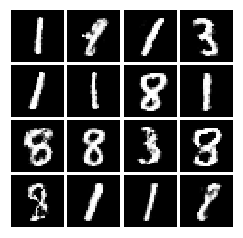

############################
Iter: 819000
D loss: 0.339
G_loss: 3.472


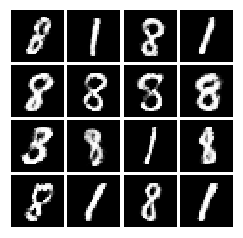

############################
Iter: 820000
D loss: 0.3482
G_loss: 3.596


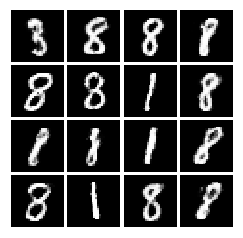

############################
Iter: 821000
D loss: 0.397
G_loss: 3.665


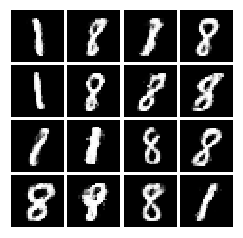

############################
Iter: 822000
D loss: 0.3469
G_loss: 4.569


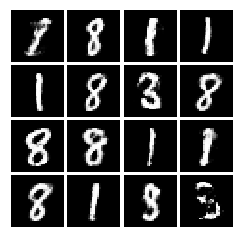

############################
Iter: 823000
D loss: 0.3748
G_loss: 3.617


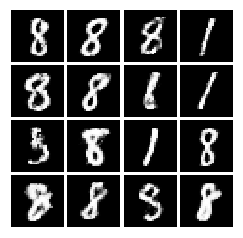

############################
Iter: 824000
D loss: 0.2853
G_loss: 3.785


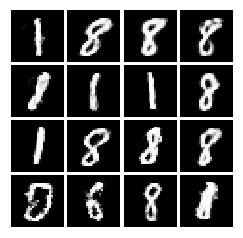

############################
Iter: 825000
D loss: 0.224
G_loss: 3.928


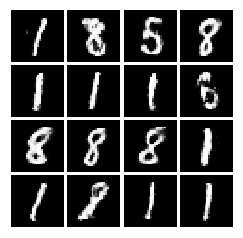

############################
Iter: 826000
D loss: 0.3219
G_loss: 3.678


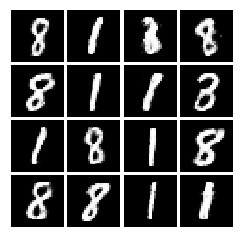

############################
Iter: 827000
D loss: 0.2663
G_loss: 3.633


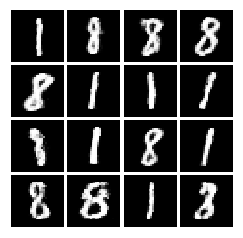

############################
Iter: 828000
D loss: 0.2247
G_loss: 3.534


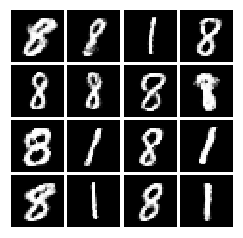

############################
Iter: 829000
D loss: 0.3994
G_loss: 3.554


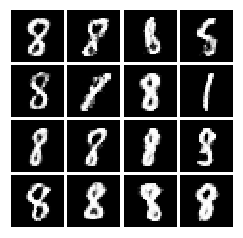

############################
Iter: 830000
D loss: 0.3085
G_loss: 3.617


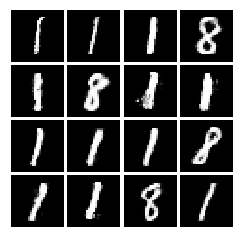

############################
Iter: 831000
D loss: 0.2598
G_loss: 3.482


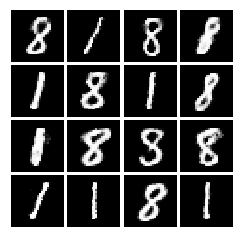

############################
Iter: 832000
D loss: 0.4511
G_loss: 4.101


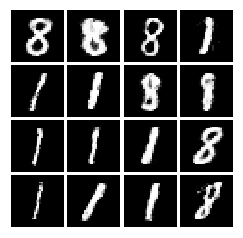

############################
Iter: 833000
D loss: 0.2278
G_loss: 3.477


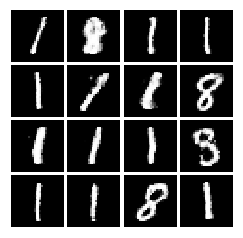

############################
Iter: 834000
D loss: 0.3696
G_loss: 3.861


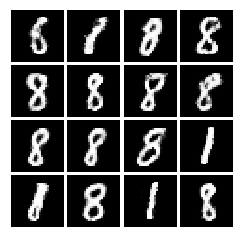

############################
Iter: 835000
D loss: 0.2863
G_loss: 3.261


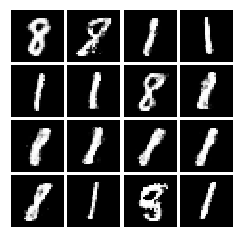

############################
Iter: 836000
D loss: 0.3204
G_loss: 3.41


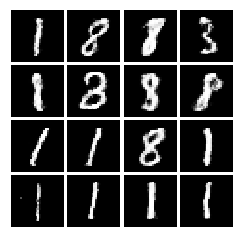

############################
Iter: 837000
D loss: 0.3472
G_loss: 3.809


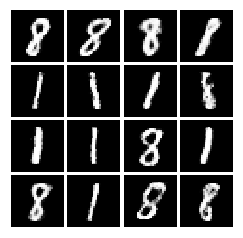

############################
Iter: 838000
D loss: 0.3229
G_loss: 3.44


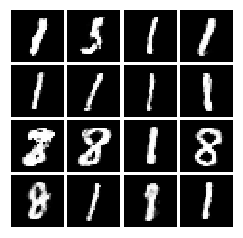

############################
Iter: 839000
D loss: 0.2454
G_loss: 3.929


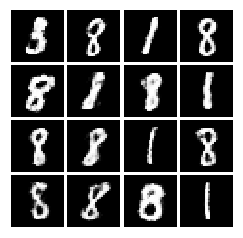

############################
Iter: 840000
D loss: 0.3172
G_loss: 3.538


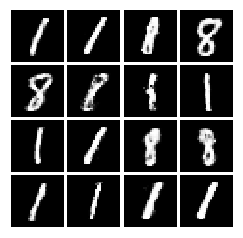

############################
Iter: 841000
D loss: 0.3006
G_loss: 3.819


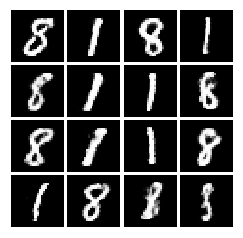

############################
Iter: 842000
D loss: 0.3238
G_loss: 3.538


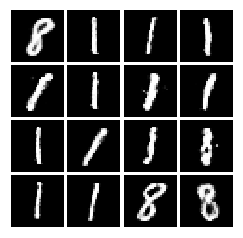

############################
Iter: 843000
D loss: 0.2723
G_loss: 3.378


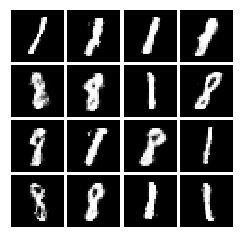

############################
Iter: 844000
D loss: 0.2359
G_loss: 3.583


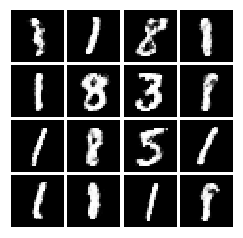

############################
Iter: 845000
D loss: 0.3404
G_loss: 3.231


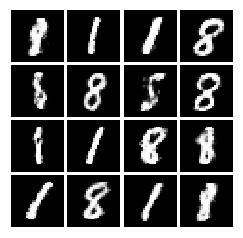

############################
Iter: 846000
D loss: 0.3622
G_loss: 3.94


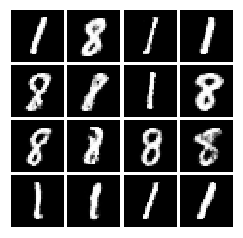

############################
Iter: 847000
D loss: 0.2954
G_loss: 3.515


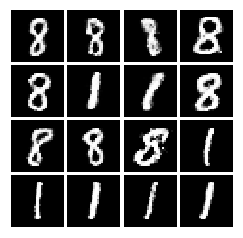

############################
Iter: 848000
D loss: 0.2431
G_loss: 3.598


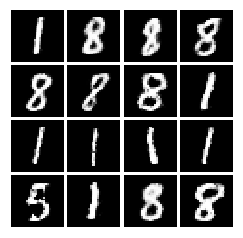

############################
Iter: 849000
D loss: 0.2533
G_loss: 3.935


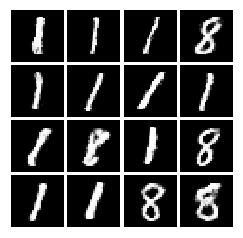

############################
Iter: 850000
D loss: 0.2556
G_loss: 3.178


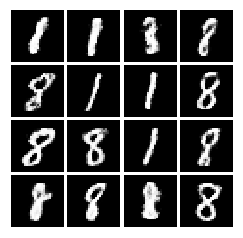

############################
Iter: 851000
D loss: 0.3735
G_loss: 3.246


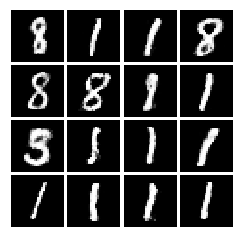

############################
Iter: 852000
D loss: 0.3608
G_loss: 4.264


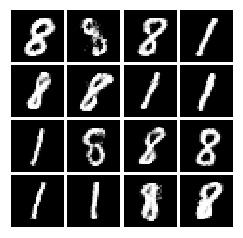

############################
Iter: 853000
D loss: 0.31
G_loss: 3.498


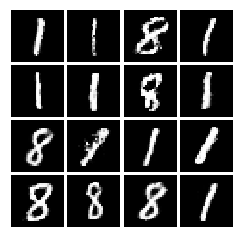

############################
Iter: 854000
D loss: 0.2725
G_loss: 3.765


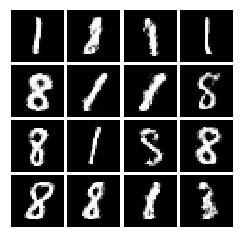

############################
Iter: 855000
D loss: 0.3545
G_loss: 3.597


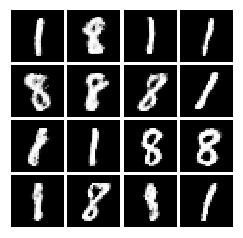

############################
Iter: 856000
D loss: 0.3003
G_loss: 3.204


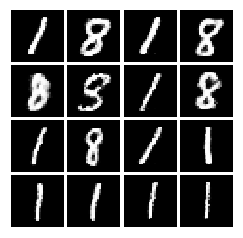

############################
Iter: 857000
D loss: 0.2069
G_loss: 3.415


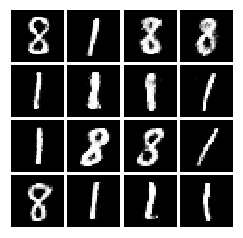

############################
Iter: 858000
D loss: 0.2492
G_loss: 3.353


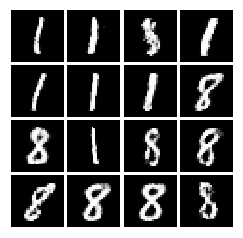

############################
Iter: 859000
D loss: 0.3044
G_loss: 4.372


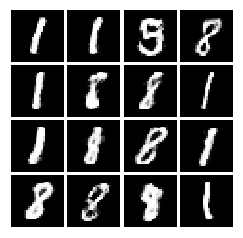

############################
Iter: 860000
D loss: 0.2833
G_loss: 3.205


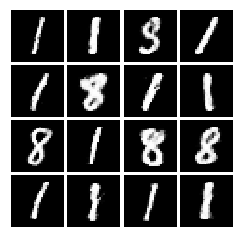

############################
Iter: 861000
D loss: 0.3359
G_loss: 3.263


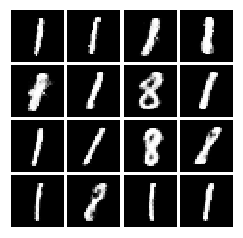

############################
Iter: 862000
D loss: 0.3673
G_loss: 3.695


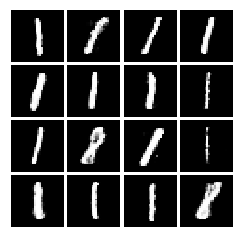

############################
Iter: 863000
D loss: 0.3654
G_loss: 3.156


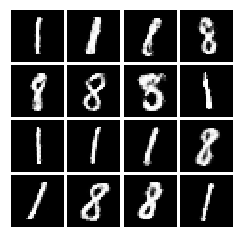

############################
Iter: 864000
D loss: 0.2337
G_loss: 3.362


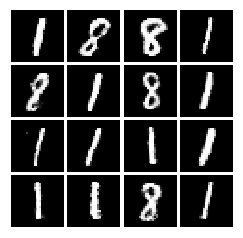

############################
Iter: 865000
D loss: 0.3013
G_loss: 3.515


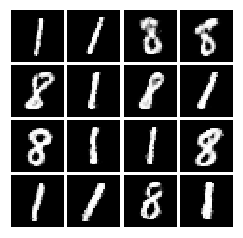

############################
Iter: 866000
D loss: 0.2573
G_loss: 3.343


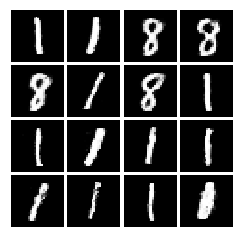

############################
Iter: 867000
D loss: 0.3973
G_loss: 3.46


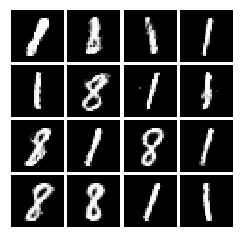

############################
Iter: 868000
D loss: 0.3311
G_loss: 3.175


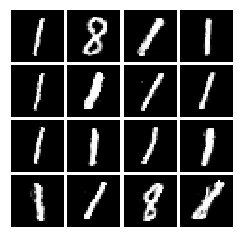

############################
Iter: 869000
D loss: 0.2978
G_loss: 3.157


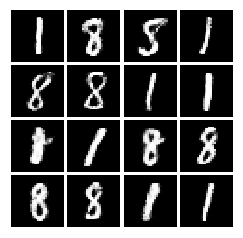

############################
Iter: 870000
D loss: 0.2623
G_loss: 4.037


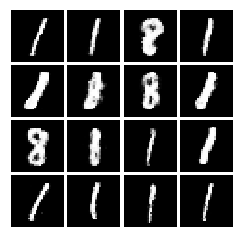

############################
Iter: 871000
D loss: 0.2228
G_loss: 3.973


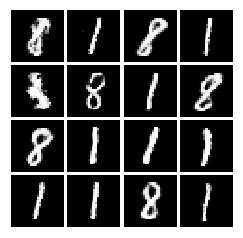

############################
Iter: 872000
D loss: 0.2407
G_loss: 3.456


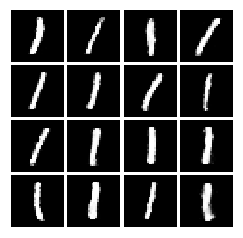

############################
Iter: 873000
D loss: 0.2422
G_loss: 3.451


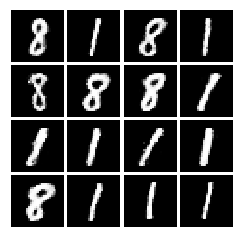

############################
Iter: 874000
D loss: 0.2153
G_loss: 3.383


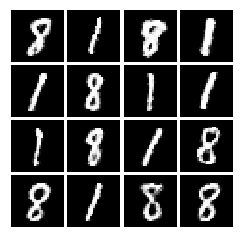

############################
Iter: 875000
D loss: 0.2609
G_loss: 3.742


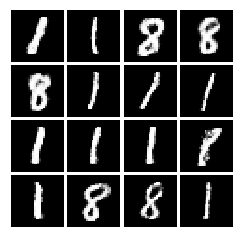

############################
Iter: 876000
D loss: 0.1864
G_loss: 3.475


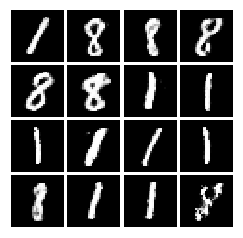

############################
Iter: 877000
D loss: 0.2484
G_loss: 4.198


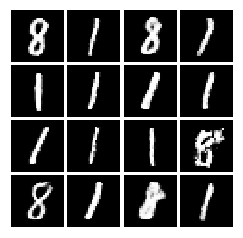

############################
Iter: 878000
D loss: 0.2828
G_loss: 3.423


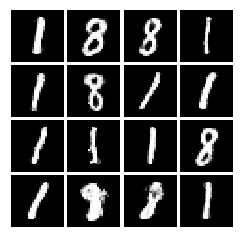

############################
Iter: 879000
D loss: 0.5297
G_loss: 3.348


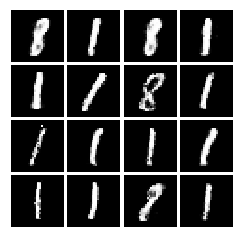

############################
Iter: 880000
D loss: 0.2673
G_loss: 4.012


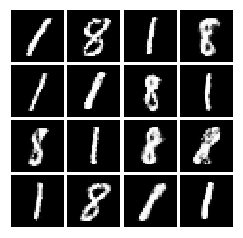

############################
Iter: 881000
D loss: 0.3115
G_loss: 3.463


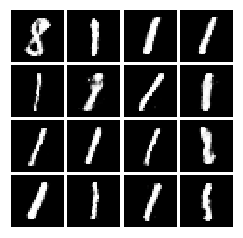

############################
Iter: 882000
D loss: 0.2564
G_loss: 3.691


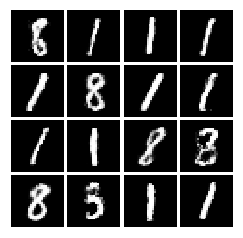

############################
Iter: 883000
D loss: 0.2567
G_loss: 3.868


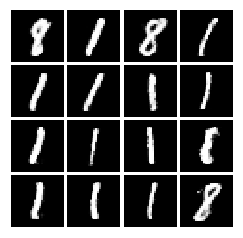

############################
Iter: 884000
D loss: 0.2622
G_loss: 2.956


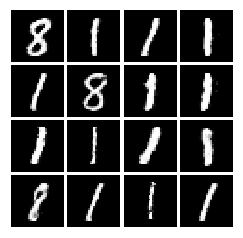

############################
Iter: 885000
D loss: 0.2976
G_loss: 3.34


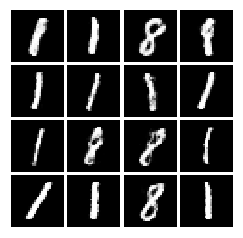

############################
Iter: 886000
D loss: 0.304
G_loss: 3.916


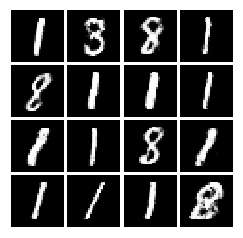

############################
Iter: 887000
D loss: 0.2988
G_loss: 3.657


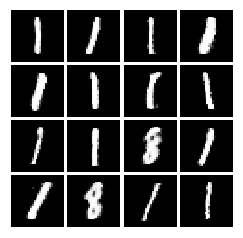

############################
Iter: 888000
D loss: 0.308
G_loss: 3.558


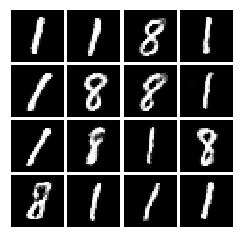

############################
Iter: 889000
D loss: 0.3101
G_loss: 3.6


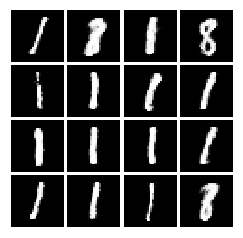

############################
Iter: 890000
D loss: 0.252
G_loss: 3.52


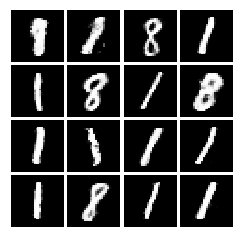

############################
Iter: 891000
D loss: 0.292
G_loss: 3.734


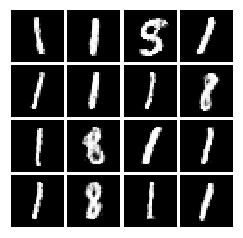

############################
Iter: 892000
D loss: 0.2855
G_loss: 4.223


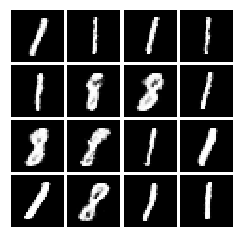

############################
Iter: 893000
D loss: 0.2671
G_loss: 3.336


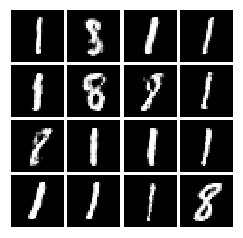

############################
Iter: 894000
D loss: 0.3007
G_loss: 3.011


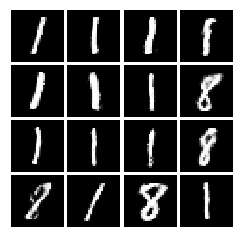

############################
Iter: 895000
D loss: 0.2797
G_loss: 3.401


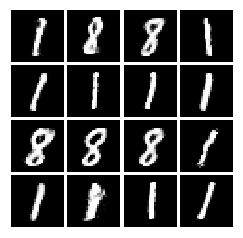

############################
Iter: 896000
D loss: 0.2376
G_loss: 3.538


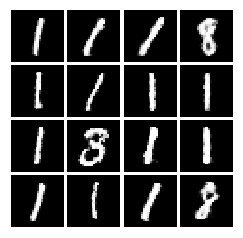

############################
Iter: 897000
D loss: 0.2309
G_loss: 3.17


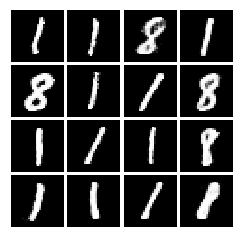

############################
Iter: 898000
D loss: 0.2596
G_loss: 3.806


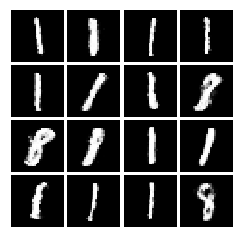

############################
Iter: 899000
D loss: 0.3637
G_loss: 3.281


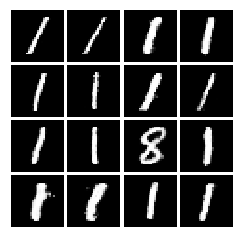

############################
Iter: 900000
D loss: 0.2196
G_loss: 3.847


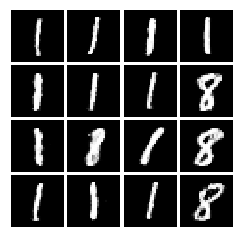

############################
Iter: 901000
D loss: 0.3327
G_loss: 3.672


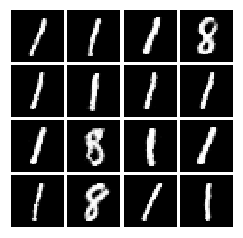

############################
Iter: 902000
D loss: 0.2295
G_loss: 3.673


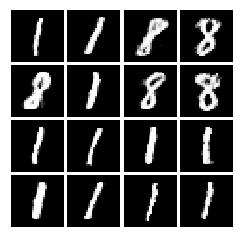

############################
Iter: 903000
D loss: 0.29
G_loss: 3.306


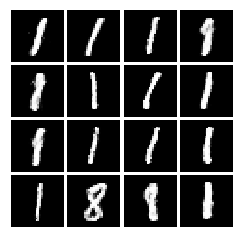

############################
Iter: 904000
D loss: 0.3407
G_loss: 3.8


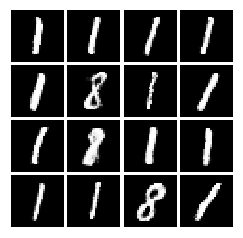

############################
Iter: 905000
D loss: 0.2892
G_loss: 3.137


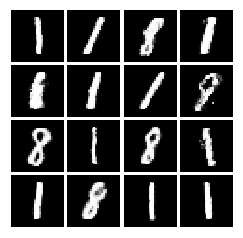

############################
Iter: 906000
D loss: 0.3046
G_loss: 3.369


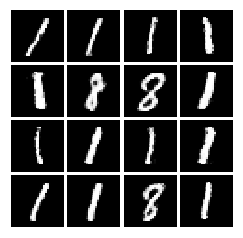

############################
Iter: 907000
D loss: 0.3243
G_loss: 3.354


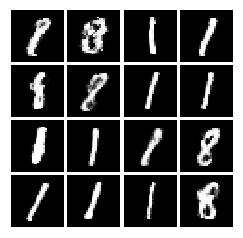

############################
Iter: 908000
D loss: 0.2939
G_loss: 3.322


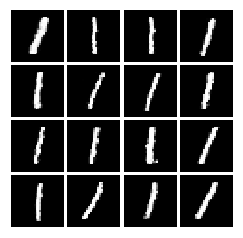

############################
Iter: 909000
D loss: 0.3226
G_loss: 3.263


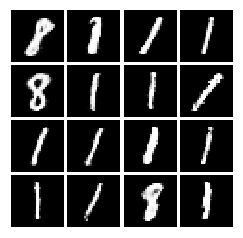

############################
Iter: 910000
D loss: 0.3165
G_loss: 3.518


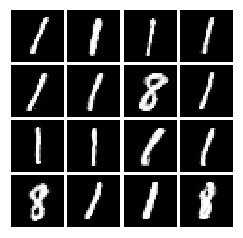

############################
Iter: 911000
D loss: 0.3936
G_loss: 3.998


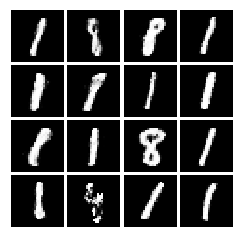

############################
Iter: 912000
D loss: 0.2801
G_loss: 3.734


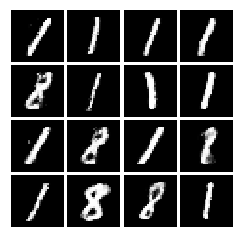

############################
Iter: 913000
D loss: 0.2957
G_loss: 3.538


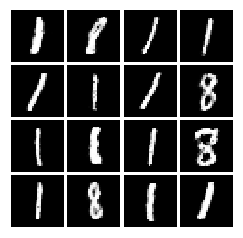

############################
Iter: 914000
D loss: 0.4008
G_loss: 3.433


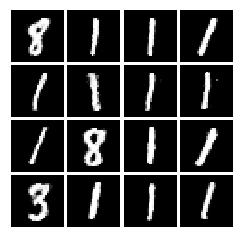

############################
Iter: 915000
D loss: 0.3039
G_loss: 3.258


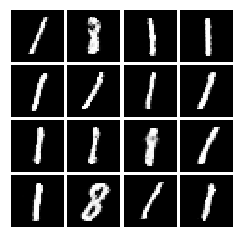

############################
Iter: 916000
D loss: 0.3757
G_loss: 3.546


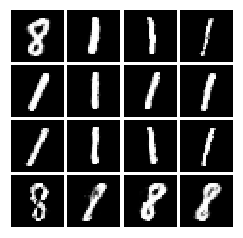

############################
Iter: 917000
D loss: 0.2099
G_loss: 4.052


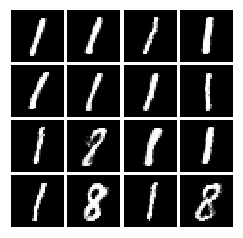

############################
Iter: 918000
D loss: 0.3491
G_loss: 3.23


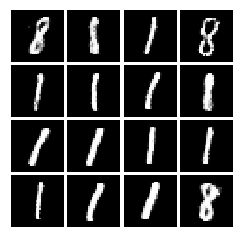

############################
Iter: 919000
D loss: 0.3229
G_loss: 3.093


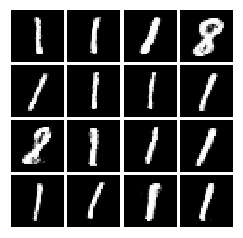

############################
Iter: 920000
D loss: 0.2399
G_loss: 3.439


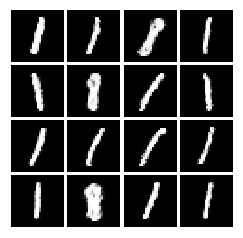

############################
Iter: 921000
D loss: 0.2482
G_loss: 3.219


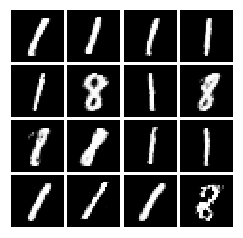

############################
Iter: 922000
D loss: 0.2809
G_loss: 3.57


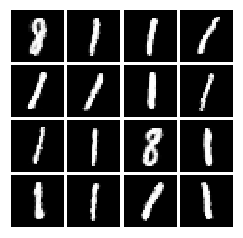

############################
Iter: 923000
D loss: 0.2186
G_loss: 3.654


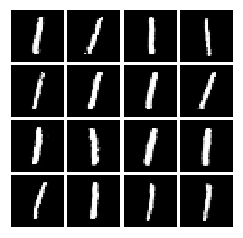

############################
Iter: 924000
D loss: 0.3238
G_loss: 3.492


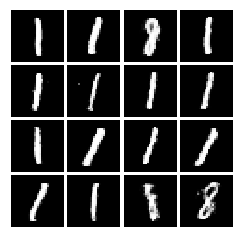

############################
Iter: 925000
D loss: 0.2916
G_loss: 3.425


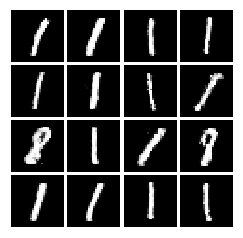

############################
Iter: 926000
D loss: 0.2108
G_loss: 3.711


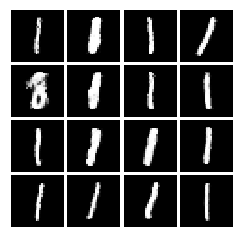

############################
Iter: 927000
D loss: 0.2695
G_loss: 3.111


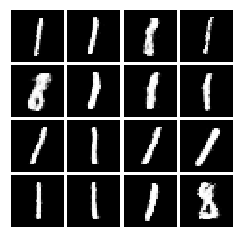

############################
Iter: 928000
D loss: 0.2311
G_loss: 3.297


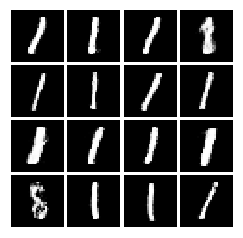

############################
Iter: 929000
D loss: 0.1631
G_loss: 3.325


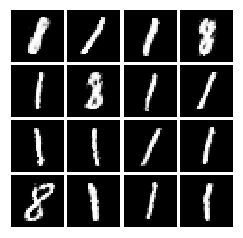

############################
Iter: 930000
D loss: 0.2987
G_loss: 3.201


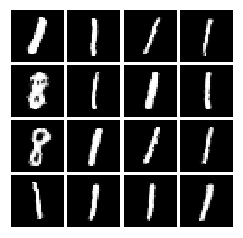

############################
Iter: 931000
D loss: 0.2452
G_loss: 3.285


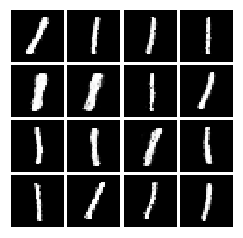

############################
Iter: 932000
D loss: 0.2536
G_loss: 3.402


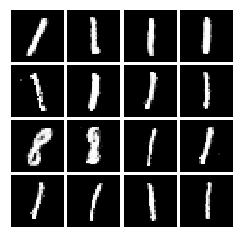

############################
Iter: 933000
D loss: 0.3384
G_loss: 3.711


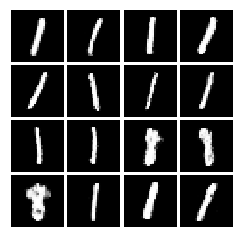

############################
Iter: 934000
D loss: 0.2197
G_loss: 3.467


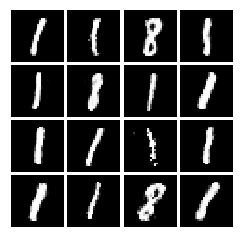

############################
Iter: 935000
D loss: 0.2795
G_loss: 3.31


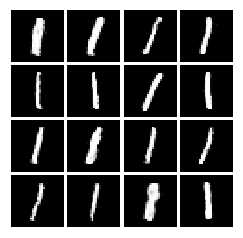

############################
Iter: 936000
D loss: 0.3186
G_loss: 2.906


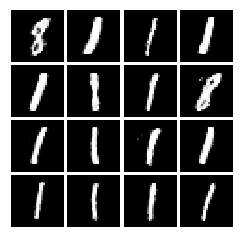

############################
Iter: 937000
D loss: 0.3087
G_loss: 3.544


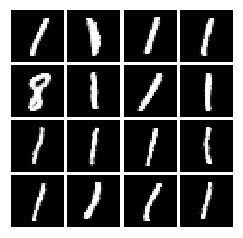

############################
Iter: 938000
D loss: 0.242
G_loss: 4.153


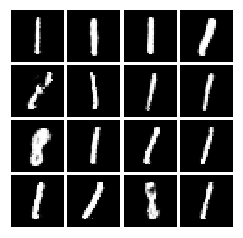

############################
Iter: 939000
D loss: 0.277
G_loss: 3.582


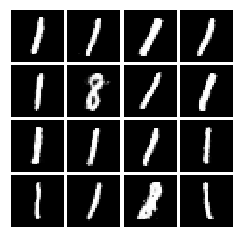

############################
Iter: 940000
D loss: 0.2344
G_loss: 3.365


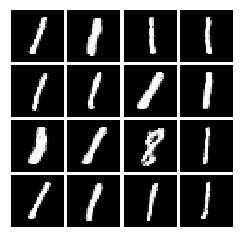

############################
Iter: 941000
D loss: 0.2624
G_loss: 3.331


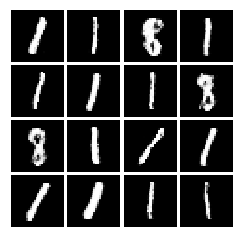

############################
Iter: 942000
D loss: 0.187
G_loss: 3.037


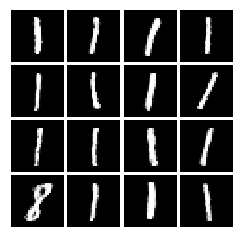

############################
Iter: 943000
D loss: 0.1635
G_loss: 2.929


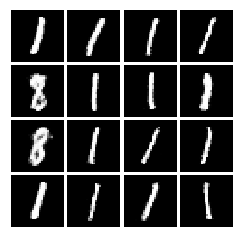

############################
Iter: 944000
D loss: 0.211
G_loss: 3.474


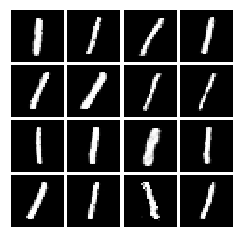

############################
Iter: 945000
D loss: 0.2522
G_loss: 3.513


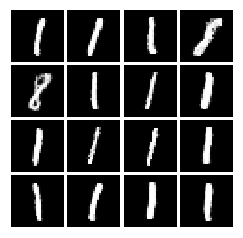

############################
Iter: 946000
D loss: 0.2387
G_loss: 3.196


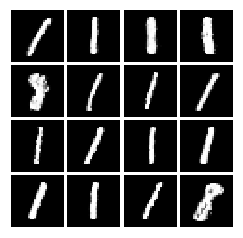

############################
Iter: 947000
D loss: 0.2053
G_loss: 3.475


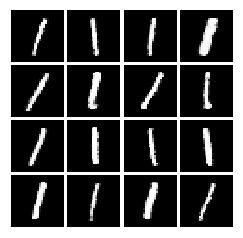

############################
Iter: 948000
D loss: 0.2969
G_loss: 3.137


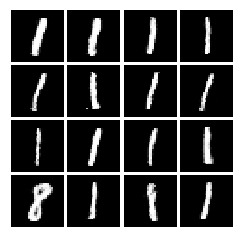

############################
Iter: 949000
D loss: 0.2999
G_loss: 3.274


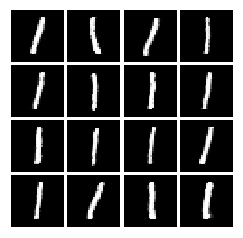

############################
Iter: 950000
D loss: 0.3423
G_loss: 3.183


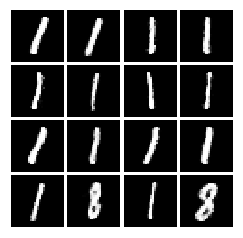

############################
Iter: 951000
D loss: 0.2223
G_loss: 3.238


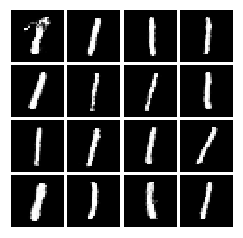

############################
Iter: 952000
D loss: 0.2056
G_loss: 2.943


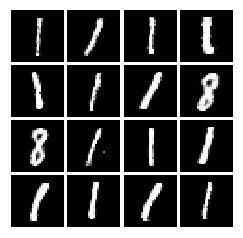

############################
Iter: 953000
D loss: 0.2878
G_loss: 3.263


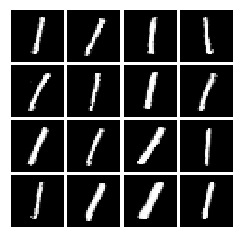

############################
Iter: 954000
D loss: 0.2551
G_loss: 3.745


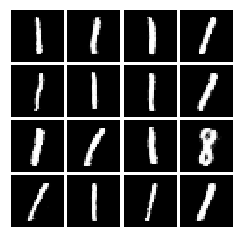

############################
Iter: 955000
D loss: 0.3817
G_loss: 3.03


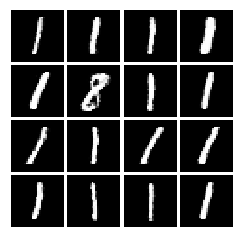

############################
Iter: 956000
D loss: 0.2796
G_loss: 2.8


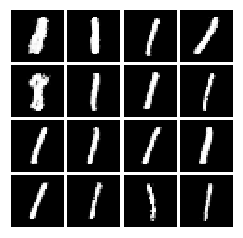

############################
Iter: 957000
D loss: 0.2892
G_loss: 3.657


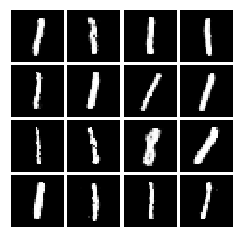

############################
Iter: 958000
D loss: 0.2246
G_loss: 3.176


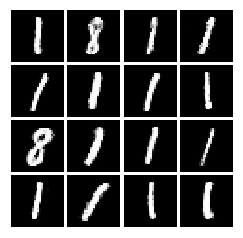

############################
Iter: 959000
D loss: 0.2184
G_loss: 3.461


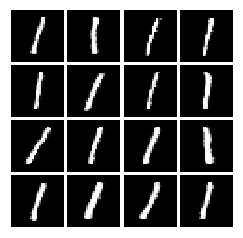

############################
Iter: 960000
D loss: 0.3142
G_loss: 2.9


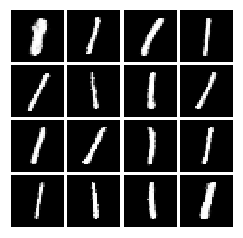

############################
Iter: 961000
D loss: 0.2167
G_loss: 3.209


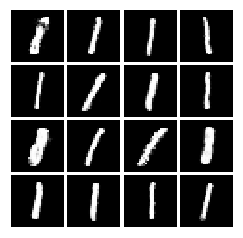

############################
Iter: 962000
D loss: 0.2535
G_loss: 3.771


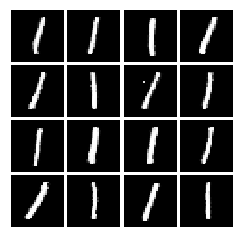

############################
Iter: 963000
D loss: 0.3333
G_loss: 3.46


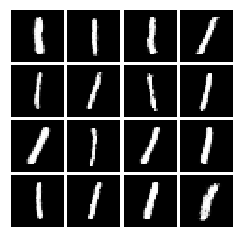

############################
Iter: 964000
D loss: 0.1919
G_loss: 3.301


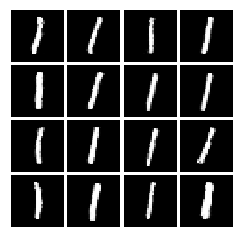

############################
Iter: 965000
D loss: 0.1689
G_loss: 2.928


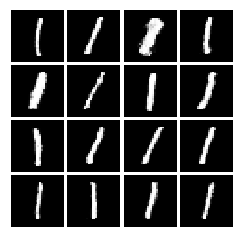

############################
Iter: 966000
D loss: 0.288
G_loss: 3.327


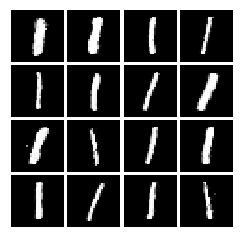

############################
Iter: 967000
D loss: 0.2351
G_loss: 3.018


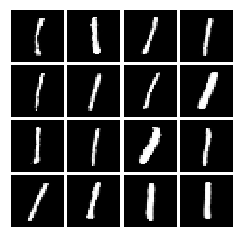

############################
Iter: 968000
D loss: 0.1657
G_loss: 3.271


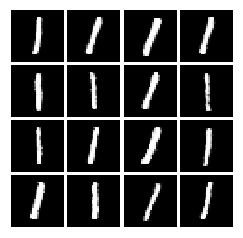

############################
Iter: 969000
D loss: 0.2165
G_loss: 2.643


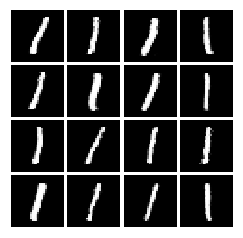

############################
Iter: 970000
D loss: 0.2234
G_loss: 2.696


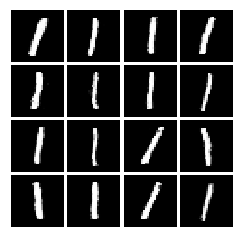

############################
Iter: 971000
D loss: 0.2969
G_loss: 3.138


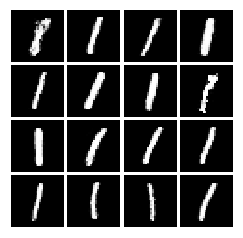

############################
Iter: 972000
D loss: 0.2023
G_loss: 3.151


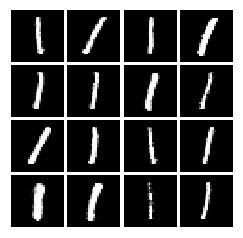

############################
Iter: 973000
D loss: 0.3242
G_loss: 3.918


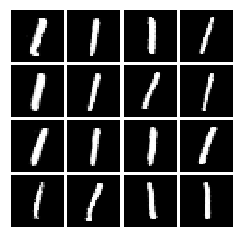

############################
Iter: 974000
D loss: 0.2958
G_loss: 3.0


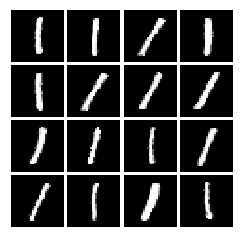

############################
Iter: 975000
D loss: 0.3124
G_loss: 3.288


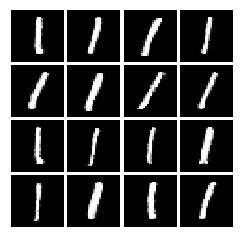

############################
Iter: 976000
D loss: 0.3174
G_loss: 3.434


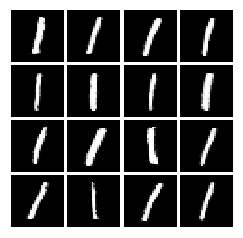

############################
Iter: 977000
D loss: 0.2053
G_loss: 3.764


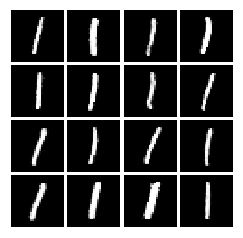

############################
Iter: 978000
D loss: 0.3212
G_loss: 2.876


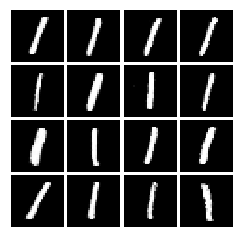

############################
Iter: 979000
D loss: 0.2456
G_loss: 3.187


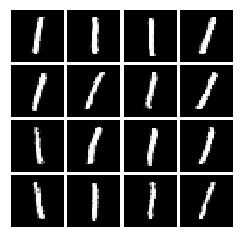

############################
Iter: 980000
D loss: 0.1742
G_loss: 3.241


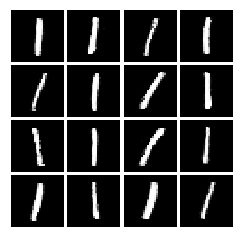

############################
Iter: 981000
D loss: 0.2394
G_loss: 3.299


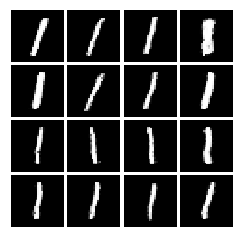

############################
Iter: 982000
D loss: 0.2742
G_loss: 3.752


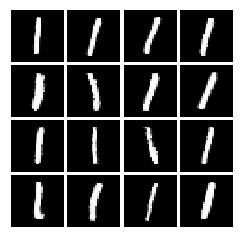

############################
Iter: 983000
D loss: 0.1518
G_loss: 4.133


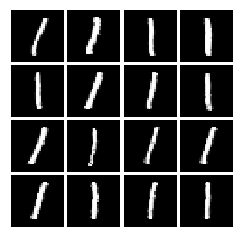

############################
Iter: 984000
D loss: 0.1708
G_loss: 3.078


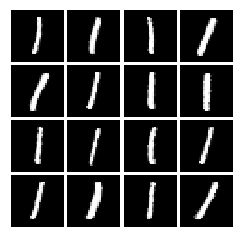

############################
Iter: 985000
D loss: 0.3188
G_loss: 3.413


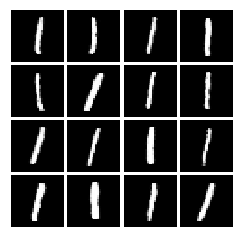

############################
Iter: 986000
D loss: 0.1849
G_loss: 3.702


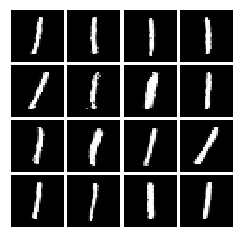

############################
Iter: 987000
D loss: 0.3187
G_loss: 3.535


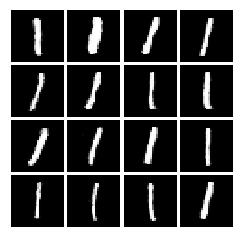

############################
Iter: 988000
D loss: 0.1382
G_loss: 3.335


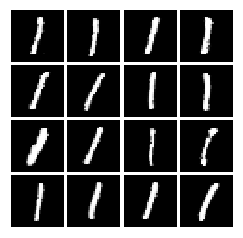

############################
Iter: 989000
D loss: 0.2443
G_loss: 3.322


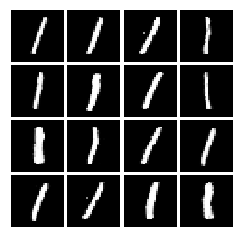

############################
Iter: 990000
D loss: 0.2836
G_loss: 2.894


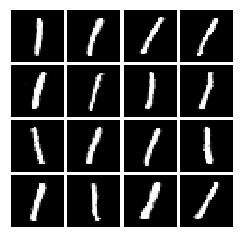

############################
Iter: 991000
D loss: 0.1936
G_loss: 3.208


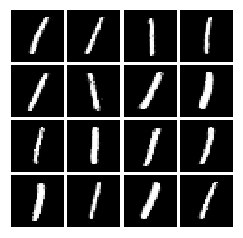

############################
Iter: 992000
D loss: 0.179
G_loss: 2.956


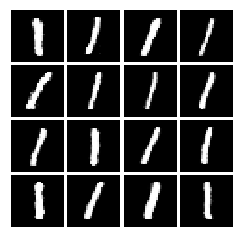

############################
Iter: 993000
D loss: 0.2389
G_loss: 2.81


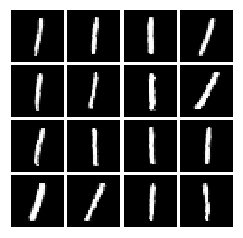

############################
Iter: 994000
D loss: 0.2008
G_loss: 3.568


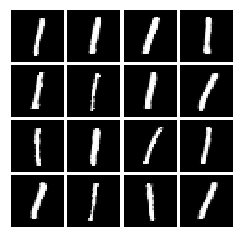

############################
Iter: 995000
D loss: 0.2173
G_loss: 3.088


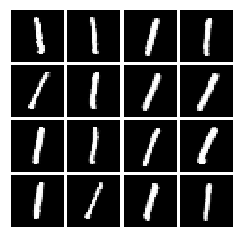

############################
Iter: 996000
D loss: 0.2857
G_loss: 3.508


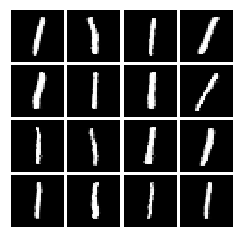

############################
Iter: 997000
D loss: 0.1686
G_loss: 3.308


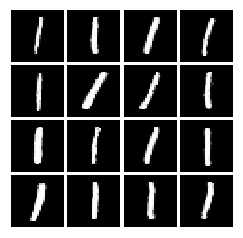

############################
Iter: 998000
D loss: 0.2413
G_loss: 3.412


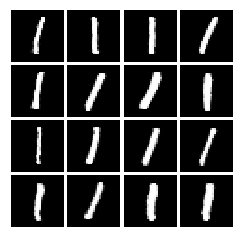

############################
Iter: 999000
D loss: 0.2477
G_loss: 3.156


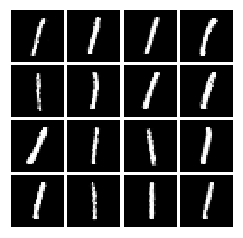

############################


In [10]:
for it in range(max_iter):

    #### train ####
    X, _ = mnist.train.next_batch(batch_size)

    _, D_loss_curr = sess.run([D_optimizer, D_loss], feed_dict={input_img: X, Z: sample_Z(batch_size, Z_dim)})
    _, G_loss_curr = sess.run([G_optimizer, G_loss], feed_dict={Z: sample_Z(batch_size, Z_dim)}) 

    if it % 1000 == 0:
        print('Iter: {}'.format(it))
        print('D loss: {:.4}'. format(D_loss_curr))
        print('G_loss: {:.4}'.format(G_loss_curr))
                                     
        samples = sess.run(G_sample, feed_dict={Z: sample_Z(16, Z_dim)})
        fig = plot(samples)
        plt.show()
        plt.close(fig)
        print('############################')
                                     
                                     